# Мартьянова Александра Евгеньевна, курс «Data Science», ВКР

### Кластеризация параметров

#### 1. Загрузка и подготовка датасета

In [1]:
# Загрузка разных библиотек
import numpy as np
import pandas as pd
from sklearn.preprocessing import StandardScaler
import numpy as np 
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import os
from sklearn.cluster import KMeans
from sklearn.cluster import AgglomerativeClustering 
from scipy.cluster import hierarchy 
from scipy.spatial import distance_matrix 
from sklearn.metrics import silhouette_score
from fcmeans import FCM
import scipy.stats as stats
import statistics
from scipy.stats import f_oneway

%matplotlib inline 

In [2]:
# Загрузка в объект DataFrame файла X_bp.xlsx, метод read_excel
x_bp = pd.read_excel('X_bp.xlsx', index_col = 0)
x_bp.head()

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2"
0.0,1.857143,2030.0,738.736842,30.00,22.267857,100.000000,210.0,70.0,3000.0,220.0
1.0,1.857143,2030.0,738.736842,50.00,23.750000,284.615385,210.0,70.0,3000.0,220.0
2.0,1.857143,2030.0,738.736842,49.90,33.000000,284.615385,210.0,70.0,3000.0,220.0
3.0,1.857143,2030.0,738.736842,129.00,21.250000,300.000000,210.0,70.0,3000.0,220.0
4.0,2.771331,2030.0,753.000000,111.86,22.267857,284.615385,210.0,70.0,3000.0,220.0


In [3]:
# Загрузка в объект DataFrame файла X_nup.xlsx, метод read_excel
x_nup = pd.read_excel('X_nup.xlsx', index_col = 0)
x_nup.head()

,"Угол нашивки, град",Шаг нашивки,Плотность нашивки
0.0,0.0,4.0,57.0
1.0,0.0,4.0,60.0
2.0,0.0,4.0,70.0
3.0,0.0,5.0,47.0
4.0,0.0,5.0,57.0


In [4]:
# соединение объектов DataFrame, метод merge, объединение по индексу, тип объединения INNER
df = x_bp.merge(x_nup, how = 'inner', left_index = True, right_index = True)
df.head()

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
0.0,1.857143,2030.0,738.736842,30.00,22.267857,100.000000,210.0,70.0,3000.0,220.0,0.0,4.0,57.0
1.0,1.857143,2030.0,738.736842,50.00,23.750000,284.615385,210.0,70.0,3000.0,220.0,0.0,4.0,60.0
2.0,1.857143,2030.0,738.736842,49.90,33.000000,284.615385,210.0,70.0,3000.0,220.0,0.0,4.0,70.0
3.0,1.857143,2030.0,738.736842,129.00,21.250000,300.000000,210.0,70.0,3000.0,220.0,0.0,5.0,47.0
4.0,2.771331,2030.0,753.000000,111.86,22.267857,284.615385,210.0,70.0,3000.0,220.0,0.0,5.0,57.0


In [5]:
# Изменение типа данных индекса, метод astype('int')
df.index = df.index.astype('int')
df.head()

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
0,1.857143,2030.0,738.736842,30.00,22.267857,100.000000,210.0,70.0,3000.0,220.0,0.0,4.0,57.0
1,1.857143,2030.0,738.736842,50.00,23.750000,284.615385,210.0,70.0,3000.0,220.0,0.0,4.0,60.0
2,1.857143,2030.0,738.736842,49.90,33.000000,284.615385,210.0,70.0,3000.0,220.0,0.0,4.0,70.0
3,1.857143,2030.0,738.736842,129.00,21.250000,300.000000,210.0,70.0,3000.0,220.0,0.0,5.0,47.0
4,2.771331,2030.0,753.000000,111.86,22.267857,284.615385,210.0,70.0,3000.0,220.0,0.0,5.0,57.0


In [6]:
# Тип данных столбца 'Угол нашивки, град', метод dtypes()
df.dtypes['Угол нашивки, град']

dtype('float64')

In [7]:
# Изменение типа данных и ранжировка переменной 'Угол нашивки, град', метод astype('int')
df = df.replace({'Угол нашивки, град': {0.0 : 0, 90.0 : 1}})
df['Угол нашивки, град'] = df['Угол нашивки, град'].astype(int)

In [8]:
# Тип данных столбца 'Угол нашивки, град', метод dtypes()
df.dtypes['Угол нашивки, град']

dtype('int32')

In [9]:
# Описательная статистика датасета df, метод describe()
df.describe(include='all')

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
count,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000
mean,2.930366,1975.734888,739.923233,110.570769,22.244390,285.882151,482.731833,73.328571,2466.922843,218.423144,0.491691,6.899222,57.153929
std,0.913222,73.729231,330.231581,28.295911,2.406301,40.943260,281.314690,3.118983,485.628006,59.735931,0.500175,2.563467,12.350969
min,0.389403,1731.764635,2.436909,17.740275,14.254985,100.000000,0.603740,64.054061,1036.856605,33.803026,0.000000,0.000000,0.000000
25%,2.317887,1924.155467,500.047452,92.443497,20.608034,259.066528,266.816645,71.245018,2135.850448,179.627520,0.000000,5.080033,49.799212
50%,2.906878,1977.621657,739.664328,110.564840,22.230744,285.896812,451.864365,73.268805,2459.524526,219.198882,0.000000,6.916144,57.341920
75%,3.552660,2021.374375,961.812526,129.730366,23.961934,313.002106,693.225017,75.356612,2767.193119,257.481724,1.000000,8.586293,64.944961
max,5.591742,2207.773481,1911.536477,198.953207,33.000000,413.273418,1399.542362,82.682051,3848.436732,414.590628,1.000000,14.440522,103.988901


In [10]:
# Вывод сведений о новом объекте DataFrame df_s, метод info()
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1023 entries, 0 to 1022
Data columns (total 13 columns):
 #   Column                                Non-Null Count  Dtype  
---  ------                                --------------  -----  
 0   Соотношение матрица-наполнитель       1023 non-null   float64
 1   Плотность, кг/м3                      1023 non-null   float64
 2   модуль упругости, ГПа                 1023 non-null   float64
 3   Количество отвердителя, м.%           1023 non-null   float64
 4   Содержание эпоксидных групп,%_2       1023 non-null   float64
 5   Температура вспышки, С_2              1023 non-null   float64
 6   Поверхностная плотность, г/м2         1023 non-null   float64
 7   Модуль упругости при растяжении, ГПа  1023 non-null   float64
 8   Прочность при растяжении, МПа         1023 non-null   float64
 9   Потребление смолы, г/м2               1023 non-null   float64
 10  Угол нашивки, град                    1023 non-null   int32  
 11  Шаг нашивки      

In [11]:
# Вывод сведений о названиях столбцов датасета df, метод columns
df.columns

Index(['Соотношение матрица-наполнитель', 'Плотность, кг/м3',
       'модуль упругости, ГПа', 'Количество отвердителя, м.%',
       'Содержание эпоксидных групп,%_2', 'Температура вспышки, С_2',
       'Поверхностная плотность, г/м2', 'Модуль упругости при растяжении, ГПа',
       'Прочность при растяжении, МПа', 'Потребление смолы, г/м2',
       'Угол нашивки, град', 'Шаг нашивки', 'Плотность нашивки'],
      dtype='object')

In [12]:
# Заменить названия столбцов таблицы методом set_axis()
df = df.set_axis(['МатрНап','Плотн','МодУпр','КолвОтвер','КолвЭпокс','ТемпВсп','ПовПлотн','МодУпрРаст','ПрочнРаст','КолвСмол','УголНаш','ШагНаш','ПлотнНаш'], axis = 'columns') 
df.head()

,МатрНап,Плотн,МодУпр,КолвОтвер,КолвЭпокс,ТемпВсп,ПовПлотн,МодУпрРаст,ПрочнРаст,КолвСмол,УголНаш,ШагНаш,ПлотнНаш
0,1.857143,2030.0,738.736842,30.00,22.267857,100.000000,210.0,70.0,3000.0,220.0,0,4.0,57.0
1,1.857143,2030.0,738.736842,50.00,23.750000,284.615385,210.0,70.0,3000.0,220.0,0,4.0,60.0
2,1.857143,2030.0,738.736842,49.90,33.000000,284.615385,210.0,70.0,3000.0,220.0,0,4.0,70.0
3,1.857143,2030.0,738.736842,129.00,21.250000,300.000000,210.0,70.0,3000.0,220.0,0,5.0,47.0
4,2.771331,2030.0,753.000000,111.86,22.267857,284.615385,210.0,70.0,3000.0,220.0,0,5.0,57.0


In [13]:
# Вывод сведений о названиях столбцов датасета df, метод columns
df.columns

Index(['МатрНап', 'Плотн', 'МодУпр', 'КолвОтвер', 'КолвЭпокс', 'ТемпВсп',
       'ПовПлотн', 'МодУпрРаст', 'ПрочнРаст', 'КолвСмол', 'УголНаш', 'ШагНаш',
       'ПлотнНаш'],
      dtype='object')

In [14]:
df_s = df.copy()

#### 2. Нормализация датасета

In [15]:
# Загрузка MinMaxScaler из библиотеки sklearn.preprocessing
from sklearn.preprocessing import MinMaxScaler

In [16]:
# Применение MinMaxScaler для нормализации датасета df
min_max_scaler = MinMaxScaler()
df = pd.DataFrame(min_max_scaler.fit_transform(df), columns = df.columns, index=df.index)

In [17]:
# Описательная статистика нормализованного датасета df
df.describe()

,МатрНап,Плотн,МодУпр,КолвОтвер,КолвЭпокс,ТемпВсп,ПовПлотн,МодУпрРаст,ПрочнРаст,КолвСмол,УголНаш,ШагНаш,ПлотнНаш
count,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000
mean,0.488427,0.512533,0.386301,0.512273,0.426215,0.593354,0.344638,0.497880,0.508634,0.484838,0.491691,0.477768,0.549616
std,0.175541,0.154890,0.172978,0.156147,0.128370,0.130695,0.201092,0.167435,0.172724,0.156875,0.500175,0.177519,0.118772
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.370696,0.404175,0.260652,0.412240,0.338919,0.507756,0.190296,0.386030,0.390881,0.382955,0.000000,0.351790,0.478890
50%,0.483912,0.516497,0.386165,0.512240,0.425487,0.593401,0.322574,0.494672,0.506003,0.486875,0.000000,0.478940,0.551423
75%,0.608045,0.608413,0.502528,0.618003,0.517842,0.679924,0.495105,0.606751,0.615432,0.587411,1.000000,0.594597,0.624537
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


### Прочность при растяжении, МПа

###### 8. Исключить из параметров 'МатрНап', 'Плотн', 'КолвОтвер', 'КолвЭпокс', 'ТемпВсп', 'МодУпрРаст', 'КолвСмол', 'УголНаш', 'ШагНаш', 'ПлотнНаш'

In [18]:
# Вывод сведений о названиях столбцов датасета df, метод columns
df.columns

Index(['МатрНап', 'Плотн', 'МодУпр', 'КолвОтвер', 'КолвЭпокс', 'ТемпВсп',
       'ПовПлотн', 'МодУпрРаст', 'ПрочнРаст', 'КолвСмол', 'УголНаш', 'ШагНаш',
       'ПлотнНаш'],
      dtype='object')

In [19]:
# Назначение переменной X
X = df.drop(['МатрНап', 'Плотн', 'КолвОтвер', 'КолвЭпокс', 'ТемпВсп', 'МодУпрРаст', 'КолвСмол', 'УголНаш', 'ШагНаш', 'ПлотнНаш'], axis=1)

###### K-Means

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1036: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=4.
  warnings.warn(


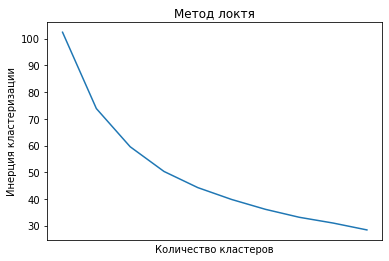

In [20]:
# Метод локтя
n_inertia = []

for i in range(1, 11):
    km = KMeans(n_clusters=i).fit(X)
    n_inertia.append(km.inertia_)
    
fig, ax = plt.subplots()
sns.lineplot(x=np.arange(1, 11), y=n_inertia, ax=ax)
ax.set_title('Метод локтя')
ax.set_xlabel('Количество кластеров')
ax.set_ylabel('Инерция кластеризации')
plt.xticks(np.arange(1, 1))
plt.show()
# ax.set_title('Метод локтя')
# ax.set_xlabel('Количество кластеров')
# ax.set_ylabel('Качество кластеризации')

In [21]:
# Вывод сведений о названиях столбцов датасета df, метод columns
df.columns

Index(['МатрНап', 'Плотн', 'МодУпр', 'КолвОтвер', 'КолвЭпокс', 'ТемпВсп',
       'ПовПлотн', 'МодУпрРаст', 'ПрочнРаст', 'КолвСмол', 'УголНаш', 'ШагНаш',
       'ПлотнНаш'],
      dtype='object')

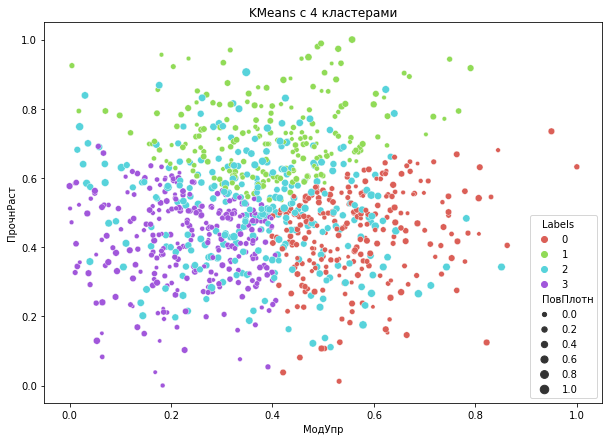

In [22]:
# KMeans показывает кластеризацию параметров
fig = plt.figure(figsize=(10,7))
km5 = KMeans(n_clusters=4).fit(X)
X['Labels'] = km5.labels_

sns.scatterplot(x=X['МодУпр'], y=X['ПрочнРаст'], hue=X['Labels'], size=X['ПовПлотн'], palette=sns.color_palette('hls', 4))

plt.title('KMeans c 4 кластерами')
plt.show()

In [23]:
# количество данных в кластерах
X[X['Labels']==0].count(),X[X['Labels']==1].count(),X[X['Labels']==2].count(),X[X['Labels']==3].count()

(МодУпр       247
 ПовПлотн     247
 ПрочнРаст    247
 Labels       247
 dtype: int64,
 МодУпр       216
 ПовПлотн     216
 ПрочнРаст    216
 Labels       216
 dtype: int64,
 МодУпр       279
 ПовПлотн     279
 ПрочнРаст    279
 Labels       279
 dtype: int64,
 МодУпр       281
 ПовПлотн     281
 ПрочнРаст    281
 Labels       281
 dtype: int64)

In [24]:
# данные в кластерах по 'ПрочнРаст'
X[X['Labels']==0]['ПрочнРаст'].head(20),X[X['Labels']==1]['ПрочнРаст'].head(20),X[X['Labels']==2]['ПрочнРаст'].head(20),X[X['Labels']==3]['ПрочнРаст'].head(20)

(8     0.271429
 12    0.504591
 14    0.504591
 23    0.551464
 26    0.510862
 30    0.502239
 33    0.450606
 37    0.124386
 39    0.541612
 45    0.214490
 47    0.529936
 48    0.506003
 49    0.269906
 53    0.542289
 59    0.343290
 63    0.431556
 70    0.106904
 74    0.264540
 76    0.611853
 81    0.641660
 Name: ПрочнРаст, dtype: float64,
 0     0.698235
 1     0.698235
 2     0.698235
 3     0.698235
 4     0.698235
 5     0.698235
 6     0.698235
 15    0.698235
 16    0.698235
 24    0.949223
 25    0.564512
 27    0.719231
 34    0.729017
 35    0.765150
 38    0.605842
 41    0.651495
 46    0.843247
 55    0.585983
 56    0.594412
 57    0.753826
 Name: ПрочнРаст, dtype: float64,
 9      0.342563
 10     0.342563
 11     0.342563
 19     0.342563
 20     0.342563
 28     0.445341
 31     0.625957
 40     0.644347
 43     0.461906
 58     0.598115
 64     0.699905
 66     0.428445
 71     0.639752
 72     0.319201
 84     0.201768
 88     0.358228
 89     0.311637
 90

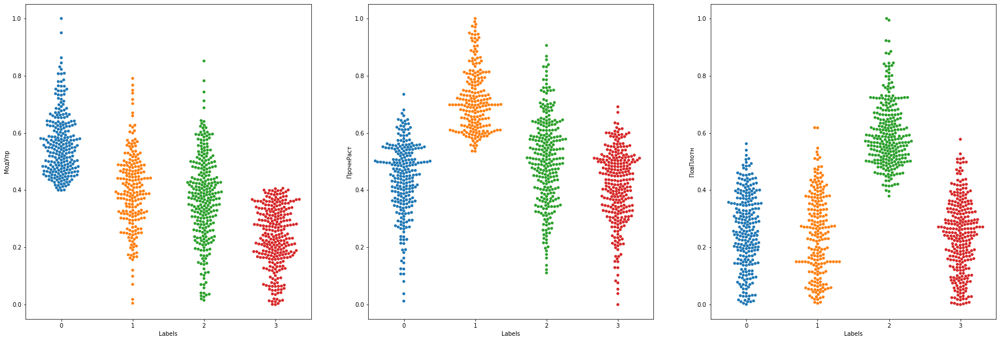

In [25]:
# swarmplot показывает распределение и разброс параметров по кластерам
fig = plt.figure(figsize=(30,10))
ax = fig.add_subplot(131)
sns.swarmplot(x='Labels', y='МодУпр', data=X, ax=ax)

ax = fig.add_subplot(132)
sns.swarmplot(x='Labels', y='ПрочнРаст', data=X, ax=ax)

ax = fig.add_subplot(133)
sns.swarmplot(x='Labels', y='ПовПлотн', data=X, ax=ax)

plt.show()

In [26]:
#Silhouette Coefficient is calculated using the mean intra-cluster distance and the mean nearest-cluster distance for each sample
print("Silhouette score: {}".format(silhouette_score(X.drop(['Labels'], axis=1), X.Labels)))

Silhouette score: 0.2422176450274393


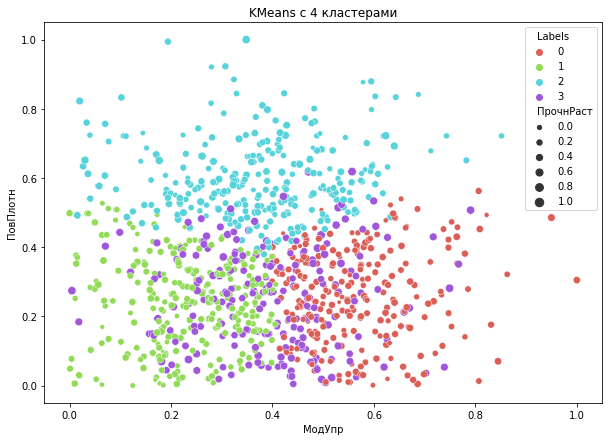

In [27]:
# KMeans показывает кластеризацию параметров
fig = plt.figure(figsize=(10,7))
km5 = KMeans(n_clusters=4).fit(X)
X['Labels'] = km5.labels_

sns.scatterplot(x=X['МодУпр'], y=X['ПовПлотн'], hue=X['Labels'], size=X['ПрочнРаст'], palette=sns.color_palette('hls', 4))

plt.title('KMeans c 4 кластерами')
plt.show()

In [28]:
# данные в кластерах по 'ПрочнРаст'
X[X['Labels']==0]['ПрочнРаст'].head(20),X[X['Labels']==1]['ПрочнРаст'].head(20),X[X['Labels']==2]['ПрочнРаст'].head(20),X[X['Labels']==3]['ПрочнРаст'].head(20)

(8     0.271429
 12    0.504591
 14    0.504591
 23    0.551464
 26    0.510862
 30    0.502239
 33    0.450606
 37    0.124386
 39    0.541612
 45    0.214490
 47    0.529936
 48    0.506003
 49    0.269906
 53    0.542289
 59    0.343290
 63    0.431556
 70    0.106904
 74    0.264540
 76    0.611853
 81    0.641660
 Name: ПрочнРаст, dtype: float64,
 7     0.271429
 13    0.504591
 17    0.271429
 18    0.271429
 21    0.504591
 22    0.504591
 29    0.593114
 32    0.507099
 36    0.303619
 42    0.421020
 44    0.436028
 50    0.348433
 51    0.377301
 52    0.497733
 54    0.456669
 60    0.394141
 61    0.522293
 65    0.209087
 69    0.401032
 77    0.129287
 Name: ПрочнРаст, dtype: float64,
 9      0.342563
 10     0.342563
 11     0.342563
 19     0.342563
 20     0.342563
 28     0.445341
 31     0.625957
 40     0.644347
 43     0.461906
 58     0.598115
 64     0.699905
 66     0.428445
 71     0.639752
 72     0.319201
 84     0.201768
 88     0.358228
 89     0.311637
 90

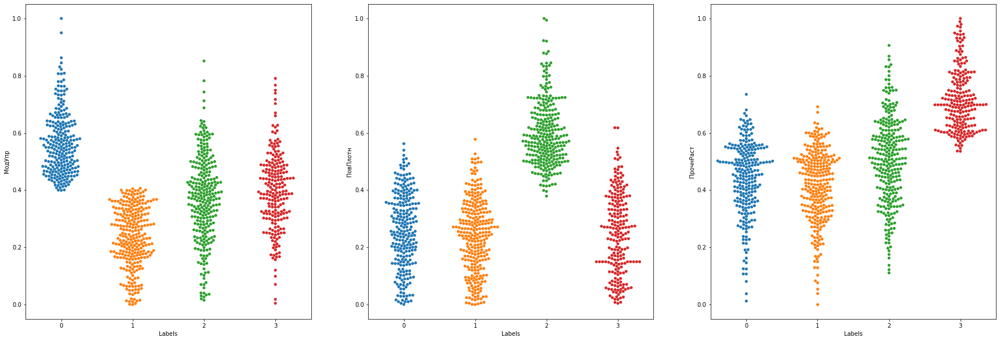

In [29]:
# swarmplot показывает распределение и разброс параметров по кластерам
fig = plt.figure(figsize=(30,10))
ax = fig.add_subplot(131)
sns.swarmplot(x='Labels', y='МодУпр', data=X, ax=ax)

ax = fig.add_subplot(132)
sns.swarmplot(x='Labels', y='ПовПлотн', data=X, ax=ax)

ax = fig.add_subplot(133)
sns.swarmplot(x='Labels', y='ПрочнРаст', data=X, ax=ax)

plt.show()

###### Иерархическая кластеризация (агломеративная)

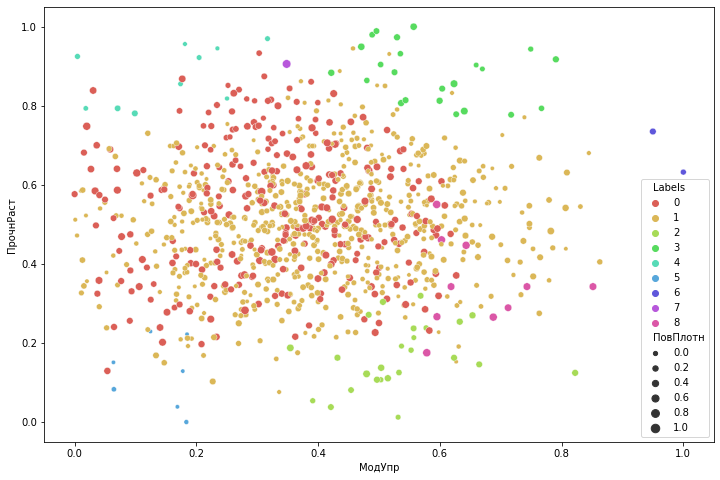

In [30]:
# AgglomerativeClustering показывает агломеративную кластеризацию
agglom = AgglomerativeClustering(n_clusters=9, linkage='average').fit(X.drop(['Labels'], axis=1)) # ward, complete...

X['Labels'] = agglom.labels_
plt.figure(figsize=(12, 8))
sns.scatterplot(x=X['МодУпр'], y=X['ПрочнРаст'], hue=X['Labels'], size=X['ПовПлотн'],
                palette=sns.color_palette('hls', 9))
plt.show()

In [31]:
# количество данных в кластерах
X[X['Labels']==0].count(),X[X['Labels']==1].count(),X[X['Labels']==2].count(),X[X['Labels']==3].count(),X[X['Labels']==4].count(),X[X['Labels']==5].count(),X[X['Labels']==6]['ПрочнРаст'].head(20),

(МодУпр       279
 ПовПлотн     279
 ПрочнРаст    279
 Labels       279
 dtype: int64,
 МодУпр       666
 ПовПлотн     666
 ПрочнРаст    666
 Labels       666
 dtype: int64,
 МодУпр       25
 ПовПлотн     25
 ПрочнРаст    25
 Labels       25
 dtype: int64,
 МодУпр       23
 ПовПлотн     23
 ПрочнРаст    23
 Labels       23
 dtype: int64,
 МодУпр       10
 ПовПлотн     10
 ПрочнРаст    10
 Labels       10
 dtype: int64,
 МодУпр       7
 ПовПлотн     7
 ПрочнРаст    7
 Labels       7
 dtype: int64,
 592    0.632194
 770    0.734869
 Name: ПрочнРаст, dtype: float64)

In [32]:
# данные в кластерах по 'ПрочнРаст'
X[X['Labels']==0]['ПрочнРаст'].head(20),X[X['Labels']==1]['ПрочнРаст'].head(20),X[X['Labels']==2]['ПрочнРаст'].head(20),X[X['Labels']==3]['ПрочнРаст'].head(20),X[X['Labels']==4]['ПрочнРаст'].head(20),X[X['Labels']==5]['ПрочнРаст'].head(20),

(10     0.342563
 20     0.342563
 27     0.719231
 28     0.445341
 31     0.625957
 35     0.765150
 40     0.644347
 43     0.461906
 64     0.699905
 71     0.639752
 72     0.319201
 77     0.129287
 84     0.201768
 88     0.358228
 89     0.311637
 90     0.390078
 91     0.546588
 96     0.349029
 101    0.474650
 107    0.478142
 Name: ПрочнРаст, dtype: float64,
 0     0.698235
 1     0.698235
 2     0.698235
 3     0.698235
 4     0.698235
 5     0.698235
 6     0.698235
 7     0.271429
 8     0.271429
 12    0.504591
 13    0.504591
 14    0.504591
 15    0.698235
 16    0.698235
 17    0.271429
 18    0.271429
 21    0.504591
 22    0.504591
 23    0.551464
 25    0.564512
 Name: ПрочнРаст, dtype: float64,
 37     0.124386
 49     0.269906
 70     0.106904
 119    0.238088
 175    0.181807
 206    0.145862
 227    0.107019
 259    0.125194
 270    0.012188
 318    0.037827
 321    0.303798
 341    0.213485
 375    0.137332
 385    0.253779
 412    0.121893
 416    0.271248


In [33]:
# The Silhouette Coefficient is calculated using the mean intra-cluster distance and the mean nearest-cluster distance for each sample
print("Silhouette score: {}".format(silhouette_score(X.drop(['Labels'], axis=1), X.Labels)))

Silhouette score: 0.10172544332902733


In [34]:
# The matrix nearest-cluster distance
dist = distance_matrix(X.drop(['Labels'], axis=1), X.drop(['Labels'], axis=1))
print(dist)

[[0.         0.         0.         ... 0.43175986 0.45181512 0.42991292]
 [0.         0.         0.         ... 0.43175986 0.45181512 0.42991292]
 [0.         0.         0.         ... 0.43175986 0.45181512 0.42991292]
 ...
 [0.43175986 0.43175986 0.43175986 ... 0.         0.27947271 0.07006926]
 [0.45181512 0.45181512 0.45181512 ... 0.27947271 0.         0.33724834]
 [0.42991292 0.42991292 0.42991292 ... 0.07006926 0.33724834 0.        ]]


In [35]:
hierarchy_clustering = hierarchy.linkage(dist, 'complete')

C:\Users\Admin\AppData\Local\Temp\ipykernel_1292\1577177698.py:1: ClusterWarning: scipy.cluster: The symmetric non-negative hollow observation matrix looks suspiciously like an uncondensed distance matrix
  hierarchy_clustering = hierarchy.linkage(dist, 'complete')


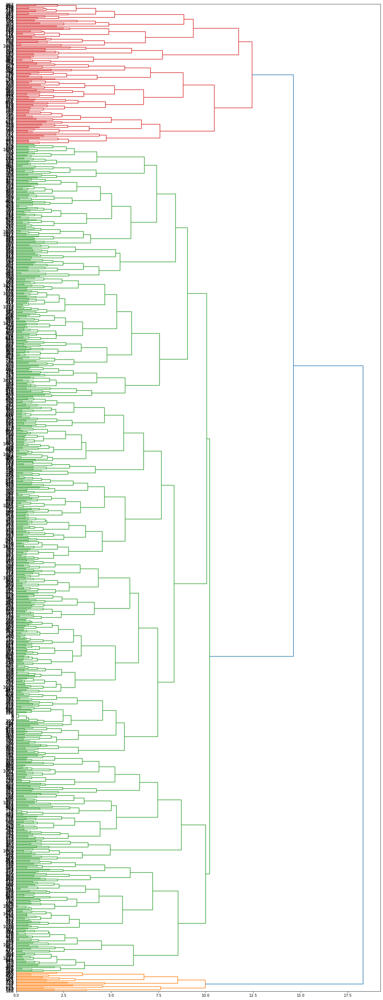

In [36]:
# dendrogram 
plt.figure(figsize=(18, 50))
dendro = hierarchy.dendrogram(hierarchy_clustering, leaf_font_size=12, orientation='right')

### DBSCAN

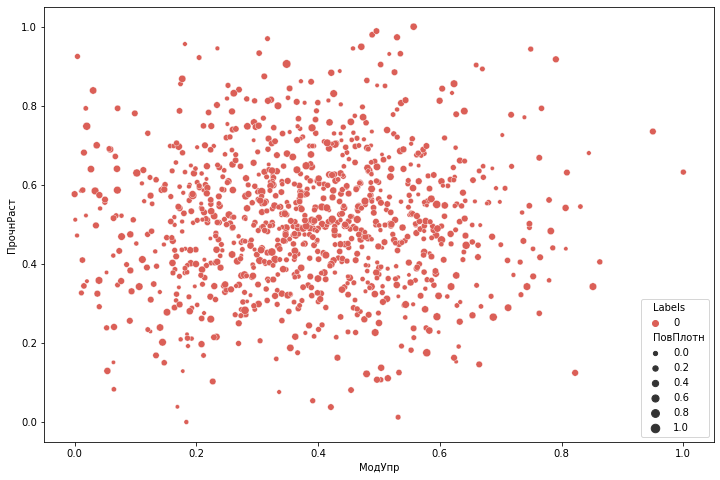

In [37]:
# кластеризация DBSCAN
from sklearn.cluster import DBSCAN 

db = DBSCAN(eps=50, min_samples=3).fit(X.drop(['Labels'], axis=1))

X['Labels'] = db.labels_
plt.figure(figsize=(12, 8))
sns.scatterplot(x=X['МодУпр'], y=X['ПрочнРаст'], hue=X['Labels'], size=X['ПовПлотн'],
                palette=sns.color_palette('hls', np.unique(db.labels_).shape[0]))
plt.show()

In [38]:
#print("Silhouette score: {}".format(silhouette_score(X.drop(['Labels'], axis=1), X.Labels)))

### C-means

In [39]:
# C-mean подобно KMeans показывает кластеризацию параметров
X.drop(['Labels'], axis=1, inplace=True)
fcm = FCM(n_clusters=4)
fcm.fit(X.values)

fcm_centers = fcm.centers
fcm_labels = fcm.predict(X.values) 

In [40]:
X['Labels'] = fcm_labels

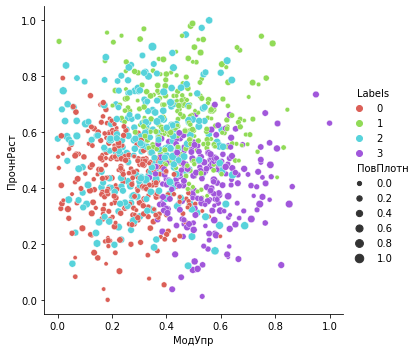

In [41]:
sns.relplot(x='МодУпр', y='ПрочнРаст', hue='Labels', 
            size='ПовПлотн', data=X, palette = sns.color_palette('hls', 4))

In [42]:
# количество данных в кластерах
X[X['Labels']==0].count(),X[X['Labels']==1].count(),X[X['Labels']==2].count(),X[X['Labels']==3].count()

(МодУпр       283
 ПовПлотн     283
 ПрочнРаст    283
 Labels       283
 dtype: int64,
 МодУпр       251
 ПовПлотн     251
 ПрочнРаст    251
 Labels       251
 dtype: int64,
 МодУпр       264
 ПовПлотн     264
 ПрочнРаст    264
 Labels       264
 dtype: int64,
 МодУпр       225
 ПовПлотн     225
 ПрочнРаст    225
 Labels       225
 dtype: int64)

In [43]:
# данные в кластерах по 'ПрочнРаст'
X[X['Labels']==0]['ПрочнРаст'].head(20),X[X['Labels']==1]['ПрочнРаст'].head(20),X[X['Labels']==2]['ПрочнРаст'].head(20),X[X['Labels']==3]['ПрочнРаст'].head(20)

(7     0.271429
 13    0.504591
 15    0.698235
 16    0.698235
 17    0.271429
 18    0.271429
 21    0.504591
 22    0.504591
 29    0.593114
 32    0.507099
 36    0.303619
 42    0.421020
 44    0.436028
 45    0.214490
 50    0.348433
 51    0.377301
 52    0.497733
 54    0.456669
 59    0.343290
 60    0.394141
 Name: ПрочнРаст, dtype: float64,
 0     0.698235
 1     0.698235
 2     0.698235
 3     0.698235
 4     0.698235
 5     0.698235
 6     0.698235
 26    0.510862
 27    0.719231
 34    0.729017
 35    0.765150
 38    0.605842
 41    0.651495
 46    0.843247
 47    0.529936
 48    0.506003
 55    0.585983
 56    0.594412
 57    0.753826
 61    0.522293
 Name: ПрочнРаст, dtype: float64,
 10     0.342563
 19     0.342563
 20     0.342563
 24     0.949223
 28     0.445341
 31     0.625957
 40     0.644347
 43     0.461906
 58     0.598115
 64     0.699905
 66     0.428445
 71     0.639752
 77     0.129287
 84     0.201768
 88     0.358228
 89     0.311637
 91     0.546588
 10

In [44]:
# The Silhouette Coefficient is calculated using the mean intra-cluster distance and the mean nearest-cluster distance for each sample
print("Silhouette score: {}".format(silhouette_score(X.drop(['Labels'], axis=1), X.Labels)))

Silhouette score: 0.22793128028194928


Проверка значимости различия по критерию Краскала-Уоллиса

In [45]:
# индексация кластеров
filter_0 = X[X['Labels']==0].index
filter_1 = X[X['Labels']==1].index
filter_2 = X[X['Labels']==2].index
filter_3 = X[X['Labels']==3].index

In [46]:
# выделение объектов np.array
df_0 = np.array(df_s['ПрочнРаст'][filter_0].reset_index(drop=True))
df_1 = np.array(df_s['ПрочнРаст'][filter_1].reset_index(drop=True))
df_2 = np.array(df_s['ПрочнРаст'][filter_2].reset_index(drop=True))
df_3 = np.array(df_s['ПрочнРаст'][filter_3].reset_index(drop=True))

In [47]:
# критерий Краскала-Уоллиса
stats.mstats.kruskalwallis(df_0,df_1,df_2,df_3)

KruskalResult(statistic=342.1986251717648, pvalue=7.292148282170502e-74)

Вывод: различия по группам значимы для параметра 'ПрочнРаст'

Создание новых датасетов для обработки:

In [48]:
# Вывод сведений о названиях столбцов датасета df, метод columns
df_s.columns

Index(['МатрНап', 'Плотн', 'МодУпр', 'КолвОтвер', 'КолвЭпокс', 'ТемпВсп',
       'ПовПлотн', 'МодУпрРаст', 'ПрочнРаст', 'КолвСмол', 'УголНаш', 'ШагНаш',
       'ПлотнНаш'],
      dtype='object')

In [49]:
ddf_0 = pd.DataFrame(np.array(df_s[['МатрНап', 'Плотн', 'МодУпр', 'КолвОтвер', 'КолвЭпокс', 'ТемпВсп',
       'ПовПлотн', 'МодУпрРаст', 'ПрочнРаст', 'КолвСмол', 'УголНаш', 'ШагНаш',
       'ПлотнНаш']])[filter_0])
ddf_0.columns = ['Соотношение матрица-наполнитель', 'Плотность, кг/м3',
       'модуль упругости, ГПа', 'Количество отвердителя, м.%',
       'Содержание эпоксидных групп,%_2', 'Температура вспышки, С_2',
       'Поверхностная плотность, г/м2', 'Модуль упругости при растяжении, ГПа',
       'Прочность при растяжении, МПа', 'Потребление смолы, г/м2',
       'Угол нашивки, град', 'Шаг нашивки', 'Плотность нашивки']
ddf_0.head(10)

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
0,2.561475,1900.000000,535.000000,111.860000,22.267857,284.615385,380.000000,75.000000,1800.000000,120.000000,0.0,7.0,47.0
1,2.919678,1980.000000,568.000000,129.000000,21.250000,300.000000,470.000000,73.333333,2455.555556,220.000000,0.0,9.0,60.0
2,2.934783,2030.000000,302.000000,129.000000,21.250000,300.000000,210.000000,70.000000,3000.000000,220.000000,0.0,10.0,47.0
3,3.557018,1880.000000,313.000000,129.000000,21.250000,300.000000,210.000000,70.000000,3000.000000,220.000000,0.0,10.0,57.0
4,4.193548,1950.000000,506.000000,129.000000,21.250000,300.000000,380.000000,75.000000,1800.000000,120.000000,0.0,10.0,60.0
5,4.897959,1890.000000,540.000000,129.000000,21.250000,300.000000,380.000000,75.000000,1800.000000,120.000000,0.0,10.0,70.0
6,1.598174,1920.000000,456.000000,111.860000,22.267857,284.615385,470.000000,73.333333,2455.555556,220.000000,1.0,4.0,57.0
7,4.029126,1880.000000,622.000000,111.860000,22.267857,284.615385,470.000000,73.333333,2455.555556,220.000000,1.0,4.0,60.0
8,2.282825,2008.357592,393.967325,149.372832,21.661751,330.498641,535.371459,72.244924,2704.445081,261.077072,1.0,7.0,57.0
9,3.277087,2010.047012,339.550423,67.498993,24.280609,254.949084,117.535234,67.478707,2462.605386,207.018581,1.0,9.0,47.0


In [50]:
ddf_1 = pd.DataFrame(np.array(df_s[['МатрНап', 'Плотн', 'МодУпр', 'КолвОтвер', 'КолвЭпокс', 'ТемпВсп',
       'ПовПлотн', 'МодУпрРаст', 'ПрочнРаст', 'КолвСмол', 'УголНаш', 'ШагНаш',
       'ПлотнНаш']])[filter_1])
ddf_1.columns = ['Соотношение матрица-наполнитель', 'Плотность, кг/м3',
       'модуль упругости, ГПа', 'Количество отвердителя, м.%',
       'Содержание эпоксидных групп,%_2', 'Температура вспышки, С_2',
       'Поверхностная плотность, г/м2', 'Модуль упругости при растяжении, ГПа',
       'Прочность при растяжении, МПа', 'Потребление смолы, г/м2',
       'Угол нашивки, град', 'Шаг нашивки', 'Плотность нашивки']
ddf_1.head(10)

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
0,1.857143,2030.000000,738.736842,30.000000,22.267857,100.000000,210.000000,70.000000,3000.000000,220.000000,0.0,4.0,57.0
1,1.857143,2030.000000,738.736842,50.000000,23.750000,284.615385,210.000000,70.000000,3000.000000,220.000000,0.0,4.0,60.0
2,1.857143,2030.000000,738.736842,49.900000,33.000000,284.615385,210.000000,70.000000,3000.000000,220.000000,0.0,4.0,70.0
3,1.857143,2030.000000,738.736842,129.000000,21.250000,300.000000,210.000000,70.000000,3000.000000,220.000000,0.0,5.0,47.0
4,2.771331,2030.000000,753.000000,111.860000,22.267857,284.615385,210.000000,70.000000,3000.000000,220.000000,0.0,5.0,57.0
5,2.767918,2000.000000,748.000000,111.860000,22.267857,284.615385,210.000000,70.000000,3000.000000,220.000000,0.0,5.0,60.0
6,2.569620,1910.000000,807.000000,111.860000,22.267857,284.615385,210.000000,70.000000,3000.000000,220.000000,0.0,5.0,70.0
7,1.856476,2018.220332,836.294382,135.401697,26.435515,327.510377,150.961449,77.210762,2473.187195,123.344561,1.0,5.0,60.0
8,3.305535,1917.907506,478.286247,105.786930,17.874100,328.154579,526.692159,72.345709,3059.032991,275.575880,1.0,5.0,70.0
9,2.916150,1879.969846,1003.270178,109.239530,25.682759,294.048537,408.354239,71.700856,3086.546196,192.191162,1.0,9.0,60.0


In [51]:
ddf_2 = pd.DataFrame(np.array(df_s[['МатрНап', 'Плотн', 'МодУпр', 'КолвОтвер', 'КолвЭпокс', 'ТемпВсп',
       'ПовПлотн', 'МодУпрРаст', 'ПрочнРаст', 'КолвСмол', 'УголНаш', 'ШагНаш',
       'ПлотнНаш']])[filter_2])
ddf_2.columns = ['Соотношение матрица-наполнитель', 'Плотность, кг/м3',
       'модуль упругости, ГПа', 'Количество отвердителя, м.%',
       'Содержание эпоксидных групп,%_2', 'Температура вспышки, С_2',
       'Поверхностная плотность, г/м2', 'Модуль упругости при растяжении, ГПа',
       'Прочность при растяжении, МПа', 'Потребление смолы, г/м2',
       'Угол нашивки, град', 'Шаг нашивки', 'Плотность нашивки']
ddf_2.head(10)

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
0,2.919678,2160.000000,933.000000,129.000000,21.250000,300.000000,1010.000000,78.000000,2000.000000,300.000000,0.0,7.000000,70.000000
1,3.532338,1980.000000,1183.000000,111.860000,22.267857,284.615385,1010.000000,78.000000,2000.000000,300.000000,0.0,0.000000,0.000000
2,2.877358,2000.000000,205.000000,111.860000,22.267857,284.615385,1010.000000,78.000000,2000.000000,300.000000,1.0,4.000000,47.000000
3,2.499918,1942.595777,901.519947,146.252208,23.081757,351.231874,864.725484,76.178075,3705.672523,226.222760,1.0,5.000000,47.000000
4,2.709554,1892.071124,641.052549,96.563293,22.989291,262.956722,804.592621,74.511359,2288.967377,126.816339,1.0,7.000000,47.000000
5,1.771436,1872.491560,801.033883,79.794548,22.296304,340.736898,864.929184,70.947592,2796.785402,123.356264,1.0,7.000000,70.000000
6,3.034399,1968.401388,455.871019,61.421297,23.490723,316.414572,637.376893,75.090372,2848.490078,311.052398,0.0,7.856167,64.301964
7,1.193530,1965.929227,899.603701,102.959069,19.566716,225.810223,871.088955,73.454695,2335.541792,91.047646,0.0,7.526398,38.176975
8,4.467350,2045.919984,707.064066,40.304806,22.230347,239.576876,646.074222,73.802967,2718.505048,268.644548,0.0,7.310438,63.861306
9,2.561917,1956.587188,411.160200,84.288919,26.385860,264.963876,672.364980,70.102894,3004.696572,194.853057,0.0,6.191330,31.804141


In [52]:
ddf_3 = pd.DataFrame(np.array(df_s[['МатрНап', 'Плотн', 'МодУпр', 'КолвОтвер', 'КолвЭпокс', 'ТемпВсп',
       'ПовПлотн', 'МодУпрРаст', 'ПрочнРаст', 'КолвСмол', 'УголНаш', 'ШагНаш',
       'ПлотнНаш']])[filter_3])
ddf_3.columns = ['Соотношение матрица-наполнитель', 'Плотность, кг/м3',
       'модуль упругости, ГПа', 'Количество отвердителя, м.%',
       'Содержание эпоксидных групп,%_2', 'Температура вспышки, С_2',
       'Поверхностная плотность, г/м2', 'Модуль упругости при растяжении, ГПа',
       'Прочность при растяжении, МПа', 'Потребление смолы, г/м2',
       'Угол нашивки, град', 'Шаг нашивки', 'Плотность нашивки']
ddf_3

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
0,3.557018,1930.000000,889.000000,129.000000,21.250000,300.000000,380.000000,75.000000,1800.000000,120.000000,0.0,7.000000,57.000000
1,3.532338,2100.000000,1421.000000,129.000000,21.250000,300.000000,1010.000000,78.000000,2000.000000,300.000000,0.0,7.000000,60.000000
2,2.877358,1990.000000,1628.000000,129.000000,21.250000,300.000000,1010.000000,78.000000,2000.000000,300.000000,0.0,9.000000,47.000000
3,1.598174,1950.000000,827.000000,129.000000,21.250000,300.000000,470.000000,73.333333,2455.555556,220.000000,0.0,9.000000,57.000000
4,4.029126,1910.000000,800.000000,129.000000,21.250000,300.000000,470.000000,73.333333,2455.555556,220.000000,0.0,9.000000,70.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...
220,0.968087,2008.874066,1076.741766,81.927825,23.528344,320.803711,547.908086,72.848475,2137.271408,204.086339,1.0,5.113644,61.998310
221,4.338272,1804.840230,688.626358,100.676847,21.022841,245.494031,479.713183,67.756823,2303.703418,216.744240,1.0,7.812506,62.702042
222,3.109130,2019.939791,855.877168,125.654249,22.788022,323.766318,585.456532,82.525773,2715.953011,251.571333,1.0,4.212257,71.960542
223,1.646235,2014.772547,841.064806,102.979906,21.073367,271.490843,615.168127,79.154469,2518.516089,232.428214,1.0,5.048503,59.837798


In [53]:
# Изменение типа данных столбца 'Угол нашивки, град', метод astype('int')
ddf_0['Угол нашивки, град'] = ddf_0['Угол нашивки, град'].astype(int)

In [54]:
# Тип данных столбца 'Угол нашивки, град', метод dtypes()
ddf_0.dtypes['Угол нашивки, град']

dtype('int32')

In [55]:
# Изменение типа данных столбца 'Угол нашивки, град', метод astype('int')
ddf_1['Угол нашивки, град'] = ddf_1['Угол нашивки, град'].astype(int)

In [56]:
# Тип данных столбца 'Угол нашивки, град', метод dtypes()
ddf_1.dtypes['Угол нашивки, град']

dtype('int32')

In [57]:
# Изменение типа данных столбца 'Угол нашивки, град', метод astype('int')
ddf_2['Угол нашивки, град'] = ddf_2['Угол нашивки, град'].astype(int)

In [58]:
# Тип данных столбца 'Угол нашивки, град', метод dtypes()
ddf_2.dtypes['Угол нашивки, град']

dtype('int32')

In [59]:
# Изменение типа данных столбца 'Угол нашивки, град', метод astype('int')
ddf_3['Угол нашивки, град'] = ddf_3['Угол нашивки, град'].astype(int)

In [60]:
# Тип данных столбца 'Угол нашивки, град', метод dtypes()
ddf_3.dtypes['Угол нашивки, град']

dtype('int32')

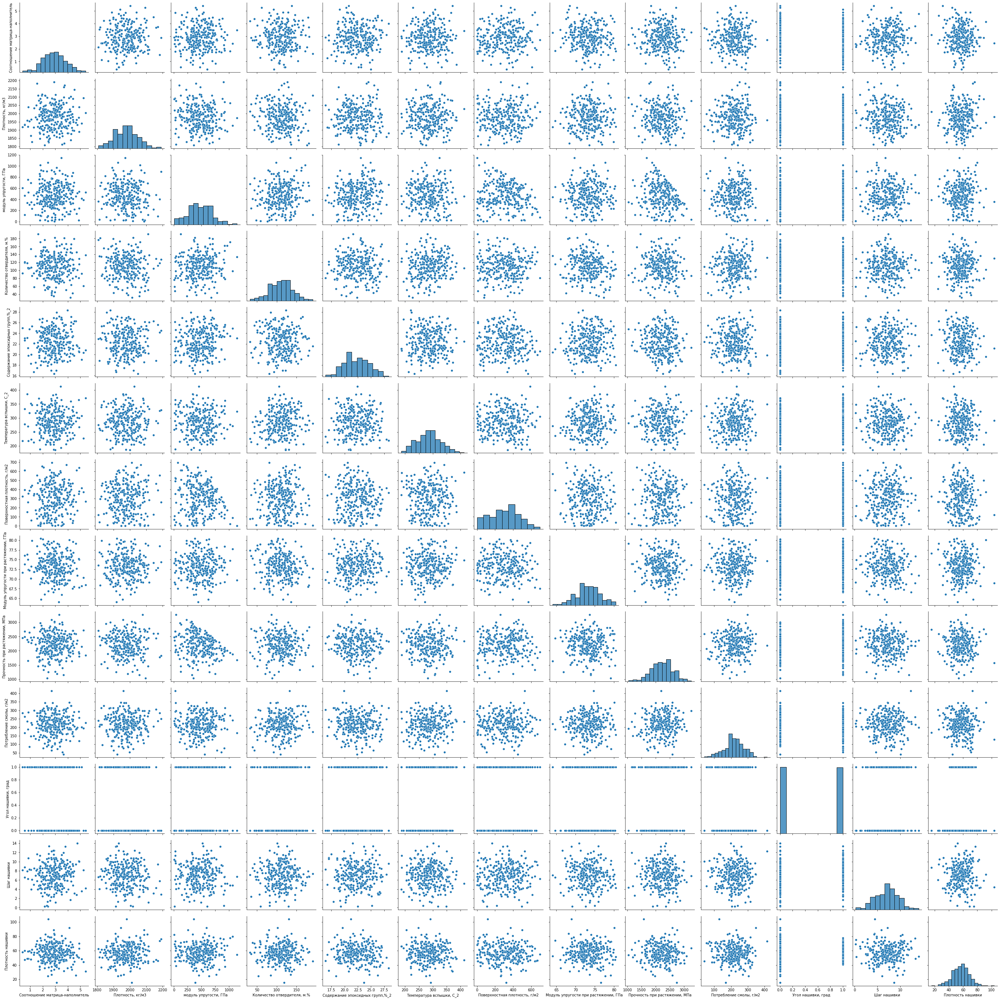

In [61]:
# Вывод парных графиков рассеяния датасета df_s, метод pairplot библиотеки seaborn
sns.pairplot(ddf_0, height=3)

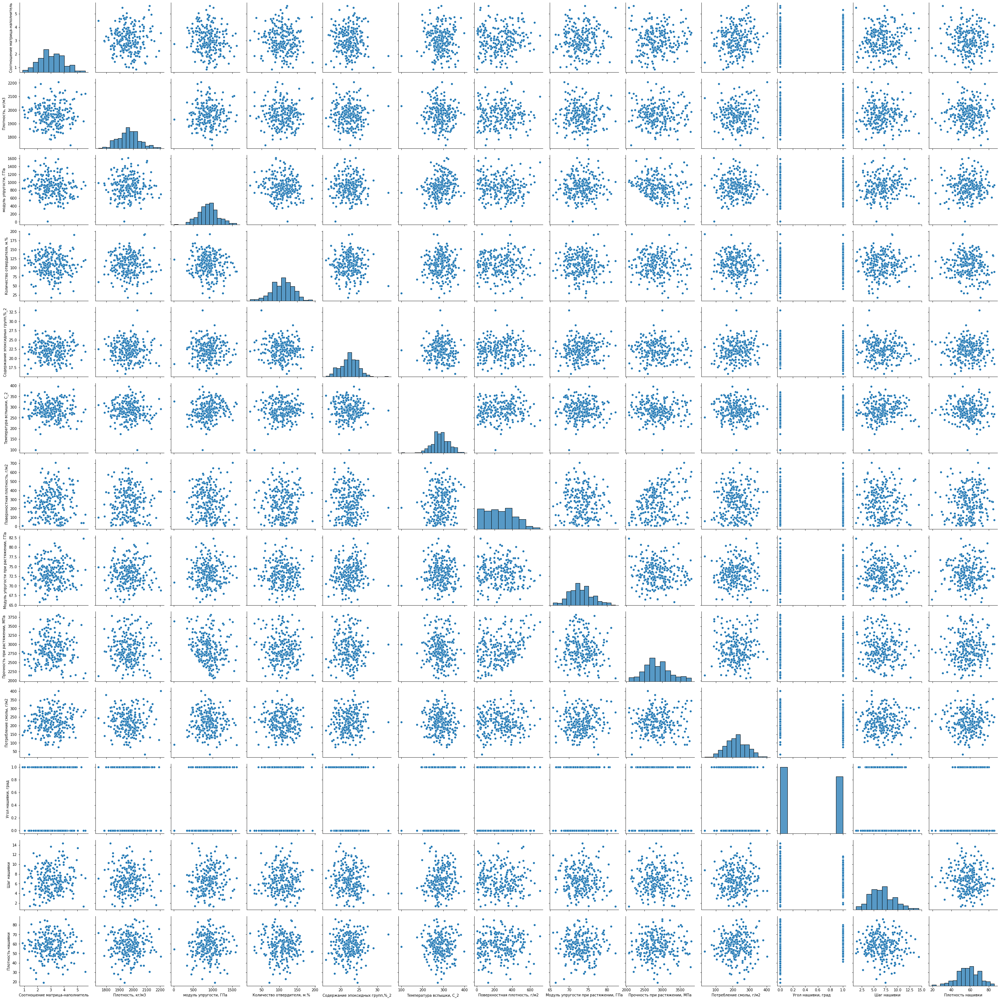

In [62]:
# Вывод парных графиков рассеяния датасета df_s, метод pairplot библиотеки seaborn
sns.pairplot(ddf_1, height=3)

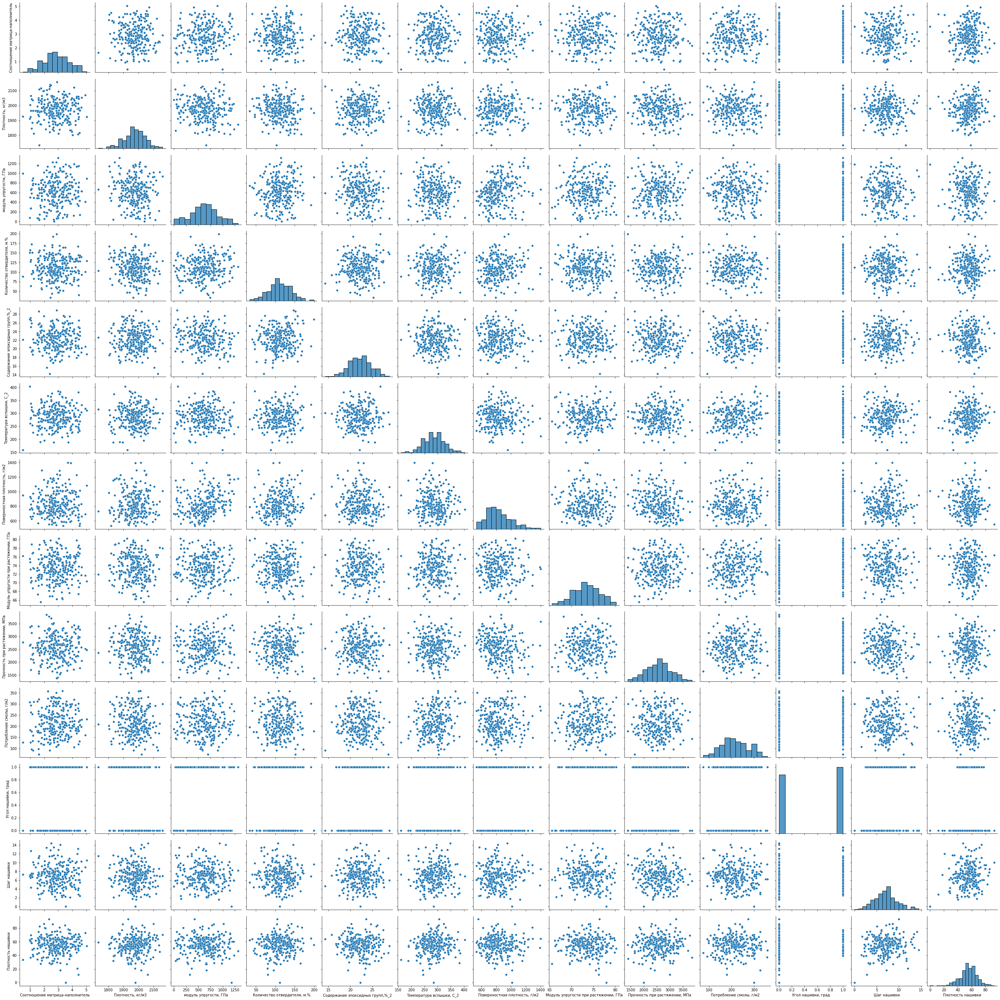

In [63]:
# Вывод парных графиков рассеяния датасета df_s, метод pairplot библиотеки seaborn
sns.pairplot(ddf_2, height=3)

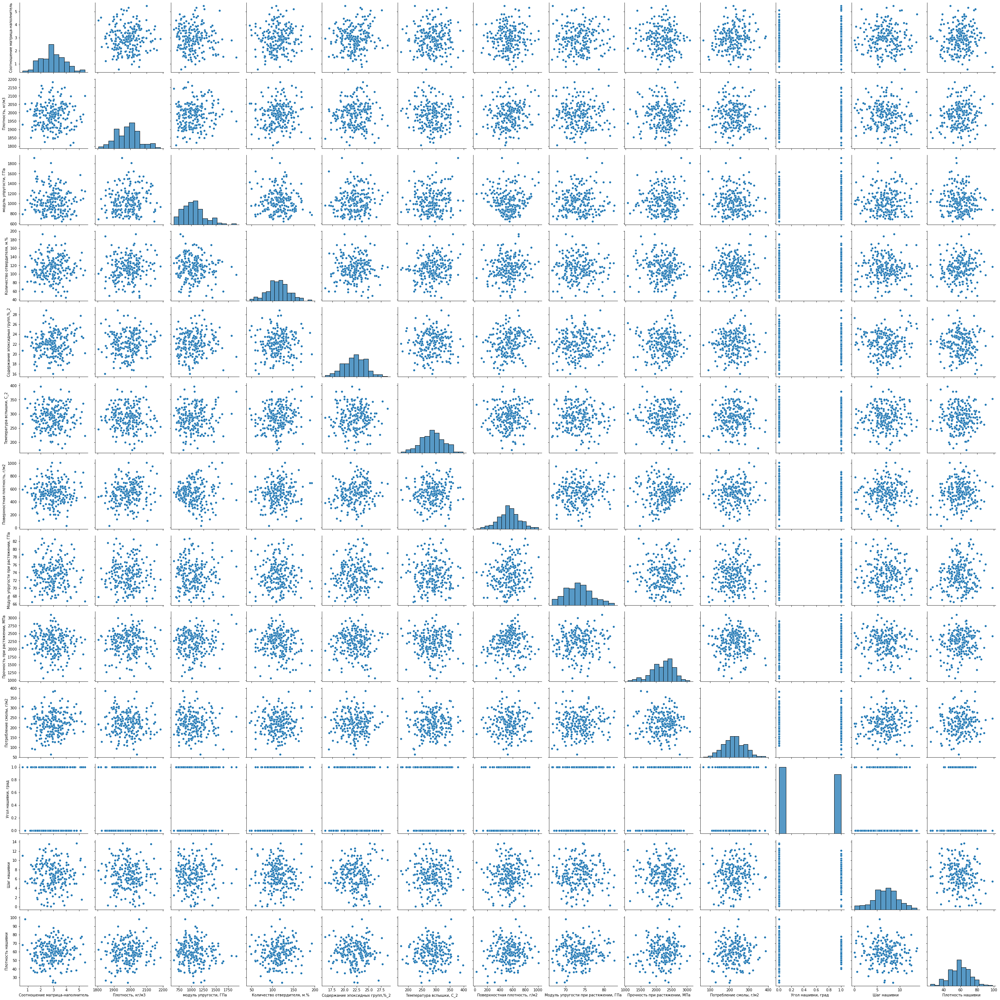

In [64]:
# Вывод парных графиков рассеяния датасета df_s, метод pairplot библиотеки seaborn
sns.pairplot(ddf_3, height=3)

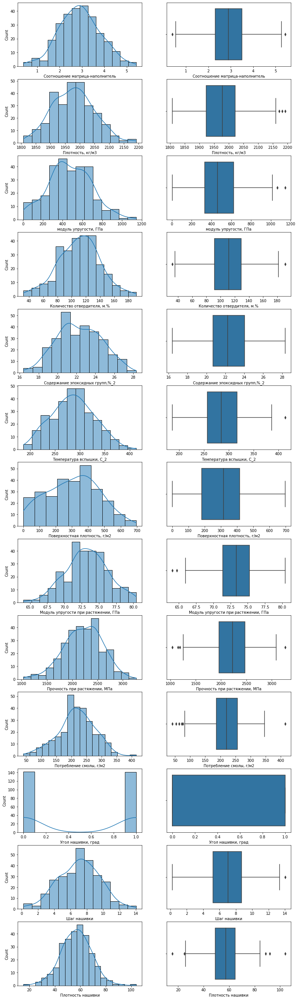

In [65]:
# Построение графиков распределения переменных и "ящики с усами", метод subplots  библиотеки seaborn
fig, axes = plt.subplots(13, 2, figsize=(13, 48))
for k, column in enumerate(ddf_0.columns):    
    sns.histplot(data=ddf_0, x=column, kde=True, ax=axes[k, 0])
    sns.boxplot(data=ddf_0, x=column, ax=axes[k, 1])
plt.show()

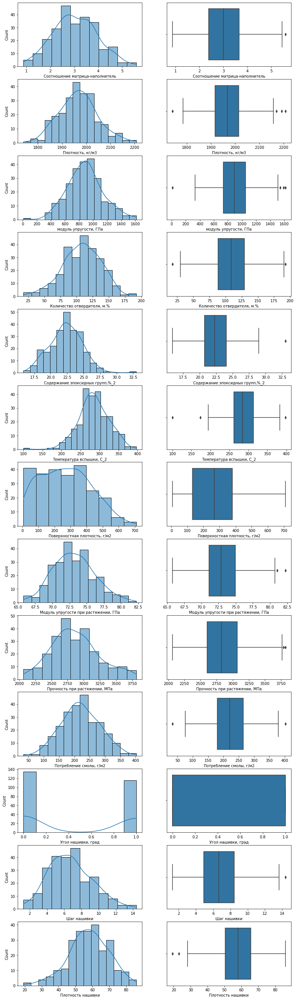

In [66]:
# Построение графиков распределения переменных и "ящики с усами", метод subplots  библиотеки seaborn
fig, axes = plt.subplots(13, 2, figsize=(13, 48))
for k, column in enumerate(ddf_1.columns):    
    sns.histplot(data=ddf_1, x=column, kde=True, ax=axes[k, 0])
    sns.boxplot(data=ddf_1, x=column, ax=axes[k, 1])
plt.show()

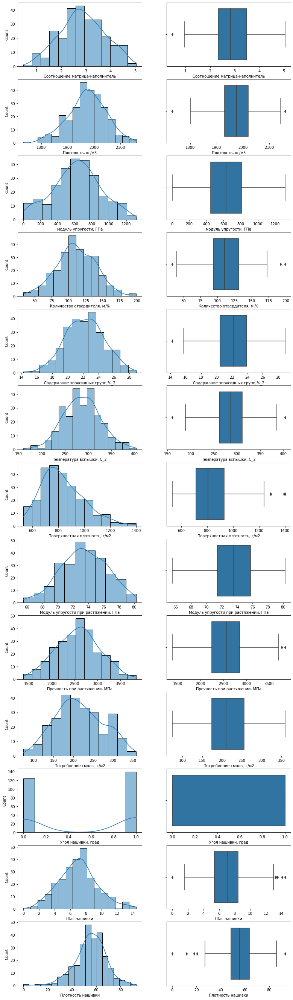

In [67]:
# Построение графиков распределения переменных и "ящики с усами", метод subplots  библиотеки seaborn
fig, axes = plt.subplots(13, 2, figsize=(13, 48))
for k, column in enumerate(ddf_2.columns):    
    sns.histplot(data=ddf_2, x=column, kde=True, ax=axes[k, 0])
    sns.boxplot(data=ddf_2, x=column, ax=axes[k, 1])
plt.show()

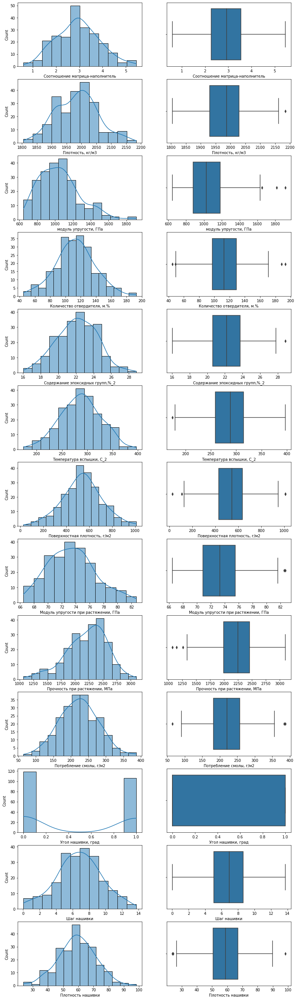

In [68]:
# Построение графиков распределения переменных и "ящики с усами", метод subplots  библиотеки seaborn
fig, axes = plt.subplots(13, 2, figsize=(13, 48))
for k, column in enumerate(ddf_3.columns):    
    sns.histplot(data=ddf_3, x=column, kde=True, ax=axes[k, 0])
    sns.boxplot(data=ddf_3, x=column, ax=axes[k, 1])
plt.show()

In [69]:
# Создание нового датасета df_d без столбца 'Угол нашивки, град'
ddf_0d=ddf_0[['Соотношение матрица-наполнитель','Плотность, кг/м3','модуль упругости, ГПа','Количество отвердителя, м.%','Содержание эпоксидных групп,%_2','Температура вспышки, С_2','Поверхностная плотность, г/м2','Модуль упругости при растяжении, ГПа','Прочность при растяжении, МПа','Потребление смолы, г/м2','Шаг нашивки','Плотность нашивки']]

In [70]:
# Создание нового датасета df_d без столбца 'Угол нашивки, град'
ddf_1d=ddf_1[['Соотношение матрица-наполнитель','Плотность, кг/м3','модуль упругости, ГПа','Количество отвердителя, м.%','Содержание эпоксидных групп,%_2','Температура вспышки, С_2','Поверхностная плотность, г/м2','Модуль упругости при растяжении, ГПа','Прочность при растяжении, МПа','Потребление смолы, г/м2','Шаг нашивки','Плотность нашивки']]

In [71]:
# Создание нового датасета df_d без столбца 'Угол нашивки, град'
ddf_2d=ddf_2[['Соотношение матрица-наполнитель','Плотность, кг/м3','модуль упругости, ГПа','Количество отвердителя, м.%','Содержание эпоксидных групп,%_2','Температура вспышки, С_2','Поверхностная плотность, г/м2','Модуль упругости при растяжении, ГПа','Прочность при растяжении, МПа','Потребление смолы, г/м2','Шаг нашивки','Плотность нашивки']]

In [72]:
# Создание нового датасета df_d без столбца 'Угол нашивки, град'
ddf_3d=ddf_3[['Соотношение матрица-наполнитель','Плотность, кг/м3','модуль упругости, ГПа','Количество отвердителя, м.%','Содержание эпоксидных групп,%_2','Температура вспышки, С_2','Поверхностная плотность, г/м2','Модуль упругости при растяжении, ГПа','Прочность при растяжении, МПа','Потребление смолы, г/м2','Шаг нашивки','Плотность нашивки']]

#### 2. Оценка нормальности распределения параметров

In [73]:
# Описательная статистика датасета df_d, метод describe()
ddf_0d.describe()

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2",Шаг нашивки,Плотность нашивки
count,283.000000,283.000000,283.000000,283.000000,283.000000,283.000000,283.000000,283.000000,283.000000,283.000000,283.000000,283.000000
mean,2.895178,1977.386670,471.499895,110.658063,22.308614,285.609537,304.751458,73.249980,2217.313805,216.696940,7.041612,56.853833
std,0.912191,71.379168,216.834080,28.903369,2.351951,43.032903,160.484105,3.077840,382.026013,60.324506,2.516643,12.050724
min,0.389403,1807.595910,4.339154,32.019222,16.391595,186.508613,0.603740,64.054061,1036.856605,41.048278,0.239660,15.416076
25%,2.297477,1923.452303,331.360386,91.275340,20.680524,256.658852,182.325952,71.391056,1961.177856,186.487429,5.191353,49.042786
50%,2.896836,1977.688277,459.047070,111.860000,22.259406,284.615385,315.234693,73.333333,2229.631180,220.000000,7.073134,57.286344
75%,3.500388,2021.782812,622.612277,129.326788,24.031250,316.312297,415.919298,75.255148,2475.636406,256.989132,8.714379,64.710011
max,5.425139,2192.297637,1144.216057,191.053004,28.324968,413.273418,696.309115,80.419862,3267.660952,414.590628,14.033215,103.988901


In [74]:
# Описательная статистика датасета df_d, метод describe()
ddf_1d.describe()

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2",Шаг нашивки,Плотность нашивки
count,251.000000,251.000000,251.000000,251.000000,251.000000,251.000000,251.000000,251.000000,251.000000,251.000000,251.000000,251.000000
mean,3.037817,1967.471565,888.309435,108.047386,22.316335,285.034722,266.701471,73.152878,2869.248801,219.971819,6.730112,57.837135
std,0.916195,79.619931,251.291735,29.507673,2.460095,40.403609,157.959818,3.009651,369.637866,62.478255,2.514466,11.870881
min,0.875458,1740.657496,11.312943,17.740275,15.881668,100.000000,6.779255,65.793845,2066.553692,33.803026,1.280057,19.250533
25%,2.390112,1917.261782,731.349309,88.633300,20.712860,261.760400,130.716002,71.115264,2604.676450,180.203422,4.926412,50.476822
50%,2.992388,1967.434093,888.191562,108.571611,22.282242,284.615385,267.140817,72.859651,2826.723248,220.000000,6.632902,58.099091
75%,3.657724,2015.126740,1048.064662,129.493658,24.025904,312.786178,379.301017,74.982770,3071.552861,264.746102,8.463605,65.482708
max,5.591742,2207.773481,1615.096973,192.705385,33.000000,397.151291,709.878674,82.237600,3817.269484,402.163809,14.376451,86.012427


In [75]:
# Описательная статистика датасета df_d, метод describe()
ddf_2d.describe()

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2",Шаг нашивки,Плотность нашивки
count,264.000000,264.000000,264.000000,264.000000,264.000000,264.000000,264.000000,264.000000,264.000000,264.000000,264.000000,264.000000
mean,2.861834,1973.547903,624.256880,110.862966,22.223270,286.381674,832.234994,73.485825,2572.654292,215.488212,7.008151,55.153071
std,0.898573,71.785389,275.742121,28.386947,2.509775,39.722716,165.397466,2.993976,475.156833,59.983243,2.487611,12.855056
min,0.463342,1731.764635,2.436909,33.624187,14.254985,160.255843,530.591317,65.553336,1379.568514,74.097866,0.000000,0.000000
25%,2.330076,1930.815137,447.406159,93.631209,20.487336,261.453070,714.346859,71.413790,2244.984297,173.968993,5.383374,48.279617
50%,2.838122,1976.606227,630.057535,110.438871,22.171450,285.228220,806.205150,73.495992,2576.811685,210.484618,7.017358,55.646862
75%,3.488897,2019.993409,807.348654,131.261866,23.924985,311.498923,930.637676,75.749973,2855.633584,255.220741,8.422391,63.726635
max,5.045725,2160.000000,1315.304892,198.953207,28.907470,403.652861,1399.542362,80.239609,3848.436732,359.052220,14.440522,92.963492


In [76]:
# Описательная статистика датасета df_d, метод describe()
ddf_3d.describe()

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2",Шаг нашивки,Плотность нашивки
count,225.000000,225.000000,225.000000,225.000000,225.000000,225.000000,225.000000,225.000000,225.000000,225.000000,225.000000,225.000000
mean,2.935167,1985.441572,1047.722277,112.933101,22.108130,286.584287,537.501755,73.438906,2208.000353,222.310344,6.780968,59.116903
std,0.923335,71.286726,227.994773,25.895080,2.296477,40.506658,171.414342,3.426453,366.170007,55.557298,2.756941,12.355060
min,0.596783,1804.840230,645.814749,45.122175,16.048978,173.973907,27.536528,66.482383,1071.123751,64.524180,0.037639,23.898196
25%,2.268267,1929.677531,876.794802,97.125855,20.624254,258.760946,430.807674,70.860736,1994.177827,181.404491,5.048503,50.709233
50%,2.927797,1986.944561,1027.545257,112.821549,22.178914,288.247732,544.203245,73.284256,2250.211120,220.732220,6.930538,58.913323
75%,3.550392,2029.296906,1181.575819,129.000000,23.745495,314.622062,638.506517,75.482076,2460.997418,256.737402,8.613776,67.052628
max,5.455566,2184.493200,1911.536477,192.851702,28.848902,396.898222,1010.000000,82.682051,3103.000733,386.903431,13.732404,98.202603


In [77]:
# Описательная статистика в упорядоченном виде по столбцам датасета df_d
for col in ddf_0d.columns:
    med = statistics.median(ddf_0d[col])
    mean = statistics.mean(ddf_0d[col])
    mod = statistics.mode(ddf_0d[col])
    std = statistics.stdev(ddf_0d[col])
    var = statistics.variance(ddf_0d[col])
    skew = stats.skew(ddf_0d[col])
    kurt = stats.kurtosis(ddf_0d[col])
    max_ = (ddf_0d[col]).max()
    min_ = (ddf_0d[col]).min()
    scope = (ddf_0d[col]).max() - (ddf_0d[col]).min()
    confidence = stats.norm.interval(alpha=0.95, loc=np.mean(ddf_0d[col]), scale=stats.sem(ddf_0d[col]))
    print('\n \t', col, ': \t \n'   'Среднее: ', mean, '\t' 'Медиана: ', med, '\t' 'Мода : ', mod, 
          '\n' 'Стандарт : ', std, '\t' 'Дисперсия: ', var, 
          '\n' 'Асимметрия: ', skew, '\t' 'Эксцесс: ', kurt, 
          '\n' 'Минимум: ', min_, '\t' 'Максимум: ', max_, '\t' 'Размах: ', scope, 
          '\n' 'ДоверитИнтервалСредн: ', confidence) 



 	 Соотношение матрица-наполнитель : 	 
Среднее:  2.8951776773922355 	Медиана:  2.89683591198512 	Мода :  2.56147540983606 
Стандарт :  0.9121910070217526 	Дисперсия:  0.8320924332913591 
Асимметрия:  0.03135001947097484 	Эксцесс:  -0.016329463482998463 
Минимум:  0.389402605178414 	Максимум:  5.42513947440363 	Размах:  5.035736869225216 
ДоверитИнтервалСредн:  (2.788900341395123, 3.001455013389345)

 	 Плотность, кг/м3 : 	 
Среднее:  1977.3866696683915 	Медиана:  1977.68827695531 	Мода :  1880.0 
Стандарт :  71.37916775492207 	Дисперсия:  5094.9855893853055 
Асимметрия:  0.18654838561817982 	Эксцесс:  -0.07566047394531239 
Минимум:  1807.59591013457 	Максимум:  2192.29763744164 	Размах:  384.70172730706986 
ДоверитИнтервалСредн:  (1969.0704423253378, 1985.7028970114497)

 	 модуль упругости, ГПа : 	 
Среднее:  471.4998946880096 	Медиана:  459.047069741573 	Мода :  535.0 
Стандарт :  216.83408004207092 	Дисперсия:  47017.018267691215 
Асимметрия:  0.11719582975906488 	Эксцесс:  -0.121

In [78]:
# Описательная статистика в упорядоченном виде по столбцам датасета df_d
for col in ddf_1d.columns:
    med = statistics.median(ddf_1d[col])
    mean = statistics.mean(ddf_1d[col])
    mod = statistics.mode(ddf_1d[col])
    std = statistics.stdev(ddf_1d[col])
    var = statistics.variance(ddf_1d[col])
    skew = stats.skew(ddf_1d[col])
    kurt = stats.kurtosis(ddf_1d[col])
    max_ = (ddf_1d[col]).max()
    min_ = (ddf_1d[col]).min()
    scope = (ddf_1d[col]).max() - (ddf_1d[col]).min()
    confidence = stats.norm.interval(alpha=0.95, loc=np.mean(ddf_1d[col]), scale=stats.sem(ddf_1d[col]))
    print('\n \t', col, ': \t \n'   'Среднее: ', mean, '\t' 'Медиана: ', med, '\t' 'Мода : ', mod, 
          '\n' 'Стандарт : ', std, '\t' 'Дисперсия: ', var, 
          '\n' 'Асимметрия: ', skew, '\t' 'Эксцесс: ', kurt, 
          '\n' 'Минимум: ', min_, '\t' 'Максимум: ', max_, '\t' 'Размах: ', scope, 
          '\n' 'ДоверитИнтервалСредн: ', confidence) 



 	 Соотношение матрица-наполнитель : 	 
Среднее:  3.037817227832622 	Медиана:  2.99238771225055 	Мода :  1.85714285714285 
Стандарт :  0.9161949400001719 	Дисперсия:  0.8394131680819185 
Асимметрия:  0.13420445961755567 	Эксцесс:  -0.27191697102756285 
Минимум:  0.875457630981136 	Максимум:  5.59174159869754 	Размах:  4.716283967716405 
ДоверитИнтервалСредн:  (2.924473075414461, 3.1511613802507785)

 	 Плотность, кг/м3 : 	 
Среднее:  1967.4715647602072 	Медиана:  1967.43409316299 	Мода :  2030.0 
Стандарт :  79.61993058197625 	Дисперсия:  6339.3333458787165 
Асимметрия:  0.1864142294341815 	Эксцесс:  0.13780683063282195 
Минимум:  1740.65749569112 	Максимум:  2207.77348061119 	Размах:  467.1159849200699 
ДоверитИнтервалСредн:  (1957.621637464817, 1977.3214920555988)

 	 модуль упругости, ГПа : 	 
Среднее:  888.3094354737685 	Медиана:  888.191562497692 	Мода :  738.736842105263 
Стандарт :  251.2917351137937 	Дисперсия:  63147.536136501054 
Асимметрия:  0.1609419921233092 	Эксцесс:  0.

In [79]:
# Описательная статистика в упорядоченном виде по столбцам датасета df_d
for col in ddf_2d.columns:
    med = statistics.median(ddf_2d[col])
    mean = statistics.mean(ddf_2d[col])
    mod = statistics.mode(ddf_2d[col])
    std = statistics.stdev(ddf_2d[col])
    var = statistics.variance(ddf_2d[col])
    skew = stats.skew(ddf_2d[col])
    kurt = stats.kurtosis(ddf_2d[col])
    max_ = (ddf_2d[col]).max()
    min_ = (ddf_2d[col]).min()
    scope = (ddf_2d[col]).max() - (ddf_2d[col]).min()
    confidence = stats.norm.interval(alpha=0.95, loc=np.mean(ddf_2d[col]), scale=stats.sem(ddf_2d[col]))
    print('\n \t', col, ': \t \n'   'Среднее: ', mean, '\t' 'Медиана: ', med, '\t' 'Мода : ', mod, 
          '\n' 'Стандарт : ', std, '\t' 'Дисперсия: ', var, 
          '\n' 'Асимметрия: ', skew, '\t' 'Эксцесс: ', kurt, 
          '\n' 'Минимум: ', min_, '\t' 'Максимум: ', max_, '\t' 'Размах: ', scope, 
          '\n' 'ДоверитИнтервалСредн: ', confidence) 



 	 Соотношение матрица-наполнитель : 	 
Среднее:  2.86183396289099 	Медиана:  2.83812171672495 	Мода :  2.91967783631954 
Стандарт :  0.8985726111604062 	Дисперсия:  0.8074327375276307 
Асимметрия:  -0.00015252762702759959 	Эксцесс:  -0.4498702755506825 
Минимум:  0.463342035924085 	Максимум:  5.04572461837477 	Размах:  4.582382582450685 
ДоверитИнтервалСредн:  (2.7534414450538307, 2.9702264807281455)

 	 Плотность, кг/м3 : 	 
Среднее:  1973.5479034147322 	Медиана:  1976.6062266141298 	Мода :  2160.0 
Стандарт :  71.7853894459957 	Дисперсия:  5153.142137913272 
Асимметрия:  -0.22271650634040602 	Эксцесс:  0.1062396834635373 
Минимум:  1731.764635096 	Максимум:  2160.0 	Размах:  428.2353649040001 
ДоверитИнтервалСредн:  (1964.8886153290166, 1982.2071915004492)

 	 модуль упругости, ГПа : 	 
Среднее:  624.2568798200306 	Медиана:  630.0575352243875 	Мода :  933.0 
Стандарт :  275.74212091114845 	Дисперсия:  76033.71724457841 
Асимметрия:  -0.05614084610676067 	Эксцесс:  -0.31191215380164

In [80]:
# Описательная статистика в упорядоченном виде по столбцам датасета df_d
for col in ddf_3d.columns:
    med = statistics.median(ddf_3d[col])
    mean = statistics.mean(ddf_3d[col])
    mod = statistics.mode(ddf_3d[col])
    std = statistics.stdev(ddf_3d[col])
    var = statistics.variance(ddf_3d[col])
    skew = stats.skew(ddf_3d[col])
    kurt = stats.kurtosis(ddf_3d[col])
    max_ = (ddf_3d[col]).max()
    min_ = (ddf_3d[col]).min()
    scope = (ddf_3d[col]).max() - (ddf_3d[col]).min()
    confidence = stats.norm.interval(alpha=0.95, loc=np.mean(ddf_3d[col]), scale=stats.sem(ddf_3d[col]))
    print('\n \t', col, ': \t \n'   'Среднее: ', mean, '\t' 'Медиана: ', med, '\t' 'Мода : ', mod, 
          '\n' 'Стандарт : ', std, '\t' 'Дисперсия: ', var, 
          '\n' 'Асимметрия: ', skew, '\t' 'Эксцесс: ', kurt, 
          '\n' 'Минимум: ', min_, '\t' 'Максимум: ', max_, '\t' 'Размах: ', scope, 
          '\n' 'ДоверитИнтервалСредн: ', confidence) 



 	 Соотношение матрица-наполнитель : 	 
Среднее:  2.9351671694679324 	Медиана:  2.9277966027972 	Мода :  3.55701754385964 
Стандарт :  0.9233349606921687 	Дисперсия:  0.8525474496364086 
Асимметрия:  0.1665828967800721 	Эксцесс:  -0.1770459894373686 
Минимум:  0.596782895663544 	Максимум:  5.45556617827335 	Размах:  4.858783282609806 
ДоверитИнтервалСредн:  (2.814520284893043, 3.055814054042824)

 	 Плотность, кг/м3 : 	 
Среднее:  1985.4415722854758 	Медиана:  1986.9445606882 	Мода :  1930.0 
Стандарт :  71.28672627223071 	Дисперсия:  5081.797342611947 
Асимметрия:  0.1342623125955305 	Эксцесс:  -0.12049618902331849 
Минимум:  1804.8402302942 	Максимум:  2184.49319952038 	Размах:  379.6529692261802 
ДоверитИнтервалСредн:  (1976.12694454752, 1994.7562000234316)

 	 модуль упругости, ГПа : 	 
Среднее:  1047.7222770504497 	Медиана:  1027.54525685193 	Мода :  889.0 
Стандарт :  227.99477332591238 	Дисперсия:  51981.61666393416 
Асимметрия:  0.7877035339592245 	Эксцесс:  0.6456870125502503

In [81]:
# Проверка по критерию д'Агостино
accepted_list = []
rejected_list = []

for col in ddf_0d.columns:
    alpha = 0.05
    stat, p = stats.normaltest(ddf_0d[col]) # Критерий согласия д'Агостино
    print(col, ': \t \t \t'  'Statistics=%.3f, p-value=%.3f' % (stat, p))
    if p > alpha:
        accepted_list.append(col)
    else:
        rejected_list.append(col)
print()
print(f'Наименование колонок с данными С нормальным распределением: {accepted_list} \n')
print(f'Наименование колонок с данными БЕЗ нормального распределения : {rejected_list}')

Соотношение матрица-наполнитель : 	 	 	Statistics=0.070, p-value=0.965
Плотность, кг/м3 : 	 	 	Statistics=1.703, p-value=0.427
модуль упругости, ГПа : 	 	 	Statistics=0.738, p-value=0.691
Количество отвердителя, м.% : 	 	 	Statistics=0.489, p-value=0.783
Содержание эпоксидных групп,%_2 : 	 	 	Statistics=5.593, p-value=0.061
Температура вспышки, С_2 : 	 	 	Statistics=2.621, p-value=0.270
Поверхностная плотность, г/м2 : 	 	 	Statistics=15.100, p-value=0.001
Модуль упругости при растяжении, ГПа : 	 	 	Statistics=0.262, p-value=0.877
Прочность при растяжении, МПа : 	 	 	Statistics=3.227, p-value=0.199
Потребление смолы, г/м2 : 	 	 	Statistics=2.899, p-value=0.235
Шаг нашивки : 	 	 	Statistics=0.516, p-value=0.773
Плотность нашивки : 	 	 	Statistics=6.168, p-value=0.046

Наименование колонок с данными С нормальным распределением: ['Соотношение матрица-наполнитель', 'Плотность, кг/м3', 'модуль упругости, ГПа', 'Количество отвердителя, м.%', 'Содержание эпоксидных групп,%_2', 'Температура всп

In [82]:
# Проверка по критерию д'Агостино
accepted_list = []
rejected_list = []

for col in ddf_1d.columns:
    alpha = 0.05
    stat, p = stats.normaltest(ddf_1d[col]) # Критерий согласия д'Агостино
    print(col, ': \t \t \t'  'Statistics=%.3f, p-value=%.3f' % (stat, p))
    if p > alpha:
        accepted_list.append(col)
    else:
        rejected_list.append(col)
print()
print(f'Наименование колонок с данными С нормальным распределением: {accepted_list} \n')
print(f'Наименование колонок с данными БЕЗ нормального распределения : {rejected_list}')

Соотношение матрица-наполнитель : 	 	 	Statistics=1.474, p-value=0.479
Плотность, кг/м3 : 	 	 	Statistics=1.938, p-value=0.380
модуль упругости, ГПа : 	 	 	Statistics=2.981, p-value=0.225
Количество отвердителя, м.% : 	 	 	Statistics=2.436, p-value=0.296
Содержание эпоксидных групп,%_2 : 	 	 	Statistics=6.331, p-value=0.042
Температура вспышки, С_2 : 	 	 	Statistics=12.968, p-value=0.002
Поверхностная плотность, г/м2 : 	 	 	Statistics=13.916, p-value=0.001
Модуль упругости при растяжении, ГПа : 	 	 	Statistics=2.803, p-value=0.246
Прочность при растяжении, МПа : 	 	 	Statistics=5.848, p-value=0.054
Потребление смолы, г/м2 : 	 	 	Statistics=0.259, p-value=0.879
Шаг нашивки : 	 	 	Statistics=6.735, p-value=0.034
Плотность нашивки : 	 	 	Statistics=3.804, p-value=0.149

Наименование колонок с данными С нормальным распределением: ['Соотношение матрица-наполнитель', 'Плотность, кг/м3', 'модуль упругости, ГПа', 'Количество отвердителя, м.%', 'Модуль упругости при растяжении, ГПа', 'Прочность

In [83]:
# Проверка по критерию д'Агостино
accepted_list = []
rejected_list = []

for col in ddf_2d.columns:
    alpha = 0.05
    stat, p = stats.normaltest(ddf_2d[col]) # Критерий согласия д'Агостино
    print(col, ': \t \t \t'  'Statistics=%.3f, p-value=%.3f' % (stat, p))
    if p > alpha:
        accepted_list.append(col)
    else:
        rejected_list.append(col)
print()
print(f'Наименование колонок с данными С нормальным распределением: {accepted_list} \n')
print(f'Наименование колонок с данными БЕЗ нормального распределения : {rejected_list}')

Соотношение матрица-наполнитель : 	 	 	Statistics=3.082, p-value=0.214
Плотность, кг/м3 : 	 	 	Statistics=2.564, p-value=0.278
модуль упругости, ГПа : 	 	 	Statistics=1.234, p-value=0.540
Количество отвердителя, м.% : 	 	 	Statistics=0.062, p-value=0.969
Содержание эпоксидных групп,%_2 : 	 	 	Statistics=0.067, p-value=0.967
Температура вспышки, С_2 : 	 	 	Statistics=0.462, p-value=0.794
Поверхностная плотность, г/м2 : 	 	 	Statistics=22.709, p-value=0.000
Модуль упругости при растяжении, ГПа : 	 	 	Statistics=2.470, p-value=0.291
Прочность при растяжении, МПа : 	 	 	Statistics=0.927, p-value=0.629
Потребление смолы, г/м2 : 	 	 	Statistics=9.755, p-value=0.008
Шаг нашивки : 	 	 	Statistics=3.723, p-value=0.155
Плотность нашивки : 	 	 	Statistics=22.750, p-value=0.000

Наименование колонок с данными С нормальным распределением: ['Соотношение матрица-наполнитель', 'Плотность, кг/м3', 'модуль упругости, ГПа', 'Количество отвердителя, м.%', 'Содержание эпоксидных групп,%_2', 'Температура вс

In [84]:
# Проверка по критерию д'Агостино
accepted_list = []
rejected_list = []

for col in ddf_3d.columns:
    alpha = 0.05
    stat, p = stats.normaltest(ddf_3d[col]) # Критерий согласия д'Агостино
    print(col, ': \t \t \t'  'Statistics=%.3f, p-value=%.3f' % (stat, p))
    if p > alpha:
        accepted_list.append(col)
    else:
        rejected_list.append(col)
print()
print(f'Наименование колонок с данными С нормальным распределением: {accepted_list} \n')
print(f'Наименование колонок с данными БЕЗ нормального распределения : {rejected_list}')

Соотношение матрица-наполнитель : 	 	 	Statistics=1.241, p-value=0.538
Плотность, кг/м3 : 	 	 	Statistics=0.744, p-value=0.689
модуль упругости, ГПа : 	 	 	Statistics=23.192, p-value=0.000
Количество отвердителя, м.% : 	 	 	Statistics=1.017, p-value=0.601
Содержание эпоксидных групп,%_2 : 	 	 	Statistics=0.101, p-value=0.951
Температура вспышки, С_2 : 	 	 	Statistics=0.153, p-value=0.926
Поверхностная плотность, г/м2 : 	 	 	Statistics=0.770, p-value=0.681
Модуль упругости при растяжении, ГПа : 	 	 	Statistics=5.068, p-value=0.079
Прочность при растяжении, МПа : 	 	 	Statistics=10.678, p-value=0.005
Потребление смолы, г/м2 : 	 	 	Statistics=0.376, p-value=0.828
Шаг нашивки : 	 	 	Statistics=0.186, p-value=0.911
Плотность нашивки : 	 	 	Statistics=1.095, p-value=0.578

Наименование колонок с данными С нормальным распределением: ['Соотношение матрица-наполнитель', 'Плотность, кг/м3', 'Количество отвердителя, м.%', 'Содержание эпоксидных групп,%_2', 'Температура вспышки, С_2', 'Поверхностн

In [85]:
# Проверка по критерию Шапиро-Уилка
accepted_list = []
rejected_list = []

for col in ddf_0d.columns:
    alpha = 0.05
    stat, p = stats.shapiro(ddf_0d[col]) # Критерий согласия Шапиро-Уилка
    print(col, ': \t \t \t'  'Statistics=%.3f, p-value=%.3f' % (stat, p))
    if p > alpha:
        accepted_list.append(col)
    else:
        rejected_list.append(col)
print()
print(f'Наименование колонок с данными С нормальным распределением: {accepted_list} \n')
print(f'Наименование колонок с данными БЕЗ нормального распределения : {rejected_list}')

Соотношение матрица-наполнитель : 	 	 	Statistics=0.997, p-value=0.833
Плотность, кг/м3 : 	 	 	Statistics=0.995, p-value=0.451
модуль упругости, ГПа : 	 	 	Statistics=0.992, p-value=0.149
Количество отвердителя, м.% : 	 	 	Statistics=0.995, p-value=0.529
Содержание эпоксидных групп,%_2 : 	 	 	Statistics=0.993, p-value=0.182
Температура вспышки, С_2 : 	 	 	Statistics=0.995, p-value=0.447
Поверхностная плотность, г/м2 : 	 	 	Statistics=0.984, p-value=0.003
Модуль упругости при растяжении, ГПа : 	 	 	Statistics=0.996, p-value=0.591
Прочность при растяжении, МПа : 	 	 	Statistics=0.994, p-value=0.337
Потребление смолы, г/м2 : 	 	 	Statistics=0.992, p-value=0.146
Шаг нашивки : 	 	 	Statistics=0.996, p-value=0.749
Плотность нашивки : 	 	 	Statistics=0.993, p-value=0.252

Наименование колонок с данными С нормальным распределением: ['Соотношение матрица-наполнитель', 'Плотность, кг/м3', 'модуль упругости, ГПа', 'Количество отвердителя, м.%', 'Содержание эпоксидных групп,%_2', 'Температура вспы

In [86]:
# Проверка по критерию Шапиро-Уилка
accepted_list = []
rejected_list = []

for col in ddf_1d.columns:
    alpha = 0.05
    stat, p = stats.shapiro(ddf_1d[col]) # Критерий согласия Шапиро-Уилка
    print(col, ': \t \t \t'  'Statistics=%.3f, p-value=%.3f' % (stat, p))
    if p > alpha:
        accepted_list.append(col)
    else:
        rejected_list.append(col)
print()
print(f'Наименование колонок с данными С нормальным распределением: {accepted_list} \n')
print(f'Наименование колонок с данными БЕЗ нормального распределения : {rejected_list}')

Соотношение матрица-наполнитель : 	 	 	Statistics=0.995, p-value=0.532
Плотность, кг/м3 : 	 	 	Statistics=0.995, p-value=0.628
модуль упругости, ГПа : 	 	 	Statistics=0.992, p-value=0.210
Количество отвердителя, м.% : 	 	 	Statistics=0.994, p-value=0.361
Содержание эпоксидных групп,%_2 : 	 	 	Statistics=0.989, p-value=0.053
Температура вспышки, С_2 : 	 	 	Statistics=0.986, p-value=0.015
Поверхностная плотность, г/м2 : 	 	 	Statistics=0.974, p-value=0.000
Модуль упругости при растяжении, ГПа : 	 	 	Statistics=0.993, p-value=0.302
Прочность при растяжении, МПа : 	 	 	Statistics=0.983, p-value=0.004
Потребление смолы, г/м2 : 	 	 	Statistics=0.998, p-value=0.981
Шаг нашивки : 	 	 	Statistics=0.986, p-value=0.014
Плотность нашивки : 	 	 	Statistics=0.993, p-value=0.235

Наименование колонок с данными С нормальным распределением: ['Соотношение матрица-наполнитель', 'Плотность, кг/м3', 'модуль упругости, ГПа', 'Количество отвердителя, м.%', 'Содержание эпоксидных групп,%_2', 'Модуль упругости

In [87]:
# Проверка по критерию Шапиро-Уилка
accepted_list = []
rejected_list = []

for col in ddf_2d.columns:
    alpha = 0.05
    stat, p = stats.shapiro(ddf_2d[col]) # Критерий согласия Шапиро-Уилка
    print(col, ': \t \t \t'  'Statistics=%.3f, p-value=%.3f' % (stat, p))
    if p > alpha:
        accepted_list.append(col)
    else:
        rejected_list.append(col)
print()
print(f'Наименование колонок с данными С нормальным распределением: {accepted_list} \n')
print(f'Наименование колонок с данными БЕЗ нормального распределения : {rejected_list}')

Соотношение матрица-наполнитель : 	 	 	Statistics=0.993, p-value=0.233
Плотность, кг/м3 : 	 	 	Statistics=0.994, p-value=0.444
модуль упругости, ГПа : 	 	 	Statistics=0.990, p-value=0.070
Количество отвердителя, м.% : 	 	 	Statistics=0.997, p-value=0.851
Содержание эпоксидных групп,%_2 : 	 	 	Statistics=0.998, p-value=0.970
Температура вспышки, С_2 : 	 	 	Statistics=0.997, p-value=0.914
Поверхностная плотность, г/м2 : 	 	 	Statistics=0.964, p-value=0.000
Модуль упругости при растяжении, ГПа : 	 	 	Statistics=0.994, p-value=0.353
Прочность при растяжении, МПа : 	 	 	Statistics=0.997, p-value=0.869
Потребление смолы, г/м2 : 	 	 	Statistics=0.987, p-value=0.016
Шаг нашивки : 	 	 	Statistics=0.992, p-value=0.190
Плотность нашивки : 	 	 	Statistics=0.978, p-value=0.000

Наименование колонок с данными С нормальным распределением: ['Соотношение матрица-наполнитель', 'Плотность, кг/м3', 'модуль упругости, ГПа', 'Количество отвердителя, м.%', 'Содержание эпоксидных групп,%_2', 'Температура вспы

In [88]:
# Проверка по критерию Шапиро-Уилка
accepted_list = []
rejected_list = []

for col in ddf_3d.columns:
    alpha = 0.05
    stat, p = stats.shapiro(ddf_3d[col]) # Критерий согласия Шапиро-Уилка
    print(col, ': \t \t \t'  'Statistics=%.3f, p-value=%.3f' % (stat, p))
    if p > alpha:
        accepted_list.append(col)
    else:
        rejected_list.append(col)
print()
print(f'Наименование колонок с данными С нормальным распределением: {accepted_list} \n')
print(f'Наименование колонок с данными БЕЗ нормального распределения : {rejected_list}')

Соотношение матрица-наполнитель : 	 	 	Statistics=0.994, p-value=0.550
Плотность, кг/м3 : 	 	 	Statistics=0.992, p-value=0.302
модуль упругости, ГПа : 	 	 	Statistics=0.958, p-value=0.000
Количество отвердителя, м.% : 	 	 	Statistics=0.996, p-value=0.761
Содержание эпоксидных групп,%_2 : 	 	 	Statistics=0.996, p-value=0.847
Температура вспышки, С_2 : 	 	 	Statistics=0.997, p-value=0.904
Поверхностная плотность, г/м2 : 	 	 	Statistics=0.996, p-value=0.857
Модуль упругости при растяжении, ГПа : 	 	 	Statistics=0.985, p-value=0.021
Прочность при растяжении, МПа : 	 	 	Statistics=0.979, p-value=0.002
Потребление смолы, г/м2 : 	 	 	Statistics=0.998, p-value=0.985
Шаг нашивки : 	 	 	Statistics=0.994, p-value=0.502
Плотность нашивки : 	 	 	Statistics=0.996, p-value=0.861

Наименование колонок с данными С нормальным распределением: ['Соотношение матрица-наполнитель', 'Плотность, кг/м3', 'Количество отвердителя, м.%', 'Содержание эпоксидных групп,%_2', 'Температура вспышки, С_2', 'Поверхностная

#### 3. Оценка корреляции параметров

Корреляция для количественных параметров и количественно-категориальных оценивается по критериям Пирсона и Спирмена соответственно

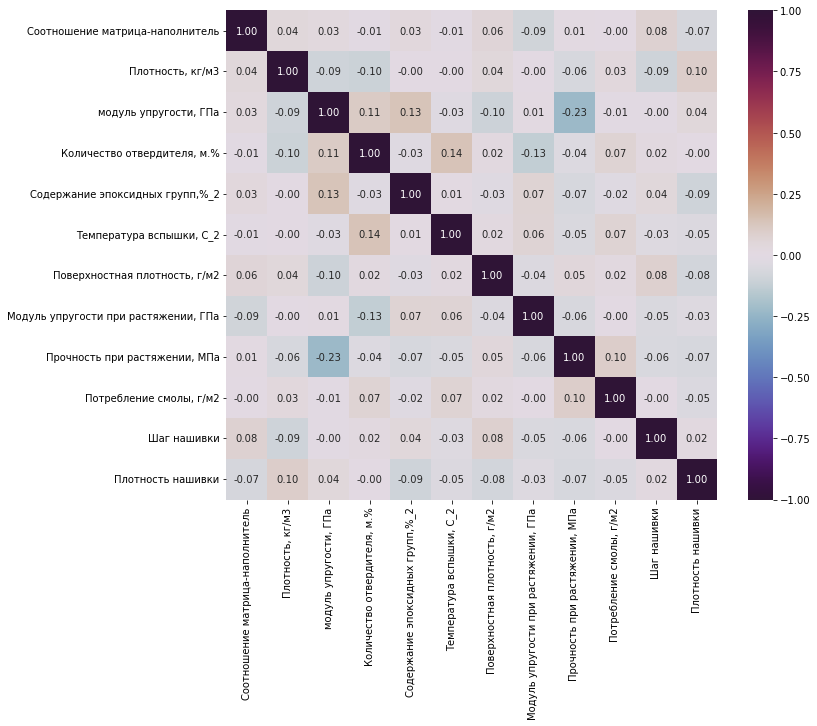

In [93]:
# Матрица корреляции по Пирсону для количественных параметров
corr = ddf_0d.corr() # Пирсон установлен по умолчанию
fig, ax = plt.subplots(figsize=(11, 9))
sns.heatmap(corr, vmin=-1, vmax=1, annot=True, fmt='.2f', cmap='twilight_shifted', ax=ax)
plt.show()

In [94]:
# Проверка по критерию Пирсона
count = 0 
for col in ddf_0d.columns:
    print()
    count += 1
    print(count)
    print(col)
    for col1 in ddf_0d.columns[count:]:
        alpha = 0.05
        stat, p = stats.pearsonr(ddf_0d[col], ddf_0d[col1]) # Критерий Пирсона
        if p > alpha:
            print()
        else:
            print()
            print(f'Наименование колонок и строк С корреляцией: ')
            print(col, ' & ', col1, ': \t\t \n'  'Statistics=%.3f, p-value=%.3f' % (stat, p))


1
Соотношение матрица-наполнитель












2
Плотность, кг/м3











3
модуль упругости, ГПа


Наименование колонок и строк С корреляцией: 
модуль упругости, ГПа  &  Содержание эпоксидных групп,%_2 : 		 
Statistics=0.135, p-value=0.023




Наименование колонок и строк С корреляцией: 
модуль упругости, ГПа  &  Прочность при растяжении, МПа : 		 
Statistics=-0.229, p-value=0.000




4
Количество отвердителя, м.%


Наименование колонок и строк С корреляцией: 
Количество отвердителя, м.%  &  Температура вспышки, С_2 : 		 
Statistics=0.139, p-value=0.019


Наименование колонок и строк С корреляцией: 
Количество отвердителя, м.%  &  Модуль упругости при растяжении, ГПа : 		 
Statistics=-0.128, p-value=0.031





5
Содержание эпоксидных групп,%_2








6
Температура вспышки, С_2







7
Поверхностная плотность, г/м2






8
Модуль упругости при растяжении, ГПа





9
Прочность при растяжении, МПа




10
Потребление смолы, г/м2



11
Шаг нашивки


12
Плотность нашивки


Вывод: статистически значимыми по критерию Пирсона оказываются следующие попарные корреляции между количественными параметрами:

    модуль упругости, ГПа  &  Содержание эпоксидных групп,%_2 : Statistics=0.135, p-value=0.023
    модуль упругости, ГПа  &  Прочность при растяжении, МПа : Statistics=-0.229, p-value=0.000
    Количество отвердителя, м.%  &  Температура вспышки, С_2 : Statistics=0.139, p-value=0.019
    Количество отвердителя, м.%  &  Модуль упругости при растяжении, ГПа : Statistics=-0.128, p-value=0.031

Наименование колонок с данными БЕЗ нормального распределения : ['Поверхностная плотность, г/м2']

Учитывая, что присутствует порядковый ранжированный параметр 'Угол нашивки', следует проверить статистическую значимость попарных корреляций этого параметра с остальными параметрами по критерию Спирмена:

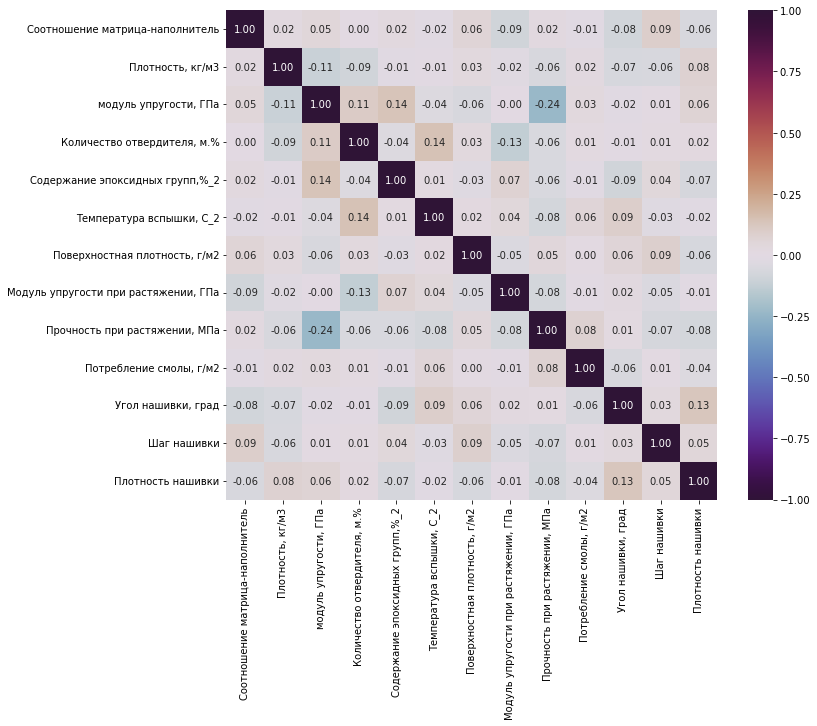

In [99]:
# Мартица корреляции по ранговому критерию корреляции Спирмена для категориальных и количественно-категориальных параметров
fig, ax = plt.subplots(figsize=(11, 9)) # аргумент 'spearman' указывает на критерий Спирмена
hm = sns.heatmap(ddf_0.corr(method = 'spearman'),  vmin=-1, vmax=1, annot=True, fmt='.2f', cmap='twilight_shifted', ax=ax)

In [100]:
# Проверка по критерию Спирмена
accepted_list = []
rejected_list = []

for col in ddf_0.columns:
    alpha = 0.05
    stat, p = stats.spearmanr(ddf_0['Угол нашивки, град'] , ddf_0[col]) # ранговая корреляция Спирмена
    print(col, ': \t \t \t'  'Statistics=%.3f, p-value=%.3f' % (stat, p))
    if p > alpha:
        accepted_list.append(col)
    else:
        rejected_list.append(col)
print()
print(f'Наименование колонок, для которых принимается H0 и отвергается альтернативная H1 : {accepted_list} \n')
print(f'Наименование колонок, для которых принимается альтернативная H1 и отвергается H0 : {rejected_list}')

Соотношение матрица-наполнитель : 	 	 	Statistics=-0.084, p-value=0.159
Плотность, кг/м3 : 	 	 	Statistics=-0.067, p-value=0.264
модуль упругости, ГПа : 	 	 	Statistics=-0.016, p-value=0.783
Количество отвердителя, м.% : 	 	 	Statistics=-0.011, p-value=0.853
Содержание эпоксидных групп,%_2 : 	 	 	Statistics=-0.086, p-value=0.147
Температура вспышки, С_2 : 	 	 	Statistics=0.094, p-value=0.115
Поверхностная плотность, г/м2 : 	 	 	Statistics=0.059, p-value=0.325
Модуль упругости при растяжении, ГПа : 	 	 	Statistics=0.022, p-value=0.706
Прочность при растяжении, МПа : 	 	 	Statistics=0.013, p-value=0.825
Потребление смолы, г/м2 : 	 	 	Statistics=-0.061, p-value=0.309
Угол нашивки, град : 	 	 	Statistics=1.000, p-value=0.000
Шаг нашивки : 	 	 	Statistics=0.031, p-value=0.603
Плотность нашивки : 	 	 	Statistics=0.129, p-value=0.030

Наименование колонок, для которых принимается H0 и отвергается альтернативная H1 : ['Соотношение матрица-наполнитель', 'Плотность, кг/м3', 'модуль упругости, ГП

In [98]:
# Проверка по критерию Спирмена
count = 0 
for col in ddf_0.columns:
    print()
    count += 1
    print(count)
    print(col)
    for col1 in ddf_0.columns[count:]:
        alpha = 0.05
        stat, p = stats.spearmanr(ddf_0[col], ddf_0[col1]) # Критерий Спирмена
        if p > alpha:
            print()
        else:
            print()
            print(f'Наименование колонок и строк С корреляцией: ')
            print(col, ' & ', col1, ': \t\t \n'  'Statistics=%.3f, p-value=%.3f' % (stat, p))



1
Соотношение матрица-наполнитель













2
Плотность, кг/м3












3
модуль упругости, ГПа


Наименование колонок и строк С корреляцией: 
модуль упругости, ГПа  &  Содержание эпоксидных групп,%_2 : 		 
Statistics=0.136, p-value=0.022




Наименование колонок и строк С корреляцией: 
модуль упругости, ГПа  &  Прочность при растяжении, МПа : 		 
Statistics=-0.238, p-value=0.000





4
Количество отвердителя, м.%


Наименование колонок и строк С корреляцией: 
Количество отвердителя, м.%  &  Температура вспышки, С_2 : 		 
Statistics=0.142, p-value=0.017


Наименование колонок и строк С корреляцией: 
Количество отвердителя, м.%  &  Модуль упругости при растяжении, ГПа : 		 
Statistics=-0.128, p-value=0.031






5
Содержание эпоксидных групп,%_2









6
Температура вспышки, С_2








7
Поверхностная плотность, г/м2







8
Модуль упругости при растяжении, ГПа






9
Прочность при растяжении, МПа





10
Потребление смолы, г/м2




11
Угол нашивки, град


Наименование колон

Вывод: кроме того для параметров 'Поверхностная плотность' проверка по критерию Спирмена показала, что значимы следующие корреляции:

    модуль упругости, ГПа  &  Содержание эпоксидных групп,%_2 : Statistics=0.136, p-value=0.022
    модуль упругости, ГПа  &  Прочность при растяжении, МПа : Statistics=-0.238, p-value=0.000
    Количество отвердителя, м.%  &  Температура вспышки, С_2 : Statistics=0.142, p-value=0.017
    Количество отвердителя, м.%  &  Модуль упругости при растяжении, ГПа : Statistics=-0.128, p-value=0.031
    Угол нашивки, град  &  Плотность нашивки : Statistics=0.129, p-value=0.030

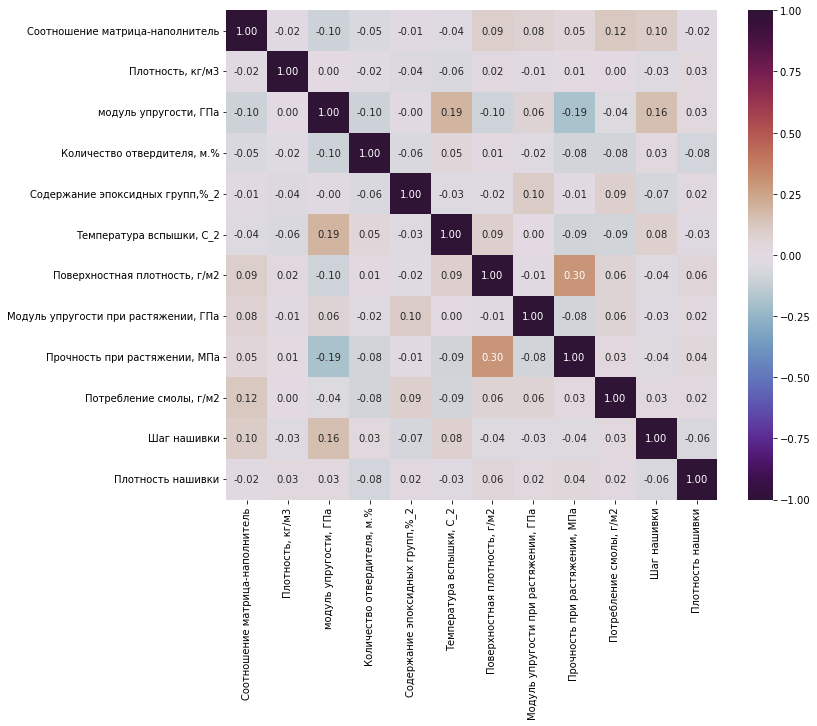

In [112]:
# Матрица корреляции по Пирсону для количественных параметров
corr = ddf_1d.corr() # Пирсон установлен по умолчанию
fig, ax = plt.subplots(figsize=(11, 9))
sns.heatmap(corr, vmin=-1, vmax=1, annot=True, fmt='.2f', cmap='twilight_shifted', ax=ax)
plt.show()

In [113]:
# Проверка по критерию Пирсона
count = 0 
for col in ddf_1d.columns:
    print()
    count += 1
    print(count)
    print(col)
    for col1 in ddf_1d.columns[count:]:
        alpha = 0.05
        stat, p = stats.pearsonr(ddf_1d[col], ddf_1d[col1]) # Критерий Пирсона
        if p > alpha:
            print()
        else:
            print()
            print(f'Наименование колонок и строк С корреляцией: ')
            print(col, ' & ', col1, ': \t\t \n'  'Statistics=%.3f, p-value=%.3f' % (stat, p))


1
Соотношение матрица-наполнитель












2
Плотность, кг/м3











3
модуль упругости, ГПа



Наименование колонок и строк С корреляцией: 
модуль упругости, ГПа  &  Температура вспышки, С_2 : 		 
Statistics=0.191, p-value=0.002



Наименование колонок и строк С корреляцией: 
модуль упругости, ГПа  &  Прочность при растяжении, МПа : 		 
Statistics=-0.192, p-value=0.002


Наименование колонок и строк С корреляцией: 
модуль упругости, ГПа  &  Шаг нашивки : 		 
Statistics=0.155, p-value=0.014


4
Количество отвердителя, м.%









5
Содержание эпоксидных групп,%_2








6
Температура вспышки, С_2







7
Поверхностная плотность, г/м2


Наименование колонок и строк С корреляцией: 
Поверхностная плотность, г/м2  &  Прочность при растяжении, МПа : 		 
Statistics=0.296, p-value=0.000




8
Модуль упругости при растяжении, ГПа





9
Прочность при растяжении, МПа




10
Потребление смолы, г/м2



11
Шаг нашивки


12
Плотность нашивки


Вывод: статистически значимыми по критерию Пирсона оказываются следующие попарные корреляции между количественными параметрами:

    модуль упругости, ГПа  &  Температура вспышки, С_2 : Statistics=0.191, p-value=0.002
    модуль упругости, ГПа  &  Прочность при растяжении, МПа : Statistics=-0.192, p-value=0.002
    модуль упругости, ГПа  &  Шаг нашивки : Statistics=0.155, p-value=0.014
    Поверхностная плотность, г/м2  &  Прочность при растяжении, МПа : Statistics=0.296, p-value=0.000


Наименование колонок с данными БЕЗ нормального распределения : ['Температура вспышки, С_2', 'Поверхностная плотность, г/м2', 'Прочность при растяжении, МПа', 'Шаг нашивки']    

Учитывая, что присутствует порядковый ранжированный параметр 'Угол нашивки', следует проверить статистическую значимость попарных корреляций этого параметра с остальными параметрами по критерию Спирмена:


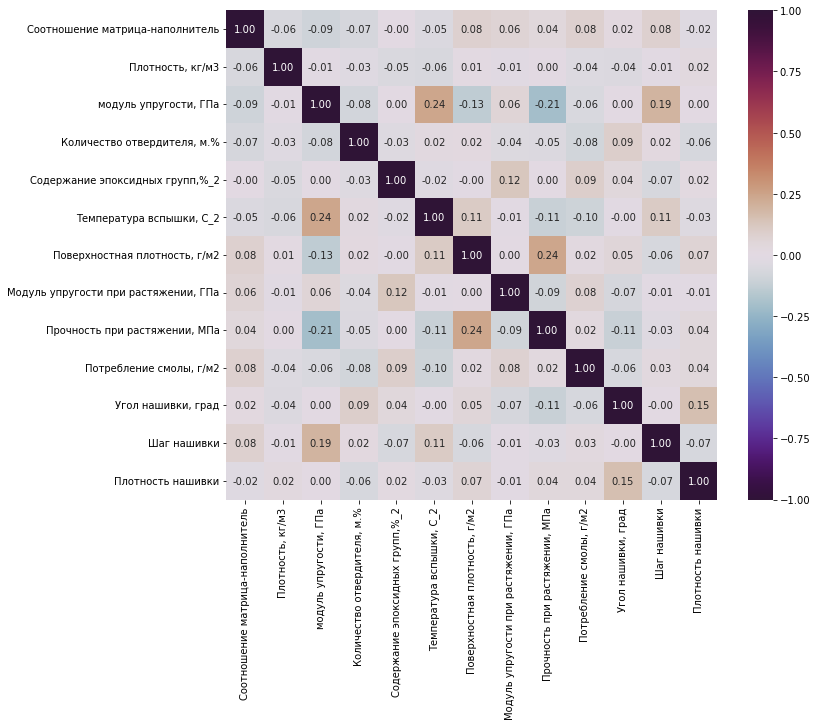

In [109]:
# Мартица корреляции по ранговому критерию корреляции Спирмена для категориальных и количественно-категориальных параметров
fig, ax = plt.subplots(figsize=(11, 9)) # аргумент 'spearman' указывает на критерий Спирмена
hm = sns.heatmap(ddf_1.corr(method = 'spearman'),  vmin=-1, vmax=1, annot=True, fmt='.2f', cmap='twilight_shifted', ax=ax)

In [110]:
# Проверка по критерию Спирмена
accepted_list = []
rejected_list = []

for col in ddf_1.columns:
    alpha = 0.05
    stat, p = stats.spearmanr(ddf_1['Угол нашивки, град'] , ddf_1[col]) # ранговая корреляция Спирмена
    print(col, ': \t \t \t'  'Statistics=%.3f, p-value=%.3f' % (stat, p))
    if p > alpha:
        accepted_list.append(col)
    else:
        rejected_list.append(col)
print()
print(f'Наименование колонок, для которых принимается H0 и отвергается альтернативная H1 : {accepted_list} \n')
print(f'Наименование колонок, для которых принимается альтернативная H1 и отвергается H0 : {rejected_list}')

Соотношение матрица-наполнитель : 	 	 	Statistics=0.018, p-value=0.777
Плотность, кг/м3 : 	 	 	Statistics=-0.044, p-value=0.484
модуль упругости, ГПа : 	 	 	Statistics=0.000, p-value=0.999
Количество отвердителя, м.% : 	 	 	Statistics=0.092, p-value=0.145
Содержание эпоксидных групп,%_2 : 	 	 	Statistics=0.036, p-value=0.567
Температура вспышки, С_2 : 	 	 	Statistics=-0.004, p-value=0.949
Поверхностная плотность, г/м2 : 	 	 	Statistics=0.053, p-value=0.403
Модуль упругости при растяжении, ГПа : 	 	 	Statistics=-0.070, p-value=0.269
Прочность при растяжении, МПа : 	 	 	Statistics=-0.113, p-value=0.073
Потребление смолы, г/м2 : 	 	 	Statistics=-0.065, p-value=0.307
Угол нашивки, град : 	 	 	Statistics=1.000, p-value=0.000
Шаг нашивки : 	 	 	Statistics=-0.003, p-value=0.957
Плотность нашивки : 	 	 	Statistics=0.155, p-value=0.014

Наименование колонок, для которых принимается H0 и отвергается альтернативная H1 : ['Соотношение матрица-наполнитель', 'Плотность, кг/м3', 'модуль упругости, ГП

In [111]:
# Проверка по критерию Спирмена
count = 0 
for col in ddf_1.columns:
    print()
    count += 1
    print(count)
    print(col)
    for col1 in ddf_1.columns[count:]:
        alpha = 0.05
        stat, p = stats.spearmanr(ddf_1[col], ddf_1[col1]) # Критерий Спирмена
        if p > alpha:
            print()
        else:
            print()
            print(f'Наименование колонок и строк С корреляцией: ')
            print(col, ' & ', col1, ': \t\t \n'  'Statistics=%.3f, p-value=%.3f' % (stat, p))



1
Соотношение матрица-наполнитель













2
Плотность, кг/м3












3
модуль упругости, ГПа



Наименование колонок и строк С корреляцией: 
модуль упругости, ГПа  &  Температура вспышки, С_2 : 		 
Statistics=0.242, p-value=0.000

Наименование колонок и строк С корреляцией: 
модуль упругости, ГПа  &  Поверхностная плотность, г/м2 : 		 
Statistics=-0.134, p-value=0.034


Наименование колонок и строк С корреляцией: 
модуль упругости, ГПа  &  Прочность при растяжении, МПа : 		 
Statistics=-0.208, p-value=0.001



Наименование колонок и строк С корреляцией: 
модуль упругости, ГПа  &  Шаг нашивки : 		 
Statistics=0.192, p-value=0.002


4
Количество отвердителя, м.%










5
Содержание эпоксидных групп,%_2



Наименование колонок и строк С корреляцией: 
Содержание эпоксидных групп,%_2  &  Модуль упругости при растяжении, ГПа : 		 
Statistics=0.125, p-value=0.048






6
Температура вспышки, С_2








7
Поверхностная плотность, г/м2


Наименование колонок и строк С корреляцией:

Вывод: кроме того для параметров 'Температура вспышки, С_2', 'Поверхностная плотность, г/м2', 'Прочность при растяжении, МПа', 'Шаг нашивки' проверка по критерию Спирмена показала, что значимы следующие корреляции:

    модуль упругости, ГПа  &  Температура вспышки, С_2 : Statistics=0.242, p-value=0.000
    модуль упругости, ГПа  &  Поверхностная плотность, г/м2 : Statistics=-0.134, p-value=0.034
    модуль упругости, ГПа  &  Прочность при растяжении, МПа : Statistics=-0.208, p-value=0.001
    модуль упругости, ГПа  &  Шаг нашивки : Statistics=0.192, p-value=0.002
    Содержание эпоксидных групп,%_2  &  Модуль упругости при растяжении, ГПа : Statistics=0.125, p-value=0.048
    Поверхностная плотность, г/м2  &  Прочность при растяжении, МПа : Statistics=0.242, p-value=0.000
    Угол нашивки, град  &  Плотность нашивки : Statistics=0.155, p-value=0.014

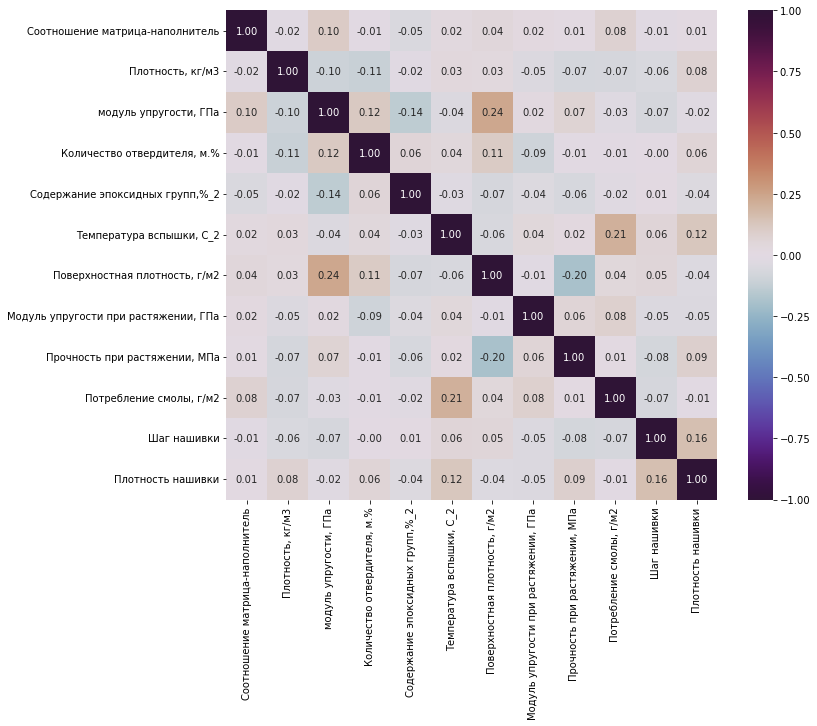

In [114]:
# Матрица корреляции по Пирсону для количественных параметров
corr = ddf_2d.corr() # Пирсон установлен по умолчанию
fig, ax = plt.subplots(figsize=(11, 9))
sns.heatmap(corr, vmin=-1, vmax=1, annot=True, fmt='.2f', cmap='twilight_shifted', ax=ax)
plt.show()

In [115]:
# Проверка по критерию Пирсона
count = 0 
for col in ddf_2d.columns:
    print()
    count += 1
    print(count)
    print(col)
    for col1 in ddf_2d.columns[count:]:
        alpha = 0.05
        stat, p = stats.pearsonr(ddf_2d[col], ddf_2d[col1]) # Критерий Пирсона
        if p > alpha:
            print()
        else:
            print()
            print(f'Наименование колонок и строк С корреляцией: ')
            print(col, ' & ', col1, ': \t\t \n'  'Statistics=%.3f, p-value=%.3f' % (stat, p))


1
Соотношение матрица-наполнитель












2
Плотность, кг/м3











3
модуль упругости, ГПа


Наименование колонок и строк С корреляцией: 
модуль упругости, ГПа  &  Содержание эпоксидных групп,%_2 : 		 
Statistics=-0.138, p-value=0.025


Наименование колонок и строк С корреляцией: 
модуль упругости, ГПа  &  Поверхностная плотность, г/м2 : 		 
Statistics=0.236, p-value=0.000






4
Количество отвердителя, м.%









5
Содержание эпоксидных групп,%_2








6
Температура вспышки, С_2




Наименование колонок и строк С корреляцией: 
Температура вспышки, С_2  &  Потребление смолы, г/м2 : 		 
Statistics=0.206, p-value=0.001


Наименование колонок и строк С корреляцией: 
Температура вспышки, С_2  &  Плотность нашивки : 		 
Statistics=0.124, p-value=0.044

7
Поверхностная плотность, г/м2


Наименование колонок и строк С корреляцией: 
Поверхностная плотность, г/м2  &  Прочность при растяжении, МПа : 		 
Statistics=-0.196, p-value=0.001




8
Модуль упругости при растяжении, ГПа




Вывод: статистически значимыми по критерию Пирсона оказываются следующие попарные корреляции между количественными параметрами:

    модуль упругости, ГПа  &  Содержание эпоксидных групп,%_2 : Statistics=-0.138, p-value=0.025
    модуль упругости, ГПа  &  Поверхностная плотность, г/м2 : Statistics=0.236, p-value=0.000
    Температура вспышки, С_2  &  Потребление смолы, г/м2 : Statistics=0.206, p-value=0.001
    Температура вспышки, С_2  &  Плотность нашивки : Statistics=0.124, p-value=0.044
    Поверхностная плотность, г/м2  &  Прочность при растяжении, МПа : Statistics=-0.196, p-value=0.001
    Шаг нашивки  &  Плотность нашивки : Statistics=0.156, p-value=0.011

Учитывая, что присутствует порядковый ранжированный параметр 'Угол нашивки', следует проверить статистическую значимость попарных корреляций этого параметра с остальными параметрами по критерию Спирмена:


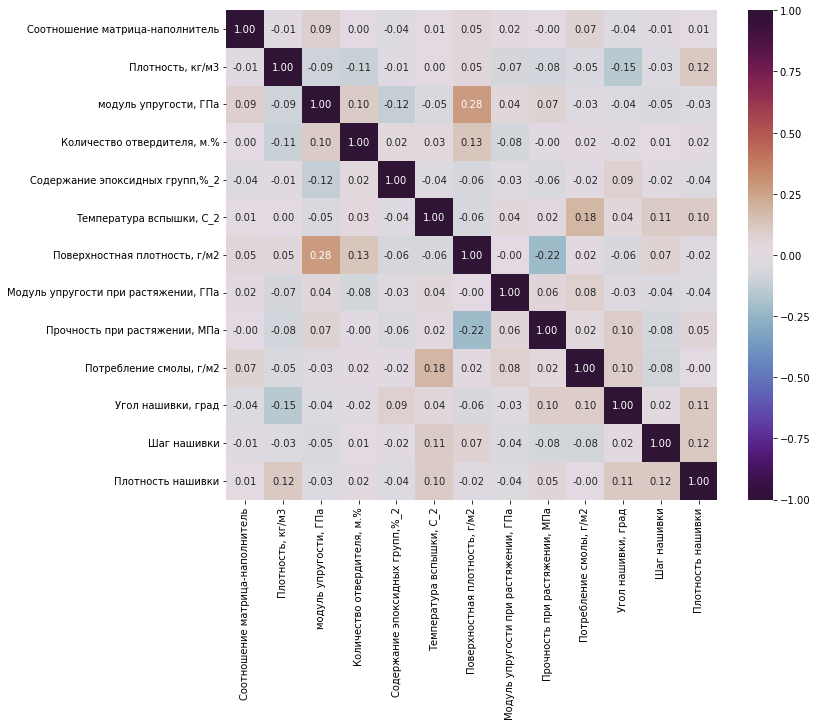

In [116]:
# Мартица корреляции по ранговому критерию корреляции Спирмена для категориальных и количественно-категориальных параметров
fig, ax = plt.subplots(figsize=(11, 9)) # аргумент 'spearman' указывает на критерий Спирмена
hm = sns.heatmap(ddf_2.corr(method = 'spearman'),  vmin=-1, vmax=1, annot=True, fmt='.2f', cmap='twilight_shifted', ax=ax)

In [117]:
# Проверка по критерию Спирмена
accepted_list = []
rejected_list = []

for col in ddf_2.columns:
    alpha = 0.05
    stat, p = stats.spearmanr(ddf_2['Угол нашивки, град'] , ddf_2[col]) # ранговая корреляция Спирмена
    print(col, ': \t \t \t'  'Statistics=%.3f, p-value=%.3f' % (stat, p))
    if p > alpha:
        accepted_list.append(col)
    else:
        rejected_list.append(col)
print()
print(f'Наименование колонок, для которых принимается H0 и отвергается альтернативная H1 : {accepted_list} \n')
print(f'Наименование колонок, для которых принимается альтернативная H1 и отвергается H0 : {rejected_list}')

Соотношение матрица-наполнитель : 	 	 	Statistics=-0.035, p-value=0.568
Плотность, кг/м3 : 	 	 	Statistics=-0.152, p-value=0.014
модуль упругости, ГПа : 	 	 	Statistics=-0.038, p-value=0.536
Количество отвердителя, м.% : 	 	 	Statistics=-0.022, p-value=0.726
Содержание эпоксидных групп,%_2 : 	 	 	Statistics=0.086, p-value=0.166
Температура вспышки, С_2 : 	 	 	Statistics=0.040, p-value=0.514
Поверхностная плотность, г/м2 : 	 	 	Statistics=-0.062, p-value=0.313
Модуль упругости при растяжении, ГПа : 	 	 	Statistics=-0.030, p-value=0.628
Прочность при растяжении, МПа : 	 	 	Statistics=0.098, p-value=0.113
Потребление смолы, г/м2 : 	 	 	Statistics=0.096, p-value=0.119
Угол нашивки, град : 	 	 	Statistics=1.000, p-value=0.000
Шаг нашивки : 	 	 	Statistics=0.015, p-value=0.805
Плотность нашивки : 	 	 	Statistics=0.115, p-value=0.063

Наименование колонок, для которых принимается H0 и отвергается альтернативная H1 : ['Соотношение матрица-наполнитель', 'модуль упругости, ГПа', 'Количество отве

In [118]:
# Проверка по критерию Спирмена
count = 0 
for col in ddf_2.columns:
    print()
    count += 1
    print(count)
    print(col)
    for col1 in ddf_2.columns[count:]:
        alpha = 0.05
        stat, p = stats.spearmanr(ddf_2[col], ddf_2[col1]) # Критерий Спирмена
        if p > alpha:
            print()
        else:
            print()
            print(f'Наименование колонок и строк С корреляцией: ')
            print(col, ' & ', col1, ': \t\t \n'  'Statistics=%.3f, p-value=%.3f' % (stat, p))



1
Соотношение матрица-наполнитель













2
Плотность, кг/м3









Наименование колонок и строк С корреляцией: 
Плотность, кг/м3  &  Угол нашивки, град : 		 
Statistics=-0.152, p-value=0.014



3
модуль упругости, ГПа


Наименование колонок и строк С корреляцией: 
модуль упругости, ГПа  &  Содержание эпоксидных групп,%_2 : 		 
Statistics=-0.124, p-value=0.045


Наименование колонок и строк С корреляцией: 
модуль упругости, ГПа  &  Поверхностная плотность, г/м2 : 		 
Statistics=0.276, p-value=0.000







4
Количество отвердителя, м.%



Наименование колонок и строк С корреляцией: 
Количество отвердителя, м.%  &  Поверхностная плотность, г/м2 : 		 
Statistics=0.131, p-value=0.034







5
Содержание эпоксидных групп,%_2









6
Температура вспышки, С_2




Наименование колонок и строк С корреляцией: 
Температура вспышки, С_2  &  Потребление смолы, г/м2 : 		 
Statistics=0.181, p-value=0.003




7
Поверхностная плотность, г/м2


Наименование колонок и строк С корреляцией: 
Пов

Вывод: кроме того для параметров 'Поверхностная плотность, г/м2', 'Потребление смолы, г/м2', 'Плотность нашивки' проверка по критерию Спирмена показала, что значимы следующие корреляции:

    Плотность, кг/м3  &  Угол нашивки, град : Statistics=-0.152, p-value=0.014
    модуль упругости, ГПа  &  Содержание эпоксидных групп,%_2 : Statistics=-0.124, p-value=0.045
    модуль упругости, ГПа  &  Поверхностная плотность, г/м2 : Statistics=0.276, p-value=0.000
    Количество отвердителя, м.%  &  Поверхностная плотность, г/м2 : Statistics=0.131, p-value=0.034
    Температура вспышки, С_2  &  Потребление смолы, г/м2 : Statistics=0.181, p-value=0.003
    Поверхностная плотность, г/м2  &  Прочность при растяжении, МПа : Statistics=-0.221, p-value=0.000

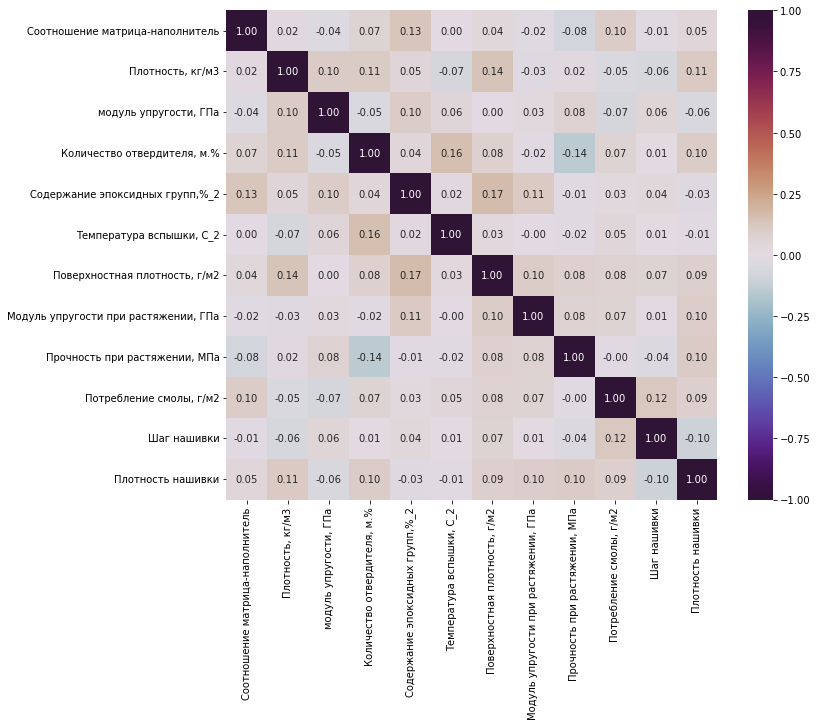

In [119]:
# Матрица корреляции по Пирсону для количественных параметров
corr = ddf_3d.corr() # Пирсон установлен по умолчанию
fig, ax = plt.subplots(figsize=(11, 9))
sns.heatmap(corr, vmin=-1, vmax=1, annot=True, fmt='.2f', cmap='twilight_shifted', ax=ax)
plt.show()

In [120]:
# Проверка по критерию Пирсона
count = 0 
for col in ddf_3d.columns:
    print()
    count += 1
    print(count)
    print(col)
    for col1 in ddf_3d.columns[count:]:
        alpha = 0.05
        stat, p = stats.pearsonr(ddf_3d[col], ddf_3d[col1]) # Критерий Пирсона
        if p > alpha:
            print()
        else:
            print()
            print(f'Наименование колонок и строк С корреляцией: ')
            print(col, ' & ', col1, ': \t\t \n'  'Statistics=%.3f, p-value=%.3f' % (stat, p))


1
Соотношение матрица-наполнитель












2
Плотность, кг/м3





Наименование колонок и строк С корреляцией: 
Плотность, кг/м3  &  Поверхностная плотность, г/м2 : 		 
Statistics=0.135, p-value=0.043






3
модуль упругости, ГПа










4
Количество отвердителя, м.%


Наименование колонок и строк С корреляцией: 
Количество отвердителя, м.%  &  Температура вспышки, С_2 : 		 
Statistics=0.156, p-value=0.019



Наименование колонок и строк С корреляцией: 
Количество отвердителя, м.%  &  Прочность при растяжении, МПа : 		 
Statistics=-0.142, p-value=0.033




5
Содержание эпоксидных групп,%_2


Наименование колонок и строк С корреляцией: 
Содержание эпоксидных групп,%_2  &  Поверхностная плотность, г/м2 : 		 
Statistics=0.166, p-value=0.013






6
Температура вспышки, С_2







7
Поверхностная плотность, г/м2






8
Модуль упругости при растяжении, ГПа





9
Прочность при растяжении, МПа




10
Потребление смолы, г/м2



11
Шаг нашивки


12
Плотность нашивки


Вывод: коэффициент корреляции для параметров 'Прочность при растяжении, МПа' и 'Поверхностная плотность, г/м2' увеличился в группах примерно до 0,14 - 0,20 - 0,3

Вывод: статистически значимыми по критерию Пирсона оказываются следующие попарные корреляции между количественными параметрами:

    Плотность, кг/м3  &  Поверхностная плотность, г/м2 : Statistics=0.135, p-value=0.043
    Количество отвердителя, м.%  &  Температура вспышки, С_2 : Statistics=0.156, p-value=0.019
    Количество отвердителя, м.%  &  Прочность при растяжении, МПа : Statistics=-0.142, p-value=0.033
    Содержание эпоксидных групп,%_2  &  Поверхностная плотность, г/м2 : Statistics=0.166, p-value=0.013

Учитывая, что присутствует порядковый ранжированный параметр 'Угол нашивки', следует проверить статистическую значимость попарных корреляций этого параметра с остальными параметрами по критерию Спирмена:


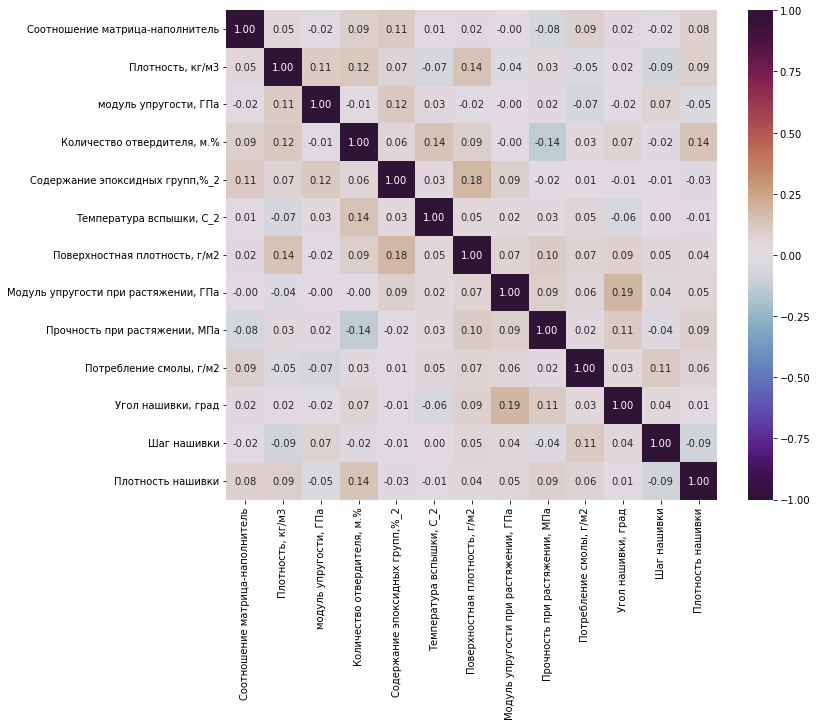

In [121]:
# Мартица корреляции по ранговому критерию корреляции Спирмена для категориальных и количественно-категориальных параметров
fig, ax = plt.subplots(figsize=(11, 9)) # аргумент 'spearman' указывает на критерий Спирмена
hm = sns.heatmap(ddf_3.corr(method = 'spearman'),  vmin=-1, vmax=1, annot=True, fmt='.2f', cmap='twilight_shifted', ax=ax)

In [122]:
# Проверка по критерию Спирмена
accepted_list = []
rejected_list = []

for col in ddf_3.columns:
    alpha = 0.05
    stat, p = stats.spearmanr(ddf_3['Угол нашивки, град'] , ddf_3[col]) # ранговая корреляция Спирмена
    print(col, ': \t \t \t'  'Statistics=%.3f, p-value=%.3f' % (stat, p))
    if p > alpha:
        accepted_list.append(col)
    else:
        rejected_list.append(col)
print()
print(f'Наименование колонок, для которых принимается H0 и отвергается альтернативная H1 : {accepted_list} \n')
print(f'Наименование колонок, для которых принимается альтернативная H1 и отвергается H0 : {rejected_list}')

Соотношение матрица-наполнитель : 	 	 	Statistics=0.020, p-value=0.765
Плотность, кг/м3 : 	 	 	Statistics=0.015, p-value=0.820
модуль упругости, ГПа : 	 	 	Statistics=-0.021, p-value=0.757
Количество отвердителя, м.% : 	 	 	Statistics=0.067, p-value=0.318
Содержание эпоксидных групп,%_2 : 	 	 	Statistics=-0.007, p-value=0.912
Температура вспышки, С_2 : 	 	 	Statistics=-0.063, p-value=0.346
Поверхностная плотность, г/м2 : 	 	 	Statistics=0.086, p-value=0.201
Модуль упругости при растяжении, ГПа : 	 	 	Statistics=0.186, p-value=0.005
Прочность при растяжении, МПа : 	 	 	Statistics=0.113, p-value=0.092
Потребление смолы, г/м2 : 	 	 	Statistics=0.025, p-value=0.704
Угол нашивки, град : 	 	 	Statistics=1.000, p-value=0.000
Шаг нашивки : 	 	 	Statistics=0.043, p-value=0.521
Плотность нашивки : 	 	 	Statistics=0.012, p-value=0.856

Наименование колонок, для которых принимается H0 и отвергается альтернативная H1 : ['Соотношение матрица-наполнитель', 'Плотность, кг/м3', 'модуль упругости, ГПа',

In [123]:
# Проверка по критерию Спирмена
count = 0 
for col in ddf_3.columns:
    print()
    count += 1
    print(count)
    print(col)
    for col1 in ddf_3.columns[count:]:
        alpha = 0.05
        stat, p = stats.spearmanr(ddf_3[col], ddf_3[col1]) # Критерий Спирмена
        if p > alpha:
            print()
        else:
            print()
            print(f'Наименование колонок и строк С корреляцией: ')
            print(col, ' & ', col1, ': \t\t \n'  'Statistics=%.3f, p-value=%.3f' % (stat, p))



1
Соотношение матрица-наполнитель













2
Плотность, кг/м3





Наименование колонок и строк С корреляцией: 
Плотность, кг/м3  &  Поверхностная плотность, г/м2 : 		 
Statistics=0.142, p-value=0.034







3
модуль упругости, ГПа











4
Количество отвердителя, м.%


Наименование колонок и строк С корреляцией: 
Количество отвердителя, м.%  &  Температура вспышки, С_2 : 		 
Statistics=0.144, p-value=0.031



Наименование колонок и строк С корреляцией: 
Количество отвердителя, м.%  &  Прочность при растяжении, МПа : 		 
Statistics=-0.137, p-value=0.040




Наименование колонок и строк С корреляцией: 
Количество отвердителя, м.%  &  Плотность нашивки : 		 
Statistics=0.138, p-value=0.039

5
Содержание эпоксидных групп,%_2


Наименование колонок и строк С корреляцией: 
Содержание эпоксидных групп,%_2  &  Поверхностная плотность, г/м2 : 		 
Statistics=0.181, p-value=0.006







6
Температура вспышки, С_2








7
Поверхностная плотность, г/м2







8
Модуль упругости при раст

Вывод: кроме того для параметров 'модуль упругости, ГПа', 'Модуль упругости при растяжении, ГПа', 'Прочность при растяжении, МПа' проверка по критерию Спирмена показала, что значимы следующие корреляции:

   
    Плотность, кг/м3  &  Поверхностная плотность, г/м2 : Statistics=0.142, p-value=0.034
    Количество отвердителя, м.%  &  Температура вспышки, С_2 : Statistics=0.144, p-value=0.031
    Количество отвердителя, м.%  &  Прочность при растяжении, МПа : Statistics=-0.137, p-value=0.040
    Количество отвердителя, м.%  &  Плотность нашивки : Statistics=0.138, p-value=0.039
    Содержание эпоксидных групп,%_2  &  Поверхностная плотность, г/м2 : Statistics=0.181, p-value=0.006
    Модуль упругости при растяжении, ГПа  &  Угол нашивки, град : Statistics=0.186, p-value=0.005

#### 5. Построение моделей статистической регрессии

In [124]:
# Загрузка библиотек sklearn для проведения регрессионного анализа
import sklearn.linear_model as lm
import statsmodels.formula.api as smf

###### Анализ общей модели множественной регрессии

In [125]:
# Создание нового датасета ff для модели множественной регрессии
ff0 = ddf_0
# Замена названия столбцов таблицы методом set_axis() для создания OLS-модели
ff0 = ff0.set_axis(['col1','col2','col3','col4','col5','col6','col7','col8','col9','col10','col11','col12','col13'], axis = 'columns')
ff0.head()

,col1,col2,col3,col4,col5,col6,col7,col8,col9,col10,col11,col12,col13
0,2.561475,1900.0,535.0,111.86,22.267857,284.615385,380.0,75.000000,1800.000000,120.0,0,7.0,47.0
1,2.919678,1980.0,568.0,129.00,21.250000,300.000000,470.0,73.333333,2455.555556,220.0,0,9.0,60.0
2,2.934783,2030.0,302.0,129.00,21.250000,300.000000,210.0,70.000000,3000.000000,220.0,0,10.0,47.0
3,3.557018,1880.0,313.0,129.00,21.250000,300.000000,210.0,70.000000,3000.000000,220.0,0,10.0,57.0
4,4.193548,1950.0,506.0,129.00,21.250000,300.000000,380.0,75.000000,1800.000000,120.0,0,10.0,60.0


In [126]:
# Создание нового датасета ff для модели множественной регрессии
ff1 = ddf_1
# Замена названия столбцов таблицы методом set_axis() для создания OLS-модели
ff1 = ff1.set_axis(['col1','col2','col3','col4','col5','col6','col7','col8','col9','col10','col11','col12','col13'], axis = 'columns')
ff1.head()

,col1,col2,col3,col4,col5,col6,col7,col8,col9,col10,col11,col12,col13
0,1.857143,2030.0,738.736842,30.00,22.267857,100.000000,210.0,70.0,3000.0,220.0,0,4.0,57.0
1,1.857143,2030.0,738.736842,50.00,23.750000,284.615385,210.0,70.0,3000.0,220.0,0,4.0,60.0
2,1.857143,2030.0,738.736842,49.90,33.000000,284.615385,210.0,70.0,3000.0,220.0,0,4.0,70.0
3,1.857143,2030.0,738.736842,129.00,21.250000,300.000000,210.0,70.0,3000.0,220.0,0,5.0,47.0
4,2.771331,2030.0,753.000000,111.86,22.267857,284.615385,210.0,70.0,3000.0,220.0,0,5.0,57.0


In [127]:
# Создание нового датасета ff для модели множественной регрессии
ff2 = ddf_2
# Замена названия столбцов таблицы методом set_axis() для создания OLS-модели
ff2 = ff2.set_axis(['col1','col2','col3','col4','col5','col6','col7','col8','col9','col10','col11','col12','col13'], axis = 'columns')
ff2.head()

,col1,col2,col3,col4,col5,col6,col7,col8,col9,col10,col11,col12,col13
0,2.919678,2160.000000,933.000000,129.000000,21.250000,300.000000,1010.000000,78.000000,2000.000000,300.000000,0,7.0,70.0
1,3.532338,1980.000000,1183.000000,111.860000,22.267857,284.615385,1010.000000,78.000000,2000.000000,300.000000,0,0.0,0.0
2,2.877358,2000.000000,205.000000,111.860000,22.267857,284.615385,1010.000000,78.000000,2000.000000,300.000000,1,4.0,47.0
3,2.499918,1942.595777,901.519947,146.252208,23.081757,351.231874,864.725484,76.178075,3705.672523,226.222760,1,5.0,47.0
4,2.709554,1892.071124,641.052549,96.563293,22.989291,262.956722,804.592621,74.511359,2288.967377,126.816339,1,7.0,47.0


In [128]:
# Создание нового датасета ff для модели множественной регрессии
ff3 = ddf_3
# Замена названия столбцов таблицы методом set_axis() для создания OLS-модели
ff3 = ff3.set_axis(['col1','col2','col3','col4','col5','col6','col7','col8','col9','col10','col11','col12','col13'], axis = 'columns')
ff3.head()

,col1,col2,col3,col4,col5,col6,col7,col8,col9,col10,col11,col12,col13
0,3.557018,1930.0,889.0,129.0,21.25,300.0,380.0,75.000000,1800.000000,120.0,0,7.0,57.0
1,3.532338,2100.0,1421.0,129.0,21.25,300.0,1010.0,78.000000,2000.000000,300.0,0,7.0,60.0
2,2.877358,1990.0,1628.0,129.0,21.25,300.0,1010.0,78.000000,2000.000000,300.0,0,9.0,47.0
3,1.598174,1950.0,827.0,129.0,21.25,300.0,470.0,73.333333,2455.555556,220.0,0,9.0,57.0
4,4.029126,1910.0,800.0,129.0,21.25,300.0,470.0,73.333333,2455.555556,220.0,0,9.0,70.0


In [129]:
# Замена категориальных переменых порядковыми переменными, метод concat, 
# Dummy variables, аргумент get_dummies
ff0 = pd.concat((ff0,pd.get_dummies(ff0.col11, prefix="col11", prefix_sep='',)),1)
ff0.head()

C:\Users\Admin\AppData\Local\Temp\ipykernel_1292\3663672012.py:3: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  ff0 = pd.concat((ff0,pd.get_dummies(ff0.col11, prefix="col11", prefix_sep='',)),1)


,col1,col2,col3,col4,col5,col6,col7,col8,col9,col10,col11,col12,col13,col110,col111
0,2.561475,1900.0,535.0,111.86,22.267857,284.615385,380.0,75.000000,1800.000000,120.0,0,7.0,47.0,1,0
1,2.919678,1980.0,568.0,129.00,21.250000,300.000000,470.0,73.333333,2455.555556,220.0,0,9.0,60.0,1,0
2,2.934783,2030.0,302.0,129.00,21.250000,300.000000,210.0,70.000000,3000.000000,220.0,0,10.0,47.0,1,0
3,3.557018,1880.0,313.0,129.00,21.250000,300.000000,210.0,70.000000,3000.000000,220.0,0,10.0,57.0,1,0
4,4.193548,1950.0,506.0,129.00,21.250000,300.000000,380.0,75.000000,1800.000000,120.0,0,10.0,60.0,1,0


In [130]:
# Замена категориальных переменых порядковыми переменными, метод concat, 
# Dummy variables, аргумент get_dummies
ff1 = pd.concat((ff1,pd.get_dummies(ff1.col11, prefix="col11", prefix_sep='',)),1)
ff1.head()

C:\Users\Admin\AppData\Local\Temp\ipykernel_1292\2177107136.py:3: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  ff1 = pd.concat((ff1,pd.get_dummies(ff1.col11, prefix="col11", prefix_sep='',)),1)


,col1,col2,col3,col4,col5,col6,col7,col8,col9,col10,col11,col12,col13,col110,col111
0,1.857143,2030.0,738.736842,30.00,22.267857,100.000000,210.0,70.0,3000.0,220.0,0,4.0,57.0,1,0
1,1.857143,2030.0,738.736842,50.00,23.750000,284.615385,210.0,70.0,3000.0,220.0,0,4.0,60.0,1,0
2,1.857143,2030.0,738.736842,49.90,33.000000,284.615385,210.0,70.0,3000.0,220.0,0,4.0,70.0,1,0
3,1.857143,2030.0,738.736842,129.00,21.250000,300.000000,210.0,70.0,3000.0,220.0,0,5.0,47.0,1,0
4,2.771331,2030.0,753.000000,111.86,22.267857,284.615385,210.0,70.0,3000.0,220.0,0,5.0,57.0,1,0


In [131]:
# Замена категориальных переменых порядковыми переменными, метод concat, 
# Dummy variables, аргумент get_dummies
ff2 = pd.concat((ff2,pd.get_dummies(ff2.col11, prefix="col11", prefix_sep='',)),1)
ff2.head()

C:\Users\Admin\AppData\Local\Temp\ipykernel_1292\1420413336.py:3: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  ff2 = pd.concat((ff2,pd.get_dummies(ff2.col11, prefix="col11", prefix_sep='',)),1)


,col1,col2,col3,col4,col5,col6,col7,col8,col9,col10,col11,col12,col13,col110,col111
0,2.919678,2160.000000,933.000000,129.000000,21.250000,300.000000,1010.000000,78.000000,2000.000000,300.000000,0,7.0,70.0,1,0
1,3.532338,1980.000000,1183.000000,111.860000,22.267857,284.615385,1010.000000,78.000000,2000.000000,300.000000,0,0.0,0.0,1,0
2,2.877358,2000.000000,205.000000,111.860000,22.267857,284.615385,1010.000000,78.000000,2000.000000,300.000000,1,4.0,47.0,0,1
3,2.499918,1942.595777,901.519947,146.252208,23.081757,351.231874,864.725484,76.178075,3705.672523,226.222760,1,5.0,47.0,0,1
4,2.709554,1892.071124,641.052549,96.563293,22.989291,262.956722,804.592621,74.511359,2288.967377,126.816339,1,7.0,47.0,0,1


In [132]:
# Замена категориальных переменых порядковыми переменными, метод concat, 
# Dummy variables, аргумент get_dummies
ff3 = pd.concat((ff3,pd.get_dummies(ff3.col11, prefix="col11", prefix_sep='',)),1)
ff3.head()

C:\Users\Admin\AppData\Local\Temp\ipykernel_1292\347822830.py:3: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  ff3 = pd.concat((ff3,pd.get_dummies(ff3.col11, prefix="col11", prefix_sep='',)),1)


,col1,col2,col3,col4,col5,col6,col7,col8,col9,col10,col11,col12,col13,col110,col111
0,3.557018,1930.0,889.0,129.0,21.25,300.0,380.0,75.000000,1800.000000,120.0,0,7.0,57.0,1,0
1,3.532338,2100.0,1421.0,129.0,21.25,300.0,1010.0,78.000000,2000.000000,300.0,0,7.0,60.0,1,0
2,2.877358,1990.0,1628.0,129.0,21.25,300.0,1010.0,78.000000,2000.000000,300.0,0,9.0,47.0,1,0
3,1.598174,1950.0,827.0,129.0,21.25,300.0,470.0,73.333333,2455.555556,220.0,0,9.0,57.0,1,0
4,4.029126,1910.0,800.0,129.0,21.25,300.0,470.0,73.333333,2455.555556,220.0,0,9.0,70.0,1,0


In [133]:
# Модель OLS множественной регрессии для параметра 'col8' - 'Модуль упругости при растяжении, ГПа'
resultsm = smf.ols('col8 ~ col1 + col2 + col3 + col4 + col5 + col6 + col7 + col9 + col10 + col12 + col13 + col110', data=ff0).fit()
resultsm.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                   col8   R-squared:                       0.044
Model:                            OLS   Adj. R-squared:                  0.001
Method:                 Least Squares   F-statistic:                     1.032
Date:                Tue, 25 Apr 2023   Prob (F-statistic):              0.419
Time:                        23:02:42   Log-Likelihood:                -712.87
No. Observations:                 283   AIC:                             1452.
Df Residuals:                     270   BIC:                             1499.
Df Model:                          12                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept     75.9263      6.062     12.524      0.000      63.991      87.862
col1          -0.2904      0.204     -1.426      0.155      -0.691       0.111
col2          -0.0007      0.003     -0.250      0.802      -0.006       0.005
col3        3.097e-06      0.001      0.003      0.997      -0.002       0.002
col4          -0.0149      0.007     -2.291      0.023      -0.028      -0.002
col5           0.0811      0.079      1.020      0.309      -0.075       0.238
col6           0.0053      0.004      1.210      0.227      -0.003       0.014
col7          -0.0006      0.001     -0.549      0.583      -0.003       0.002
col9          -0.0005      0.001     -1.012      0.313      -0.001       0.000
col10          0.0005      0.003      0.160      0.873      -0.006       0.007
col12         -0.0562      0.074     -0.759      0.449      -0.202       0.090
col13         -0.0096      0.016     -0.612      0.541      -0.040       0.021
col110        -0.0895      0.378     -0.237      0.813      -0.833       0.654
==============================================================================
Omnibus:                        0.368   Durbin-Watson:                   2.110
Prob(Omnibus):                  0.832   Jarque-Bera (JB):                0.382
Skew:                          -0.086   Prob(JB):                        0.826
Kurtosis:                       2.949   Cond. No.                     1.01e+05
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 1.01e+05. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [134]:
# Модель OLS множественной регрессии для параметра 'col8' - 'Модуль упругости при растяжении, ГПа'
resultsm = smf.ols('col8 ~ col1 + col2 + col3 + col4 + col5 + col6 + col7 + col9 + col10 + col12 + col13 + col110', data=ff1).fit()
resultsm.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                   col8   R-squared:                       0.041
Model:                            OLS   Adj. R-squared:                 -0.007
Method:                 Least Squares   F-statistic:                    0.8551
Date:                Tue, 25 Apr 2023   Prob (F-statistic):              0.594
Time:                        23:02:42   Log-Likelihood:                -626.91
No. Observations:                 251   AIC:                             1280.
Df Residuals:                     238   BIC:                             1326.
Df Model:                          12                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept     70.4588      5.958     11.826      0.000      58.722      82.196
col1           0.2944      0.214      1.378      0.170      -0.127       0.715
col2          -0.0002      0.002     -0.073      0.942      -0.005       0.005
col3           0.0008      0.001      1.018      0.310      -0.001       0.002
col4           0.0004      0.007      0.053      0.958      -0.013       0.013
col5           0.1191      0.078      1.518      0.130      -0.035       0.274
col6          -0.0004      0.005     -0.085      0.933      -0.010       0.009
col7           0.0003      0.001      0.211      0.833      -0.002       0.003
col9          -0.0008      0.001     -1.358      0.176      -0.002       0.000
col10          0.0021      0.003      0.658      0.511      -0.004       0.008
col12         -0.0550      0.078     -0.704      0.482      -0.209       0.099
col13          0.0093      0.016      0.566      0.572      -0.023       0.042
col110         0.5895      0.396      1.489      0.138      -0.190       1.369
==============================================================================
Omnibus:                        1.479   Durbin-Watson:                   1.959
Prob(Omnibus):                  0.477   Jarque-Bera (JB):                1.574
Skew:                           0.163   Prob(JB):                        0.455
Kurtosis:                       2.791   Cond. No.                     1.14e+05
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 1.14e+05. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [135]:
# Модель OLS множественной регрессии для параметра 'col8' - 'Модуль упругости при растяжении, ГПа'
resultsm = smf.ols('col8 ~ col1 + col2 + col3 + col4 + col5 + col6 + col7 + col9 + col10 + col12 + col13 + col110', data=ff2).fit()
resultsm.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                   col8   R-squared:                       0.026
Model:                            OLS   Adj. R-squared:                 -0.020
Method:                 Least Squares   F-statistic:                    0.5671
Date:                Tue, 25 Apr 2023   Prob (F-statistic):              0.868
Time:                        23:02:42   Log-Likelihood:                -660.07
No. Observations:                 264   AIC:                             1346.
Df Residuals:                     251   BIC:                             1393.
Df Model:                          12                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept     77.4669      6.199     12.496      0.000      65.258      89.676
col1           0.0229      0.210      0.109      0.913      -0.390       0.436
col2          -0.0021      0.003     -0.760      0.448      -0.007       0.003
col3           0.0002      0.001      0.280      0.780      -0.001       0.002
col4          -0.0100      0.007     -1.487      0.138      -0.023       0.003
col5          -0.0341      0.076     -0.447      0.655      -0.184       0.116
col6           0.0030      0.005      0.617      0.538      -0.007       0.013
col7        6.985e-06      0.001      0.006      0.995      -0.002       0.002
col9           0.0003      0.000      0.818      0.414      -0.000       0.001
col10          0.0034      0.003      1.051      0.294      -0.003       0.010
col12         -0.0410      0.077     -0.532      0.595      -0.193       0.111
col13         -0.0087      0.015     -0.572      0.568      -0.039       0.021
col110         0.1262      0.388      0.325      0.746      -0.639       0.891
==============================================================================
Omnibus:                        1.923   Durbin-Watson:                   1.866
Prob(Omnibus):                  0.382   Jarque-Bera (JB):                1.755
Skew:                          -0.099   Prob(JB):                        0.416
Kurtosis:                       2.653   Cond. No.                     1.15e+05
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 1.15e+05. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [136]:
# Модель OLS множественной регрессии для параметра 'col8' - 'Модуль упругости при растяжении, ГПа'
resultsm = smf.ols('col8 ~ col1 + col2 + col3 + col4 + col5 + col6 + col7 + col9 + col10 + col12 + col13 + col110', data=ff3).fit()
resultsm.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                   col8   R-squared:                       0.061
Model:                            OLS   Adj. R-squared:                  0.008
Method:                 Least Squares   F-statistic:                     1.152
Date:                Tue, 25 Apr 2023   Prob (F-statistic):              0.320
Time:                        23:02:43   Log-Likelihood:                -588.74
No. Observations:                 225   AIC:                             1203.
Df Residuals:                     212   BIC:                             1248.
Df Model:                          12                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept     71.7012      7.237      9.907      0.000      57.435      85.968
col1          -0.1676      0.252     -0.665      0.507      -0.664       0.329
col2          -0.0023      0.003     -0.696      0.487      -0.009       0.004
col3           0.0003      0.001      0.325      0.745      -0.002       0.002
col4          -0.0053      0.009     -0.571      0.568      -0.024       0.013
col5           0.1652      0.102      1.615      0.108      -0.036       0.367
col6           0.0007      0.006      0.118      0.906      -0.011       0.012
col7           0.0014      0.001      0.991      0.323      -0.001       0.004
col9           0.0003      0.001      0.498      0.619      -0.001       0.002
col10          0.0036      0.004      0.854      0.394      -0.005       0.012
col12         -0.0107      0.085     -0.126      0.900      -0.177       0.156
col13          0.0265      0.019      1.389      0.166      -0.011       0.064
col110        -1.0066      0.466     -2.159      0.032      -1.925      -0.088
==============================================================================
Omnibus:                        3.522   Durbin-Watson:                   2.015
Prob(Omnibus):                  0.172   Jarque-Bera (JB):                3.595
Skew:                           0.291   Prob(JB):                        0.166
Kurtosis:                       2.787   Cond. No.                     1.03e+05
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 1.03e+05. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

Вывод: модели незначимы, R-squared несколько возрос - до 0,02 - 0,06; все параметры не значимы

#### 6. Нормализация значений параметров с помощью метода MinMaxScaler

In [137]:
# Загрузка MinMaxScaler из библиотеки sklearn.preprocessing
from sklearn.preprocessing import MinMaxScaler

Датасет ddf_0d

In [138]:
# Применение MinMaxScaler для нормализации датасета df
min_max_scaler = MinMaxScaler()
df_norm = pd.DataFrame(min_max_scaler.fit_transform(ddf_0d), columns = ddf_0d.columns, index=ddf_0d.index)

In [139]:
# Описательная статистика нормализованного датасета df
df_norm.describe()

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2",Шаг нашивки,Плотность нашивки
count,283.000000,283.000000,283.000000,283.000000,283.000000,283.000000,283.000000,283.000000,283.000000,283.000000,283.000000,283.000000
mean,0.497598,0.441357,0.409834,0.494479,0.495838,0.437021,0.437179,0.561899,0.529162,0.470224,0.493125,0.467838
std,0.181144,0.185544,0.190226,0.181744,0.197090,0.189769,0.230678,0.188065,0.171250,0.161493,0.182451,0.136054
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.378907,0.301159,0.286892,0.372601,0.359406,0.309352,0.261206,0.448313,0.414344,0.389351,0.358986,0.379650
50%,0.497928,0.442141,0.398910,0.502037,0.491714,0.432637,0.452247,0.566992,0.534684,0.479067,0.495411,0.472721
75%,0.617782,0.556761,0.542403,0.611867,0.640192,0.572415,0.596970,0.684420,0.644960,0.578089,0.614397,0.556536
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


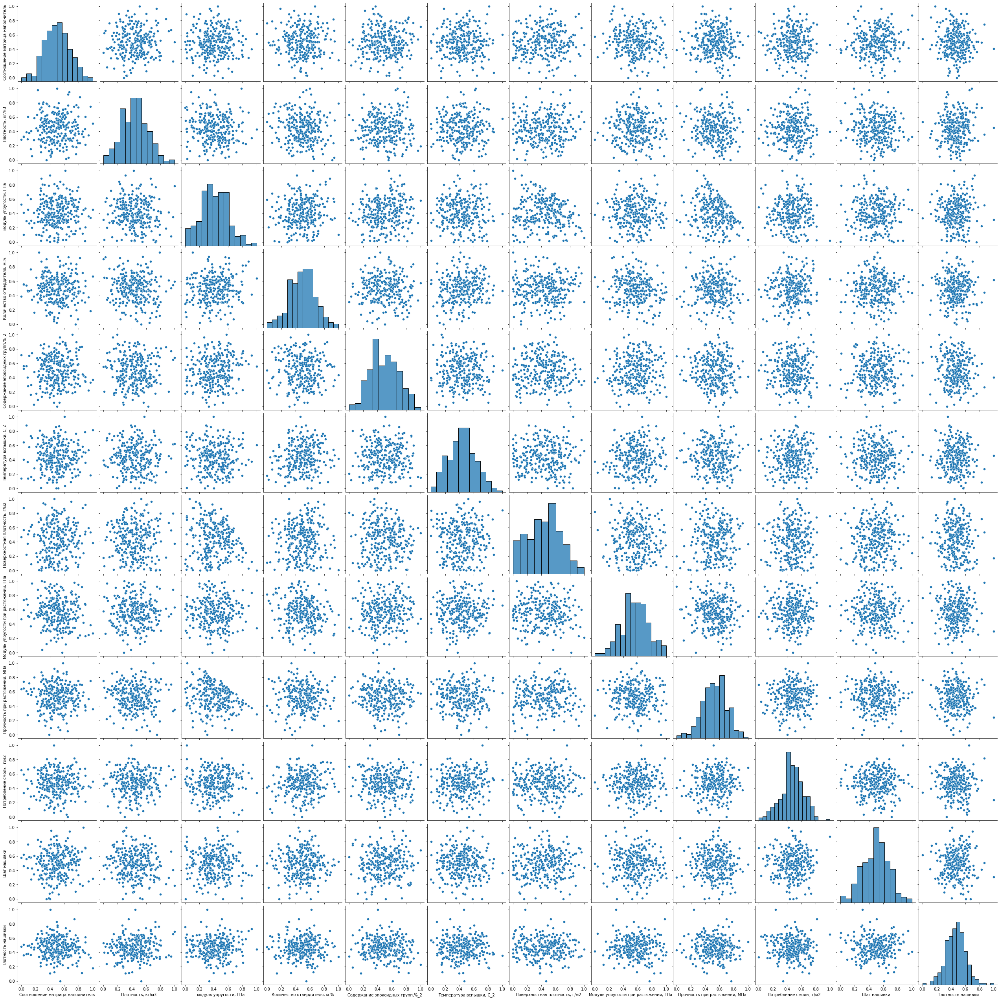

In [140]:
# Попарные графики рассеяния после нормализации
sns.pairplot(df_norm, height=3)

In [141]:
# Создание датасета df для моделей прогноза
df = df_norm.copy()

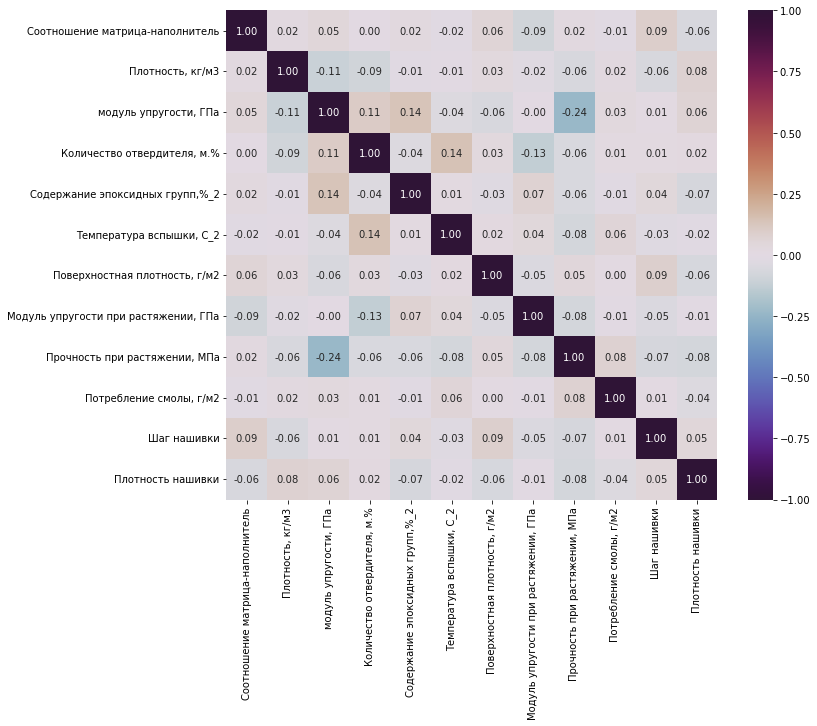

In [142]:
# Матрица корреляции по Спирмену после нормализации
corr = df_norm.corr(method = 'spearman') # Спирмен
fig, ax = plt.subplots(figsize=(11, 9))
sns.heatmap(corr, vmin=-1, vmax=1, annot=True, fmt='.2f', cmap='twilight_shifted', ax=ax)
plt.show()

In [143]:
# Параметр 'Угол нашивки, град' - категориальный, поэтому его исключаем 
# при построении матрицы корреляции по критерию Пирсона
df_dnorm=df_norm[['Соотношение матрица-наполнитель','Плотность, кг/м3','модуль упругости, ГПа','Количество отвердителя, м.%','Содержание эпоксидных групп,%_2','Температура вспышки, С_2','Поверхностная плотность, г/м2','Модуль упругости при растяжении, ГПа','Прочность при растяжении, МПа','Потребление смолы, г/м2','Шаг нашивки','Плотность нашивки']]
df_dnorm

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2",Шаг нашивки,Плотность нашивки
0,0.431332,0.240197,0.465542,0.502037,0.492423,0.432637,0.545340,0.668830,0.342093,0.211359,0.490109,0.356587
1,0.502464,0.448150,0.494493,0.609812,0.407128,0.500481,0.674706,0.566992,0.635958,0.479067,0.635104,0.503359
2,0.505463,0.578121,0.261134,0.609812,0.407128,0.500481,0.300984,0.363315,0.880016,0.479067,0.707601,0.356587
3,0.629027,0.188208,0.270784,0.609812,0.407128,0.500481,0.300984,0.363315,0.880016,0.479067,0.707601,0.469489
4,0.755430,0.370168,0.440101,0.609812,0.407128,0.500481,0.545340,0.668830,0.342093,0.211359,0.707601,0.503359
...,...,...,...,...,...,...,...,...,...,...,...,...
278,0.667143,0.524679,0.211617,0.581580,0.316196,0.428890,0.366093,0.353007,0.695722,0.491692,0.412633,0.424181
279,0.281517,0.665126,0.888769,0.877280,0.592137,0.400541,0.030408,0.651650,0.400675,0.612857,0.334372,0.702485
280,0.715208,0.411724,0.714371,0.418148,0.186255,0.512285,0.193442,0.684710,0.476477,0.585744,0.563647,0.448604
281,0.381472,0.321160,0.482220,0.407024,0.482252,0.124883,0.079975,0.860914,0.404541,0.123739,0.539650,0.534802


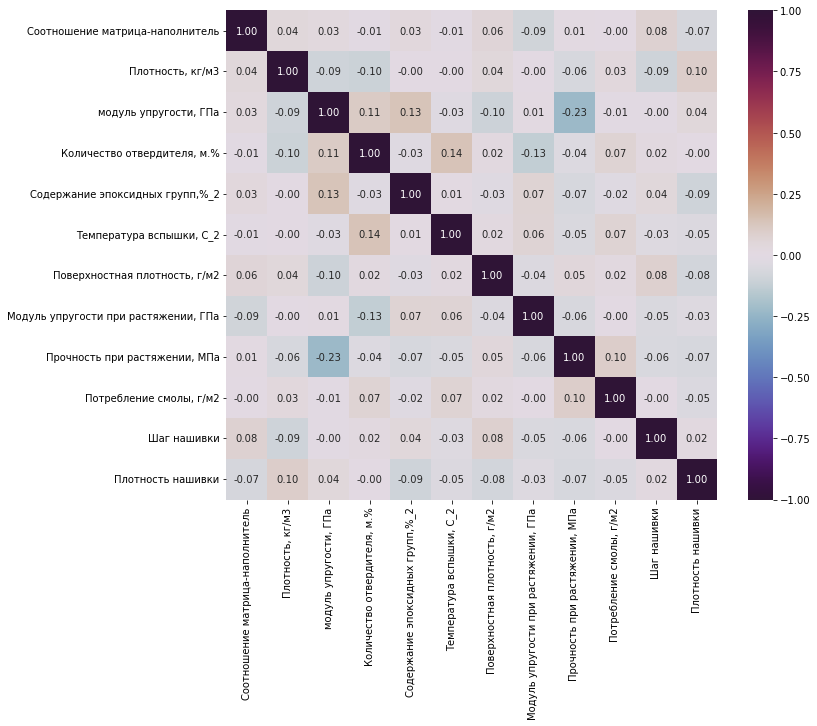

In [144]:
# Матрица корреляции по Пирсону после нормализации
corr = df_dnorm.corr() # Пирсон по умолчанию
fig, ax = plt.subplots(figsize=(11, 9))
sns.heatmap(corr, vmin=-1, vmax=1, annot=True, fmt='.2f', cmap='twilight_shifted', ax=ax)
plt.show()

#### 3. Модели для прогноза модуля упругости при растяжении и прочности при растяжении

In [145]:
# Загрузка модулей библиотеки sklearn для регрессоров и других библиотек
from sklearn.neighbors import KNeighborsRegressor
from sklearn.linear_model import LinearRegression, SGDRegressor
from sklearn.neural_network import MLPRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_absolute_error
from sklearn.model_selection import GridSearchCV, RandomizedSearchCV

###### Разбиение данных на обучающую и тестовую выборки

In [146]:
# Назначение переменных для создания моделей
x_upr = df.drop(['Модуль упругости при растяжении, ГПа'], axis=1)
x_pr = df.drop(['Прочность при растяжении, МПа'], axis=1)
y_upr = df[['Модуль упругости при растяжении, ГПа']]
y_pr = df[['Прочность при растяжении, МПа']]
# Разбиение данных на обучающую и тестовую выборки
X_train_upr, X_test_upr, y_train_upr, y_test_upr = train_test_split(x_upr, y_upr, test_size=0.3, random_state=5)
X_train_pr, X_test_pr, y_train_pr, y_test_pr = train_test_split(x_pr, y_pr, test_size=0.3, random_state=5)

###### Метод К ближайших соседей

In [147]:
# Регрессор KNeighborsRegressor() для расчета методом K-ближайших соседей,
# используются унифицированные веса и настройки алгоритма по умолчанию
knr = KNeighborsRegressor()
knr_params = {'n_neighbors' : range(1, 301, 2), 
          'weights' : ['uniform', 'distance'],
          'algorithm' : ['auto', 'ball_tree', 'kd_tree', 'brute']
          }
# используется поиск по сетке GridSearchCV для upr
GSCV_knr_upr = GridSearchCV(knr, knr_params, n_jobs=-1, cv=10)
GSCV_knr_upr.fit(X_train_upr, y_train_upr)
GSCV_knr_upr.best_params_

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_search.py:969: UserWarning: One or more of the test scores are non-finite: [-1.3052595  -1.3052595  -0.31767608 ...         nan         nan
         nan]
  warnings.warn(


{'algorithm': 'auto', 'n_neighbors': 55, 'weights': 'uniform'}

In [148]:
# Поиск по лучшей модели и вывод результатов для upr
knr_upr = GSCV_knr_upr.best_estimator_
print(f'R2-score KNR для модуля упругости при растяжении: {knr_upr.score(X_test_upr, y_test_upr).round(3)}')

R2-score KNR для модуля упругости при растяжении: -0.04


In [149]:
# Создание объекта pandas DataFrame()
models = pd.DataFrame()

In [150]:
# Запись результатов расчета в DataFrame()
knr_upr_result = pd.DataFrame({
   'Model': 'KNeighborsRegressor_upr', 
   'MAE': mean_absolute_error(y_test_upr, knr_upr.predict(X_test_upr)), 
   'R2 score': knr_upr.score(X_test_upr, y_test_upr).round(3)
}, index=['Модуль упругости при растяжении'])

In [151]:
# Соединение объектов DataFrame()
models = pd.concat([models, knr_upr_result])

In [152]:
# Вывод результатов в кросс-таблицу
models

,Model,MAE,R2 score
Модуль упругости при растяжении,KNeighborsRegressor_upr,0.13175,-0.04


Вывод: если коэффициент детерминации равен нулю, это значит, что модель прогнозирует данные с таким же результатом, как если бы берется среднее значение прогнозируемого параметра; если же коэффициент детерминации отрицательный, это значит, что модель прогнозирует данные с результатом хуже среднего значения прогнозируемого параметра, то есть разработанная модель жает прогноз даже хуже, чем простое усреднение

In [153]:
# Используется поиск по сетке GridSearchCV для pr
GSCV_knr_pr = GridSearchCV(knr, knr_params, n_jobs=-1, cv=10)
GSCV_knr_pr.fit(X_train_pr, y_train_pr)
GSCV_knr_pr.best_params_

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_search.py:969: UserWarning: One or more of the test scores are non-finite: [-1.09742382 -1.09742382 -0.51309531 ...         nan         nan
         nan]
  warnings.warn(


{'algorithm': 'auto', 'n_neighbors': 21, 'weights': 'uniform'}

In [154]:
# Поиск по лучшей модели и вывод результатов для pr
knr_pr = GSCV_knr_pr.best_estimator_
print(f'R2-score KNR для прочности при растяжении: {knr_pr.score(X_test_pr, y_test_pr).round(3)}')

R2-score KNR для прочности при растяжении: -0.061


In [155]:
# Запись результатов расчета в DataFrame()
knr_pr_result = pd.DataFrame({
   'Model': 'KNeighborsRegressor_pr', 
   'MAE': mean_absolute_error(y_test_pr, knr_pr.predict(X_test_pr)), 
   'R2 score': knr_pr.score(X_test_pr, y_test_pr).round(3)
}, index=['Прочность при растяжении'])

In [156]:
# Соединение объектов DataFrame()
models = pd.concat([models, knr_pr_result])

In [157]:
# Вывод результатов в кросс-таблицу
models

,Model,MAE,R2 score
Модуль упругости при растяжении,KNeighborsRegressor_upr,0.131750,-0.040
Прочность при растяжении,KNeighborsRegressor_pr,0.159666,-0.061


Вывод: если коэффициент детерминации равен нулю, это значит, что модель прогнозирует данные с таким же результатом, как если бы берется среднее значение прогнозируемого параметра; если же коэффициент детерминации отрицательный, это значит, что модель прогнозирует данные с результатом хуже среднего значения прогнозируемого параметра, то есть разработанная модель жает прогноз даже хуже, чем простое усреднение

###### Стохастический градиентный спуск

In [158]:
# Регрессор SGDRegressor() для расчета методом стохастического градиентного спуска,
# используются настройки алгоритма по умолчанию
sgd = SGDRegressor()
sgd_params = {'loss' : ['squared_error', 'huber', 'epsilon_insensitive', 'squared_epsilon_insensitive'], 
          'penalty' : ['elasticnet', 'l2', 'l1'],
          'alpha' : [0.0001, 0.001, 0.01, 0.0002, 0.002],
          'learning_rate' : ['optimal', 'invscaling', 'adaptive'],
          'epsilon' : [0.1, 0.01, 0.2, 0.02]
          }
# используется поиск по сетке GridSearchCV для upr
GSCV_sgd_upr = GridSearchCV(sgd, sgd_params, cv=10, verbose=0)
GSCV_sgd_upr.fit(X_train_upr, np.ravel(y_train_upr))
GSCV_sgd_upr.best_params_

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\_stochastic_gradient.py:1503: ConvergenceWarning: Maximum number of iteration reached before convergence. Consider increasing max_iter to improve the fit.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\_stochastic_gradient.py:1503: ConvergenceWarning: Maximum number of iteration reached before convergence. Consider increasing max_iter to improve the fit.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\_stochastic_gradient.py:1503: ConvergenceWarning: Maximum number of iteration reached before convergence. Consider increasing max_iter to improve the fit.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\_stochastic_gradient.py:1503: ConvergenceWarning: Maximum number of iteration reached before convergence. Consider increasing max_iter to improve the fit.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linea

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\_stochastic_gradient.py:1503: ConvergenceWarning: Maximum number of iteration reached before convergence. Consider increasing max_iter to improve the fit.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\_stochastic_gradient.py:1503: ConvergenceWarning: Maximum number of iteration reached before convergence. Consider increasing max_iter to improve the fit.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\_stochastic_gradient.py:1503: ConvergenceWarning: Maximum number of iteration reached before convergence. Consider increasing max_iter to improve the fit.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\_stochastic_gradient.py:1503: ConvergenceWarning: Maximum number of iteration reached before convergence. Consider increasing max_iter to improve the fit.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linea

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\_stochastic_gradient.py:1503: ConvergenceWarning: Maximum number of iteration reached before convergence. Consider increasing max_iter to improve the fit.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\_stochastic_gradient.py:1503: ConvergenceWarning: Maximum number of iteration reached before convergence. Consider increasing max_iter to improve the fit.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\_stochastic_gradient.py:1503: ConvergenceWarning: Maximum number of iteration reached before convergence. Consider increasing max_iter to improve the fit.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\_stochastic_gradient.py:1503: ConvergenceWarning: Maximum number of iteration reached before convergence. Consider increasing max_iter to improve the fit.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linea

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\_stochastic_gradient.py:1503: ConvergenceWarning: Maximum number of iteration reached before convergence. Consider increasing max_iter to improve the fit.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\_stochastic_gradient.py:1503: ConvergenceWarning: Maximum number of iteration reached before convergence. Consider increasing max_iter to improve the fit.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\_stochastic_gradient.py:1503: ConvergenceWarning: Maximum number of iteration reached before convergence. Consider increasing max_iter to improve the fit.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\_stochastic_gradient.py:1503: ConvergenceWarning: Maximum number of iteration reached before convergence. Consider increasing max_iter to improve the fit.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linea

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\_stochastic_gradient.py:1503: ConvergenceWarning: Maximum number of iteration reached before convergence. Consider increasing max_iter to improve the fit.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\_stochastic_gradient.py:1503: ConvergenceWarning: Maximum number of iteration reached before convergence. Consider increasing max_iter to improve the fit.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\_stochastic_gradient.py:1503: ConvergenceWarning: Maximum number of iteration reached before convergence. Consider increasing max_iter to improve the fit.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\_stochastic_gradient.py:1503: ConvergenceWarning: Maximum number of iteration reached before convergence. Consider increasing max_iter to improve the fit.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linea

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\_stochastic_gradient.py:1503: ConvergenceWarning: Maximum number of iteration reached before convergence. Consider increasing max_iter to improve the fit.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\_stochastic_gradient.py:1503: ConvergenceWarning: Maximum number of iteration reached before convergence. Consider increasing max_iter to improve the fit.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\_stochastic_gradient.py:1503: ConvergenceWarning: Maximum number of iteration reached before convergence. Consider increasing max_iter to improve the fit.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\_stochastic_gradient.py:1503: ConvergenceWarning: Maximum number of iteration reached before convergence. Consider increasing max_iter to improve the fit.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linea

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\_stochastic_gradient.py:1503: ConvergenceWarning: Maximum number of iteration reached before convergence. Consider increasing max_iter to improve the fit.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\_stochastic_gradient.py:1503: ConvergenceWarning: Maximum number of iteration reached before convergence. Consider increasing max_iter to improve the fit.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\_stochastic_gradient.py:1503: ConvergenceWarning: Maximum number of iteration reached before convergence. Consider increasing max_iter to improve the fit.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\_stochastic_gradient.py:1503: ConvergenceWarning: Maximum number of iteration reached before convergence. Consider increasing max_iter to improve the fit.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linea

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\_stochastic_gradient.py:1503: ConvergenceWarning: Maximum number of iteration reached before convergence. Consider increasing max_iter to improve the fit.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\_stochastic_gradient.py:1503: ConvergenceWarning: Maximum number of iteration reached before convergence. Consider increasing max_iter to improve the fit.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\_stochastic_gradient.py:1503: ConvergenceWarning: Maximum number of iteration reached before convergence. Consider increasing max_iter to improve the fit.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\_stochastic_gradient.py:1503: ConvergenceWarning: Maximum number of iteration reached before convergence. Consider increasing max_iter to improve the fit.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linea

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\_stochastic_gradient.py:1503: ConvergenceWarning: Maximum number of iteration reached before convergence. Consider increasing max_iter to improve the fit.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\_stochastic_gradient.py:1503: ConvergenceWarning: Maximum number of iteration reached before convergence. Consider increasing max_iter to improve the fit.
  warnings.warn(


{'alpha': 0.01,
 'epsilon': 0.02,
 'learning_rate': 'adaptive',
 'loss': 'epsilon_insensitive',
 'penalty': 'l1'}

In [159]:
# Поиск по лучшей модели и вывод результатов для upr
sgd_upr = GSCV_sgd_upr.best_estimator_
print(f'R2-score KNR для модуля упругости при растяжении: {sgd_upr.score(X_test_upr, y_test_upr).round(3)}')
print(mean_absolute_error(y_test_upr, sgd_upr.predict(X_test_upr)))

R2-score KNR для модуля упругости при растяжении: -0.037
0.1327945115355918


In [160]:
# Запись результатов расчета в DataFrame()
sgd_upr_result = pd.DataFrame({
   'Model': 'SGDRegressor_upr', 
   'MAE': mean_absolute_error(y_test_upr, sgd_upr.predict(X_test_upr)), 
   'R2 score': sgd_upr.score(X_test_upr, y_test_upr).round(3)
}, index=['Модуль упругости при растяжении'])

In [161]:
# Соединение объектов DataFrame()
models = pd.concat([models, sgd_upr_result])

In [162]:
# Вывод результатов в кросс-таблицу
models

,Model,MAE,R2 score
Модуль упругости при растяжении,KNeighborsRegressor_upr,0.131750,-0.040
Прочность при растяжении,KNeighborsRegressor_pr,0.159666,-0.061
Модуль упругости при растяжении,SGDRegressor_upr,0.132795,-0.037


Вывод: если коэффициент детерминации равен нулю, это значит, что модель прогнозирует данные с таким же результатом, как если бы берется среднее значение прогнозируемого параметра; если же коэффициент детерминации отрицательный, это значит, что модель прогнозирует данные с результатом хуже среднего значения прогнозируемого параметра, то есть разработанная модель жает прогноз даже хуже, чем простое усреднение

In [163]:
# Используется поиск по сетке GridSearchCV для pr
GSCV_sgd_pr = GridSearchCV(sgd, sgd_params, cv=10)
GSCV_sgd_pr.fit(X_train_pr, np.ravel(y_train_pr))
GSCV_sgd_pr.best_params_

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\_stochastic_gradient.py:1503: ConvergenceWarning: Maximum number of iteration reached before convergence. Consider increasing max_iter to improve the fit.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\_stochastic_gradient.py:1503: ConvergenceWarning: Maximum number of iteration reached before convergence. Consider increasing max_iter to improve the fit.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\_stochastic_gradient.py:1503: ConvergenceWarning: Maximum number of iteration reached before convergence. Consider increasing max_iter to improve the fit.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\_stochastic_gradient.py:1503: ConvergenceWarning: Maximum number of iteration reached before convergence. Consider increasing max_iter to improve the fit.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linea

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\_stochastic_gradient.py:1503: ConvergenceWarning: Maximum number of iteration reached before convergence. Consider increasing max_iter to improve the fit.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\_stochastic_gradient.py:1503: ConvergenceWarning: Maximum number of iteration reached before convergence. Consider increasing max_iter to improve the fit.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\_stochastic_gradient.py:1503: ConvergenceWarning: Maximum number of iteration reached before convergence. Consider increasing max_iter to improve the fit.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\_stochastic_gradient.py:1503: ConvergenceWarning: Maximum number of iteration reached before convergence. Consider increasing max_iter to improve the fit.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linea

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\_stochastic_gradient.py:1503: ConvergenceWarning: Maximum number of iteration reached before convergence. Consider increasing max_iter to improve the fit.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\_stochastic_gradient.py:1503: ConvergenceWarning: Maximum number of iteration reached before convergence. Consider increasing max_iter to improve the fit.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\_stochastic_gradient.py:1503: ConvergenceWarning: Maximum number of iteration reached before convergence. Consider increasing max_iter to improve the fit.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\_stochastic_gradient.py:1503: ConvergenceWarning: Maximum number of iteration reached before convergence. Consider increasing max_iter to improve the fit.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linea

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\_stochastic_gradient.py:1503: ConvergenceWarning: Maximum number of iteration reached before convergence. Consider increasing max_iter to improve the fit.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\_stochastic_gradient.py:1503: ConvergenceWarning: Maximum number of iteration reached before convergence. Consider increasing max_iter to improve the fit.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\_stochastic_gradient.py:1503: ConvergenceWarning: Maximum number of iteration reached before convergence. Consider increasing max_iter to improve the fit.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\_stochastic_gradient.py:1503: ConvergenceWarning: Maximum number of iteration reached before convergence. Consider increasing max_iter to improve the fit.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linea

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\_stochastic_gradient.py:1503: ConvergenceWarning: Maximum number of iteration reached before convergence. Consider increasing max_iter to improve the fit.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\_stochastic_gradient.py:1503: ConvergenceWarning: Maximum number of iteration reached before convergence. Consider increasing max_iter to improve the fit.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\_stochastic_gradient.py:1503: ConvergenceWarning: Maximum number of iteration reached before convergence. Consider increasing max_iter to improve the fit.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\_stochastic_gradient.py:1503: ConvergenceWarning: Maximum number of iteration reached before convergence. Consider increasing max_iter to improve the fit.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linea

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\_stochastic_gradient.py:1503: ConvergenceWarning: Maximum number of iteration reached before convergence. Consider increasing max_iter to improve the fit.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\_stochastic_gradient.py:1503: ConvergenceWarning: Maximum number of iteration reached before convergence. Consider increasing max_iter to improve the fit.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\_stochastic_gradient.py:1503: ConvergenceWarning: Maximum number of iteration reached before convergence. Consider increasing max_iter to improve the fit.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\_stochastic_gradient.py:1503: ConvergenceWarning: Maximum number of iteration reached before convergence. Consider increasing max_iter to improve the fit.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linea

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\_stochastic_gradient.py:1503: ConvergenceWarning: Maximum number of iteration reached before convergence. Consider increasing max_iter to improve the fit.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\_stochastic_gradient.py:1503: ConvergenceWarning: Maximum number of iteration reached before convergence. Consider increasing max_iter to improve the fit.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\_stochastic_gradient.py:1503: ConvergenceWarning: Maximum number of iteration reached before convergence. Consider increasing max_iter to improve the fit.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\_stochastic_gradient.py:1503: ConvergenceWarning: Maximum number of iteration reached before convergence. Consider increasing max_iter to improve the fit.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linea

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\_stochastic_gradient.py:1503: ConvergenceWarning: Maximum number of iteration reached before convergence. Consider increasing max_iter to improve the fit.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\_stochastic_gradient.py:1503: ConvergenceWarning: Maximum number of iteration reached before convergence. Consider increasing max_iter to improve the fit.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\_stochastic_gradient.py:1503: ConvergenceWarning: Maximum number of iteration reached before convergence. Consider increasing max_iter to improve the fit.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\_stochastic_gradient.py:1503: ConvergenceWarning: Maximum number of iteration reached before convergence. Consider increasing max_iter to improve the fit.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linea

{'alpha': 0.01,
 'epsilon': 0.2,
 'learning_rate': 'optimal',
 'loss': 'huber',
 'penalty': 'elasticnet'}

In [164]:
# Поиск по лучшей модели и вывод результатов для pr
sgd_pr = GSCV_sgd_pr.best_estimator_
print(f'R2-score KNR для модуля упругости при растяжении: {sgd_pr.score(X_test_pr, y_test_pr).round(3)}')
print(mean_absolute_error(y_test_pr, sgd_pr.predict(X_test_pr)))

R2-score KNR для модуля упругости при растяжении: -0.043
0.15835715863564487


In [165]:
# Запись результатов расчета в DataFrame()
sgd_pr_result = pd.DataFrame({
   'Model': 'SGDRegressor_pr', 
   'MAE': mean_absolute_error(y_test_pr, sgd_pr.predict(X_test_pr)), 
   'R2 score': sgd_pr.score(X_test_pr, y_test_pr).round(3)
}, index=['Прочность при растяжении'])

In [166]:
# Соединение объектов DataFrame()
models = pd.concat([models, sgd_pr_result])

In [167]:
# Вывод результатов в кросс-таблицу
models

,Model,MAE,R2 score
Модуль упругости при растяжении,KNeighborsRegressor_upr,0.131750,-0.040
Прочность при растяжении,KNeighborsRegressor_pr,0.159666,-0.061
Модуль упругости при растяжении,SGDRegressor_upr,0.132795,-0.037
Прочность при растяжении,SGDRegressor_pr,0.158357,-0.043


Вывод: если коэффициент детерминации равен нулю, это значит, что модель прогнозирует данные с таким же результатом, как если бы берется среднее значение прогнозируемого параметра; если же коэффициент детерминации отрицательный, это значит, что модель прогнозирует данные с результатом хуже среднего значения прогнозируемого параметра, то есть разработанная модель жает прогноз даже хуже, чем простое усреднение

###### Линейная регрессия

In [168]:
# Регрессор LinearRegression() для расчета методом линейной регрессии,
# используются настройки алгоритма по умолчанию
lr = LinearRegression()
lr_params = {
    'fit_intercept' : ['True', 'False']
}
# используется поиск по сетке GridSearchCV для upr
GSCV_lr_upr = GridSearchCV(lr, lr_params, n_jobs=-1, cv=10)
GSCV_lr_upr.fit(X_train_upr, y_train_upr)
GSCV_lr_upr.best_params_

{'fit_intercept': 'True'}

In [169]:
# Поиск по лучшей модели и вывод результатов для upr
lr_upr = GSCV_lr_upr.best_estimator_
print(f'R2-score LR для модуля упругости при растяжении: {lr_upr.score(X_test_upr, y_test_upr).round(3)}')

R2-score LR для модуля упругости при растяжении: -0.094


In [170]:
# Запись результатов расчета в DataFrame()
lr_upr_result = pd.DataFrame({
   'Model': 'LinearRegression_upr', 
   'MAE': mean_absolute_error(y_test_upr, lr_upr.predict(X_test_upr)), 
   'R2 score': lr_upr.score(X_test_upr, y_test_upr).round(3)
}, index=['Модуль упругости при растяжении'])

In [171]:
# Соединение объектов DataFrame()
models = pd.concat([models, lr_upr_result])

In [172]:
# Вывод результатов в кросс-таблицу
models

,Model,MAE,R2 score
Модуль упругости при растяжении,KNeighborsRegressor_upr,0.131750,-0.040
Прочность при растяжении,KNeighborsRegressor_pr,0.159666,-0.061
Модуль упругости при растяжении,SGDRegressor_upr,0.132795,-0.037
Прочность при растяжении,SGDRegressor_pr,0.158357,-0.043
Модуль упругости при растяжении,LinearRegression_upr,0.135513,-0.094


Вывод: если коэффициент детерминации равен нулю, это значит, что модель прогнозирует данные с таким же результатом, как если бы берется среднее значение прогнозируемого параметра; если же коэффициент детерминации отрицательный, это значит, что модель прогнозирует данные с результатом хуже среднего значения прогнозируемого параметра, то есть разработанная модель жает прогноз даже хуже, чем простое усреднение

In [173]:
# используется поиск по сетке GridSearchCV для pr
GSCV_lr_pr = GridSearchCV(lr, lr_params, n_jobs=-1, cv=10)
GSCV_lr_pr.fit(X_train_pr, y_train_pr)
GSCV_lr_pr.best_params_

{'fit_intercept': 'True'}

In [174]:
# Поиск по лучшей модели и вывод результатов для pr
lr_pr = GSCV_lr_pr.best_estimator_
print(f'R2-score LR для прочности при растяжении: {lr_pr.score(X_test_pr, y_test_pr).round(3)}')

R2-score LR для прочности при растяжении: -0.048


In [175]:
# Запись результатов расчета в DataFrame()
lr_pr_result = pd.DataFrame({
   'Model': 'LinearRegression_pr', 
   'MAE': mean_absolute_error(y_test_pr, lr_pr.predict(X_test_pr)), 
   'R2 score': lr_pr.score(X_test_pr, y_test_pr).round(3)
}, index=['Прочность при растяжении'])

In [176]:
# Соединение объектов DataFrame()
models = pd.concat([models, lr_pr_result])

In [177]:
# Вывод результатов в кросс-таблицу
models

,Model,MAE,R2 score
Модуль упругости при растяжении,KNeighborsRegressor_upr,0.131750,-0.040
Прочность при растяжении,KNeighborsRegressor_pr,0.159666,-0.061
Модуль упругости при растяжении,SGDRegressor_upr,0.132795,-0.037
Прочность при растяжении,SGDRegressor_pr,0.158357,-0.043
Модуль упругости при растяжении,LinearRegression_upr,0.135513,-0.094
Прочность при растяжении,LinearRegression_pr,0.157292,-0.048


Вывод: если коэффициент детерминации равен нулю, это значит, что модель прогнозирует данные с таким же результатом, как если бы берется среднее значение прогнозируемого параметра; если же коэффициент детерминации отрицательный, это значит, что модель прогнозирует данные с результатом хуже среднего значения прогнозируемого параметра, то есть разработанная модель дает прогноз даже хуже, чем простое усреднение

###### Случайный лес

In [178]:
# Регрессор RandomForestRegressor() для расчета методом случайного леса
# испальзуются настройки алгоритма по умолчанию
rfr = RandomForestRegressor()
rfr_params = {
    'n_estimators' : range(10, 1000, 10),
    'criterion' : ['squared_error', 'absolute_error', 'poisson'],
    'max_depth' : range(1, 7),
    'min_samples_split' : range(20, 50, 5),
    'min_samples_leaf' : range(2, 8),
    'bootstrap' : ['True', 'False']
}
# Используется поиск по RandomizedSearchCV для upr
RSCV_rfr_upr = RandomizedSearchCV(rfr, rfr_params, n_jobs=-1, cv=10, verbose=4)
RSCV_rfr_upr.fit(X_train_upr, np.ravel(y_train_upr))
RSCV_rfr_upr.best_params_

Fitting 10 folds for each of 10 candidates, totalling 100 fits


{'n_estimators': 330,
 'min_samples_split': 40,
 'min_samples_leaf': 4,
 'max_depth': 3,
 'criterion': 'absolute_error',
 'bootstrap': 'False'}

In [179]:
# Поиск по лучшей модели и вывод результатов для upr
rfr_upr = RSCV_rfr_upr.best_estimator_
print(f'R2-score RFR для модуля упругости при растяжении: {rfr_upr.score(X_test_upr, y_test_upr).round(3)}')

R2-score RFR для модуля упругости при растяжении: -0.045


In [180]:
# Запись результатов расчета в DataFrame()
rfr_upr_result = pd.DataFrame({
   'Model': 'RandomForestRegressor_upr', 
   'MAE': mean_absolute_error(y_test_upr, rfr_upr.predict(X_test_upr)), 
   'R2 score': rfr_upr.score(X_test_upr, y_test_upr).round(3)
}, index=['Модуль упругости при растяжении'])

In [181]:
# Соединение объектов DataFrame()
models = pd.concat([models, rfr_upr_result])

In [182]:
# Вывод результатов в кросс-таблицу
models

,Model,MAE,R2 score
Модуль упругости при растяжении,KNeighborsRegressor_upr,0.131750,-0.040
Прочность при растяжении,KNeighborsRegressor_pr,0.159666,-0.061
Модуль упругости при растяжении,SGDRegressor_upr,0.132795,-0.037
Прочность при растяжении,SGDRegressor_pr,0.158357,-0.043
Модуль упругости при растяжении,LinearRegression_upr,0.135513,-0.094
Прочность при растяжении,LinearRegression_pr,0.157292,-0.048
Модуль упругости при растяжении,RandomForestRegressor_upr,0.133901,-0.045


Вывод: если коэффициент детерминации равен нулю, это значит, что модель прогнозирует данные с таким же результатом, как если бы берется среднее значение прогнозируемого параметра; если же коэффициент детерминации отрицательный, это значит, что модель прогнозирует данные с результатом хуже среднего значения прогнозируемого параметра, то есть разработанная модель дает прогноз даже хуже, чем простое усреднение

In [183]:
# Используется поиск по RandomizedSearchCV() для pr
RSCV_rfr_pr = RandomizedSearchCV(rfr, rfr_params, n_jobs=-1, cv=10, verbose=4)
RSCV_rfr_pr.fit(X_train_pr, np.ravel(y_train_pr))
RSCV_rfr_pr.best_params_

Fitting 10 folds for each of 10 candidates, totalling 100 fits


{'n_estimators': 610,
 'min_samples_split': 35,
 'min_samples_leaf': 3,
 'max_depth': 1,
 'criterion': 'poisson',
 'bootstrap': 'False'}

In [184]:
# Поиск по лучшей модели и вывод результатов для pr
rfr_pr = RSCV_rfr_pr.best_estimator_
print(f'R2-score RFR для прочности при растяжении: {rfr_pr.score(X_test_pr, y_test_pr).round(3)}')

R2-score RFR для прочности при растяжении: -0.091


In [185]:
# Запись результатов расчета в DataFrame()
rfr_pr_result = pd.DataFrame({
   'Model': 'RandomForestRegressor_pr', 
   'MAE': mean_absolute_error(y_test_pr, rfr_pr.predict(X_test_pr)), 
   'R2 score': rfr_pr.score(X_test_pr, y_test_pr).round(3)
}, index=['Прочность при растяжении'])

In [186]:
# Соединение объектов DataFrame()
models = pd.concat([models, rfr_pr_result])

In [187]:
# Вывод результатов в кросс-таблицу
models 

,Model,MAE,R2 score
Модуль упругости при растяжении,KNeighborsRegressor_upr,0.131750,-0.040
Прочность при растяжении,KNeighborsRegressor_pr,0.159666,-0.061
Модуль упругости при растяжении,SGDRegressor_upr,0.132795,-0.037
Прочность при растяжении,SGDRegressor_pr,0.158357,-0.043
Модуль упругости при растяжении,LinearRegression_upr,0.135513,-0.094
Прочность при растяжении,LinearRegression_pr,0.157292,-0.048
Модуль упругости при растяжении,RandomForestRegressor_upr,0.133901,-0.045
Прочность при растяжении,RandomForestRegressor_pr,0.162947,-0.091


Вывод: если коэффициент детерминации равен нулю, это значит, что модель прогнозирует данные с таким же результатом, как если бы берется среднее значение прогнозируемого параметра; если же коэффициент детерминации отрицательный, это значит, что модель прогнозирует данные с результатом хуже среднего значения прогнозируемого параметра, то есть разработанная модель жает прогноз даже хуже, чем простое усреднение

###### Многослойный перцептрон

In [189]:
# Регрессор MLPRegressor() для расчета с помощью создания многослойного перцептрона
# используются настройки алгоритма
mlpr = MLPRegressor(random_state=5)
mlpr_params = {
    'hidden_layer_sizes' : [(64, 32, 12), (12, 12, 12, 12, 12),
                            (32, 32, 16, 8), (16, 16, 8)],
    'activation' : ['identity', 'logistic', 'tanh', 'relu'],
    'solver' : ['sgd', 'adam'],
    'max_iter' : [300],
    'learning_rate' : ['constant', 'adaptive', 'invscaling']
}

In [190]:
# используется поиск по сетке GridSearchCV для upr
GSCV_mlpr_upr = GridSearchCV(mlpr, mlpr_params, n_jobs=-1, cv=10)
GSCV_mlpr_upr.fit(X_train_upr, np.ravel(y_train_upr))
GSCV_mlpr_upr.best_params_

{'activation': 'logistic',
 'hidden_layer_sizes': (12, 12, 12, 12, 12),
 'learning_rate': 'constant',
 'max_iter': 300,
 'solver': 'sgd'}

In [191]:
# Поиск по лучшей модели и вывод результатов для upr
mlpr_upr = GSCV_mlpr_upr.best_estimator_
print(f'R2-score MLPR для модуля упругости при растяжении: {mlpr_upr.score(X_test_upr, y_test_upr).round(3)}')

R2-score MLPR для модуля упругости при растяжении: -0.016


In [192]:
# Запись результатов расчета в DataFrame()
mlpr_upr_result = pd.DataFrame({
   'Model': 'MLPRegressor_upr', 
   'MAE': mean_absolute_error(y_test_upr, mlpr_upr.predict(X_test_upr)), 
   'R2 score': mlpr_upr.score(X_test_upr, y_test_upr).round(3)
}, index=['Модуль упругости при растяжении'])

In [193]:
# Соединение объектов DataFrame()
models = pd.concat([models, mlpr_upr_result])
# Вывод результатов в кросс-таблицу
models

,Model,MAE,R2 score
Модуль упругости при растяжении,KNeighborsRegressor_upr,0.131750,-0.040
Прочность при растяжении,KNeighborsRegressor_pr,0.159666,-0.061
Модуль упругости при растяжении,SGDRegressor_upr,0.132795,-0.037
Прочность при растяжении,SGDRegressor_pr,0.158357,-0.043
Модуль упругости при растяжении,LinearRegression_upr,0.135513,-0.094
Прочность при растяжении,LinearRegression_pr,0.157292,-0.048
Модуль упругости при растяжении,RandomForestRegressor_upr,0.133901,-0.045
Прочность при растяжении,RandomForestRegressor_pr,0.162947,-0.091
Модуль упругости при растяжении,MLPRegressor_upr,0.132132,-0.016


Вывод: если коэффициент детерминации равен нулю, это значит, что модель прогнозирует данные с таким же результатом, как если бы берется среднее значение прогнозируемого параметра; если же коэффициент детерминации отрицательный, это значит, что модель прогнозирует данные с результатом хуже среднего значения прогнозируемого параметра, то есть разработанная модель жает прогноз даже хуже, чем простое усреднение

In [194]:
# используется поиск по сетке GridSearchCV для pr
GSCV_mlpr_pr = GridSearchCV(mlpr, mlpr_params, n_jobs=-1, cv=10)
GSCV_mlpr_pr.fit(X_train_pr, np.ravel(y_train_pr))
GSCV_mlpr_pr.best_params_

{'activation': 'logistic',
 'hidden_layer_sizes': (32, 32, 16, 8),
 'learning_rate': 'adaptive',
 'max_iter': 300,
 'solver': 'sgd'}

In [195]:
# Поиск по лучшей модели и вывод результатов для pr
mlpr_pr = GSCV_mlpr_pr.best_estimator_
print(f'R2-score MLPR для прочности при растяжении: {mlpr_pr.score(X_test_pr, y_test_pr).round(3)}')

R2-score MLPR для прочности при растяжении: -0.044


In [196]:
# Запись результатов расчета в DataFrame()
mlpr_pr_result = pd.DataFrame({
   'Model': 'MLPRegressor_pr', 
   'MAE': mean_absolute_error(y_test_pr, mlpr_pr.predict(X_test_pr)), 
   'R2 score': mlpr_pr.score(X_test_pr, y_test_pr).round(3)
}, index=['Прочность при растяжении'])

In [197]:
# Соединение объектов DataFrame()
models = pd.concat([models, mlpr_pr_result])
# Вывод результатов в кросс-таблицу
models

,Model,MAE,R2 score
Модуль упругости при растяжении,KNeighborsRegressor_upr,0.131750,-0.040
Прочность при растяжении,KNeighborsRegressor_pr,0.159666,-0.061
Модуль упругости при растяжении,SGDRegressor_upr,0.132795,-0.037
Прочность при растяжении,SGDRegressor_pr,0.158357,-0.043
Модуль упругости при растяжении,LinearRegression_upr,0.135513,-0.094
Прочность при растяжении,LinearRegression_pr,0.157292,-0.048
Модуль упругости при растяжении,RandomForestRegressor_upr,0.133901,-0.045
Прочность при растяжении,RandomForestRegressor_pr,0.162947,-0.091
Модуль упругости при растяжении,MLPRegressor_upr,0.132132,-0.016
Прочность при растяжении,MLPRegressor_pr,0.158039,-0.044


In [198]:
# Сортировка кросс- таблицы и вывод результатов
models_sort = models.sort_values(by=['MAE', 'R2 score'])
models_sort

,Model,MAE,R2 score
Модуль упругости при растяжении,KNeighborsRegressor_upr,0.131750,-0.040
Модуль упругости при растяжении,MLPRegressor_upr,0.132132,-0.016
Модуль упругости при растяжении,SGDRegressor_upr,0.132795,-0.037
Модуль упругости при растяжении,RandomForestRegressor_upr,0.133901,-0.045
Модуль упругости при растяжении,LinearRegression_upr,0.135513,-0.094
Прочность при растяжении,LinearRegression_pr,0.157292,-0.048
Прочность при растяжении,MLPRegressor_pr,0.158039,-0.044
Прочность при растяжении,SGDRegressor_pr,0.158357,-0.043
Прочность при растяжении,KNeighborsRegressor_pr,0.159666,-0.061
Прочность при растяжении,RandomForestRegressor_pr,0.162947,-0.091


Вывод: если коэффициент детерминации равен нулю, это значит, что модель прогнозирует данные с таким же результатом, как если бы берется среднее значение прогнозируемого параметра; если же коэффициент детерминации отрицательный, это значит, что модель прогнозирует данные с результатом хуже среднего значения прогнозируемого параметра, то есть разработанная модель дает прогноз даже хуже, чем простое усреднение

###### Графики ошибок моделей

Text(0.5, 1.0, 'Средняя абсолютная ошибка моделей прогноза Модуля упругости при растяжении, ГПа')

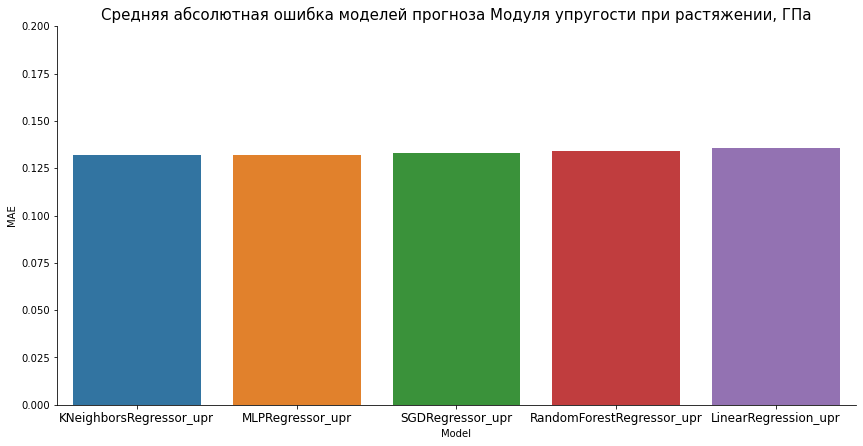

In [199]:
# Создание графика для средней абсолютной ошибки моделей прогноза параметра 'Модуля упругости при растяжении, ГПа'
sns.catplot(data=models_sort[0:5], x='Model', y='MAE', kind='bar', height=6, aspect=2)
plt.ylim(ymin=0, ymax=0.2)
plt.xticks(size=12)
plt.title('Средняя абсолютная ошибка моделей прогноза Модуля упругости при растяжении, ГПа', size=15)

Text(0.5, 1.0, 'Средняя абсолютная ошибка моделей прогноза Прочности при растяжении, МПа')

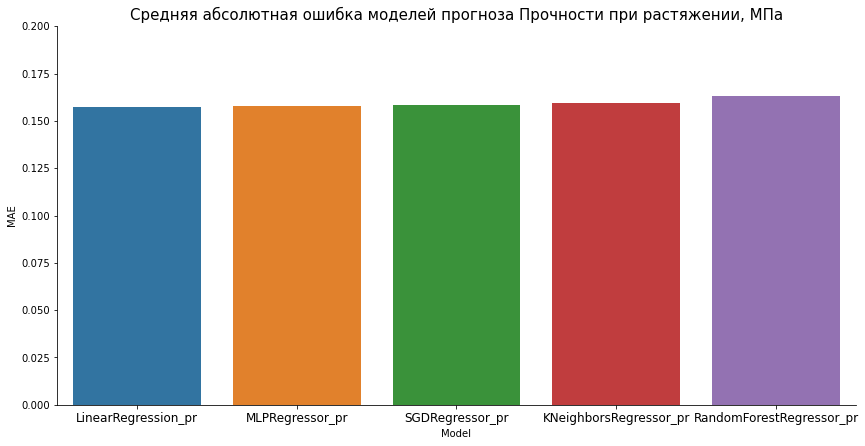

In [200]:
# Создание графика для средней абсолютной ошибки моделей прогноза параметра 'Прочности при растяжении, МПа'
sns.catplot(data=models_sort[5:10], x='Model', y='MAE', kind='bar', height=6, aspect=2)
plt.ylim(ymin=0, ymax=0.2)
plt.xticks(size=12)
plt.title('Средняя абсолютная ошибка моделей прогноза Прочности при растяжении, МПа', size=15)

Вывод: средние ошибки моделей прогноза примерно одинаковые

###### Построение нейронной сети на Keras

In [201]:
# Загрузка библиотеки tensorflow
import tensorflow as tf
# Загрузка модуля keras библиотеки tensorflow
from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras import Sequential
from tensorflow.keras.layers import Dense, BatchNormalization, LeakyReLU, Activation, Dropout, LSTM
from keras.callbacks import EarlyStopping, ModelCheckpoint
# Вывод версии библиотеки tensorflow
print(tf.__version__)

2.11.0


- Нейронная сеть для прогноза параметра Модуль упругости при растяжении

In [202]:
# Создание слоя, который выполняет нормализацию входных объектов
normalizer = tf.keras.layers.Normalization(axis=-1)

In [203]:
# Получение данных в слой
X_train_upr_norm = normalizer.adapt(np.array(X_train_upr))

In [204]:
# Вид модели - коллекция, стек слоев
model_upr = Sequential(X_train_upr_norm)
# Добавление слоев в модель
model_upr.add(Dense(128))
model_upr.add(BatchNormalization())
model_upr.add(LeakyReLU())
model_upr.add(Dense(64))
model_upr.add(BatchNormalization())
model_upr.add(LeakyReLU())
model_upr.add(Dense(64))
model_upr.add(BatchNormalization())
model_upr.add(LeakyReLU())
model_upr.add(Dense(32))
model_upr.add(BatchNormalization())
model_upr.add(LeakyReLU())
model_upr.add(Dense(32))
model_upr.add(BatchNormalization())
model_upr.add(LeakyReLU())
model_upr.add(Dense(1))
model_upr.add(Activation(activation='elu'))

In [205]:
# Определение процедуры обучения: передача SGD (Стохастический оптимизатор градиентного спуска,
# включает в себя поддержку импульса, затухания скорости обучения и импульсак Нестеровка),
# минимизация по 'mean_absolute_error'
model_upr.compile(
    optimizer=tf.optimizers.SGD(learning_rate=0.01, momentum=0.9, nesterov=False),
    loss='mean_absolute_error')

In [206]:
%%time
# Создание экземпляра и запуск обучения через метод fit()
history_upr = model_upr.fit(
    X_train_upr,
    y_train_upr,
    batch_size = 64,
    epochs=40,
    verbose=1,
    validation_split = 0.2
    )

Epoch 1/40
3/3 [==============================] - 2s 127ms/step - loss: 0.6191 - val_loss: 0.6127
Epoch 2/40
3/3 [==============================] - 0s 15ms/step - loss: 0.4531 - val_loss: 0.5442
Epoch 3/40
3/3 [==============================] - 0s 15ms/step - loss: 0.3343 - val_loss: 0.4562
Epoch 4/40
3/3 [==============================] - 0s 14ms/step - loss: 0.2824 - val_loss: 0.4003
Epoch 5/40
3/3 [==============================] - 0s 15ms/step - loss: 0.2447 - val_loss: 0.3789
Epoch 6/40
3/3 [==============================] - 0s 16ms/step - loss: 0.1892 - val_loss: 0.3852
Epoch 7/40
3/3 [==============================] - 0s 19ms/step - loss: 0.1786 - val_loss: 0.3948
Epoch 8/40
3/3 [==============================] - 0s 15ms/step - loss: 0.1615 - val_loss: 0.3960
Epoch 9/40
3/3 [==============================] - 0s 15ms/step - loss: 0.1575 - val_loss: 0.3758
Epoch 10/40
3/3 [==============================] - 0s 15ms/step - loss: 0.1327 - val_loss: 0.3667
Epoch 11/40
3/3 [===========

In [207]:
# Вывод архитектуры сети для upr
model_upr.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense (Dense)               (None, 128)               1536      
                                                                 
 batch_normalization (BatchN  (None, 128)              512       
 ormalization)                                                   
                                                                 
 leaky_re_lu (LeakyReLU)     (None, 128)               0         
                                                                 
 dense_1 (Dense)             (None, 64)                8256      
                                                                 
 batch_normalization_1 (Batc  (None, 64)               256       
 hNormalization)                                                 
                                                                 
 leaky_re_lu_1 (LeakyReLU)   (None, 64)                0

In [208]:
#Функция для построения графика потерь модели на тренировочной и тестовой выборках
def model_loss_plot(model_history):
    plt.figure(figsize=(10, 5))
    plt.plot(model_history.history['loss'])
    plt.plot(model_history.history['val_loss'])
    plt.title('График потерь модели', size=12)
    plt.ylabel('Средняя абсолютная ошибка', size=12)
    plt.xlabel('Эпоха', size=12)
    plt.legend(['loss', 'val_loss'], loc='best')
    plt.show()

#Функция для построения графика оригинального и предсказанного значения у
def actual_and_predicted_plot(original_y, predicted_y):    
    plt.figure(figsize=(10,5))
    plt.title('Тестовые и прогнозные значения', size=12)
    plt.plot(original_y, color='blue', label = 'Тестовые значения')
    plt.plot(predicted_y, color='red', label = 'Прогнозные значения')
    plt.legend(loc='best')
    plt.show()

#Функция для построения точечного графика оригинального и предсказанного значения у   
def actual_and_predicted_scatter(original_y, predicted_y):
    plt.figure(figsize=(10,5))
    plt.title('Рассеяние тестовых и прогнозных значений', size=15)
    plt.scatter(original_y, predicted_y)
    plt.xlabel('Тестовые значения', size=12)
    plt.ylabel('Прогнозные значения', size=12)
    plt.show()

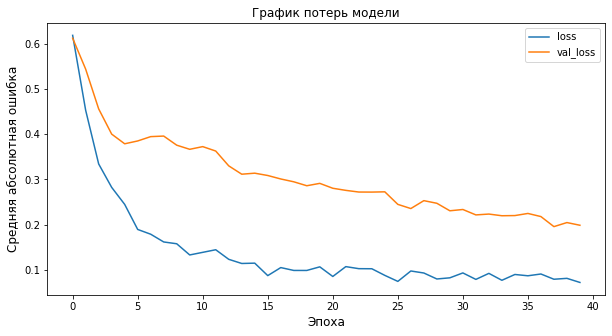

In [209]:
# Построение графика потерь модели
model_loss_plot(history_upr)

3/3 [==============================] - 0s 2ms/step


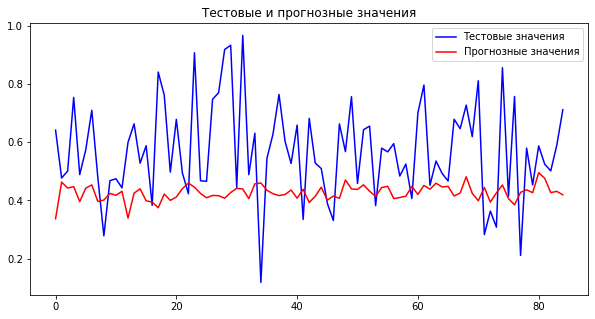

In [210]:
# Построение графика оригинального и прогнозного значения y
pred_upr = model_upr.predict(np.array((X_test_upr)))
original_upr = y_test_upr.values
predicted_upr = pred_upr

actual_and_predicted_plot(original_upr, predicted_upr)

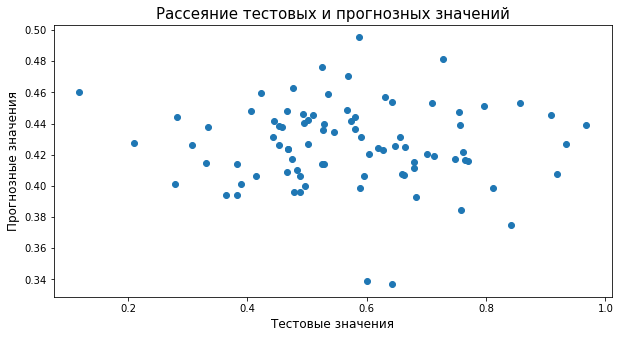

In [211]:
# Построение точечного графика рассеяния тестового и прогнозного значения y
actual_and_predicted_scatter(original_upr, predicted_upr)

In [212]:
# Вывод результата ошибки модели прогноза y
print(f'Model MAE: {model_upr.evaluate(X_test_upr, y_test_upr, verbose=1)}')

3/3 [==============================] - 0s 2ms/step - loss: 0.1749
Model MAE: 0.17490029335021973


In [213]:
# Вывод результата средней абсолютной ошибки модели прогноза y
print(f'MAE среднего значения: {np.mean(np.abs(y_test_upr-np.mean(y_test_upr)))}')

MAE среднего значения: Модуль упругости при растяжении, ГПа    0.132017
dtype: float64


C:\ProgramData\Anaconda3\lib\site-packages\numpy\core\fromnumeric.py:3438: FutureWarning: In a future version, DataFrame.mean(axis=None) will return a scalar mean over the entire DataFrame. To retain the old behavior, use 'frame.mean(axis=0)' or just 'frame.mean()'
  return mean(axis=axis, dtype=dtype, out=out, **kwargs)


- Нейронная сеть для прогноза параметра Прочность при растяжении

In [214]:
# Получение данных в слой, который выполняет нормализацию входных объектов
X_train_pr_norm = normalizer.adapt(np.array(X_train_pr))

In [215]:
# Вид модели - коллекция, стек слоев
model_pr = Sequential(X_train_pr_norm)
# Добавление слоев в модель
model_pr.add(Dense(128))
model_pr.add(BatchNormalization())
model_pr.add(LeakyReLU())
model_pr.add(Dense(64))
model_pr.add(BatchNormalization())
model_pr.add(LeakyReLU())
model_pr.add(Dense(64))
model_pr.add(BatchNormalization())
model_pr.add(LeakyReLU())
model_pr.add(Dense(32))
model_pr.add(BatchNormalization())
model_pr.add(LeakyReLU())
model_pr.add(Dense(1))
model_pr.add(Activation('selu'))

In [216]:
# Остановка обучения, когда контролируемая метрика перестает улучшаться
early_pr = EarlyStopping(monitor='val_loss', min_delta=0, patience=20, verbose=1, mode='auto')

In [217]:
# Определение процедуры обучения: передача SGD (Стохастический оптимизатор градиентного спуска,
# включает в себя поддержку импульса, затухания скорости обучения и импульсак Нестеровка),
# минимизация по 'mean_absolute_error'
model_pr.compile(
    optimizer=tf.optimizers.SGD(learning_rate=0.01),
    loss='mean_absolute_error'
    )

In [218]:
%%time
# Создание экземпляра и запуск обучения через метод fit()
history_pr = model_pr.fit(
    X_train_pr,
    y_train_pr,
    batch_size = 32,
    epochs=300,
    verbose=1,
    validation_split = 0.2,
    callbacks=[early_pr])

Epoch 1/300
5/5 [==============================] - 2s 61ms/step - loss: 0.7054 - val_loss: 0.5609
Epoch 2/300
5/5 [==============================] - 0s 9ms/step - loss: 0.4391 - val_loss: 0.4699
Epoch 3/300
5/5 [==============================] - 0s 8ms/step - loss: 0.3718 - val_loss: 0.4450
Epoch 4/300
5/5 [==============================] - 0s 8ms/step - loss: 0.3304 - val_loss: 0.4226
Epoch 5/300
5/5 [==============================] - 0s 9ms/step - loss: 0.3052 - val_loss: 0.3944
Epoch 6/300
5/5 [==============================] - 0s 8ms/step - loss: 0.2637 - val_loss: 0.3808
Epoch 7/300
5/5 [==============================] - 0s 8ms/step - loss: 0.2404 - val_loss: 0.3711
Epoch 8/300
5/5 [==============================] - 0s 9ms/step - loss: 0.2205 - val_loss: 0.3631
Epoch 9/300
5/5 [==============================] - 0s 9ms/step - loss: 0.1982 - val_loss: 0.3563
Epoch 10/300
5/5 [==============================] - 0s 9ms/step - loss: 0.2129 - val_loss: 0.3481
Epoch 11/300
5/5 [==========

In [219]:
# Вывод архитектуры сети для pr
model_pr.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_6 (Dense)             (None, 128)               1536      
                                                                 
 batch_normalization_5 (Batc  (None, 128)              512       
 hNormalization)                                                 
                                                                 
 leaky_re_lu_5 (LeakyReLU)   (None, 128)               0         
                                                                 
 dense_7 (Dense)             (None, 64)                8256      
                                                                 
 batch_normalization_6 (Batc  (None, 64)               256       
 hNormalization)                                                 
                                                                 
 leaky_re_lu_6 (LeakyReLU)   (None, 64)               

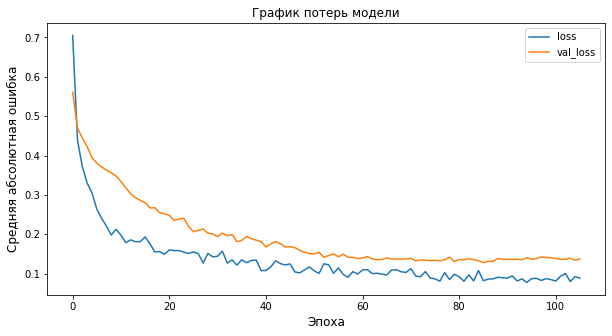

In [220]:
# Построение графика потерь модели
model_loss_plot(history_pr)

3/3 [==============================] - 0s 1ms/step


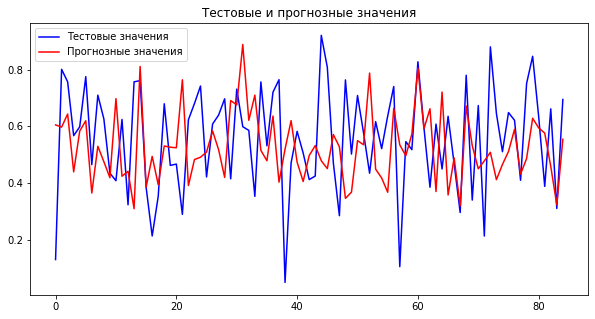

In [221]:
# Построение графика оригинального и прогнозного значения y
pred_pr = model_pr.predict(np.array((X_test_pr)))
original_pr = y_test_pr.values
predicted_pr = pred_pr

actual_and_predicted_plot(original_pr, predicted_pr)

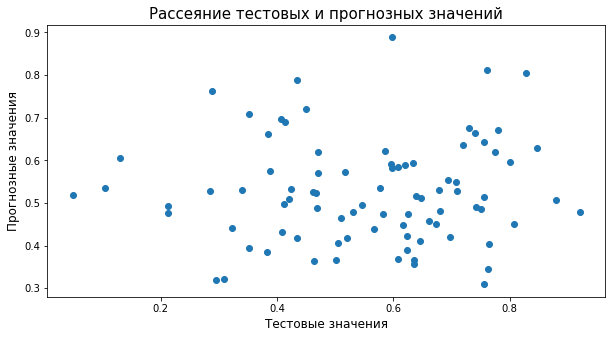

In [222]:
# Построение точечного графика рассеяния тестового и прогнозного значения y
actual_and_predicted_scatter(original_pr, predicted_pr)

In [223]:
# Вывод результата ошибки модели прогноза y
print(f'Model MAE: {model_pr.evaluate(X_test_pr, y_test_pr)}')

3/3 [==============================] - 0s 2ms/step - loss: 0.1755
Model MAE: 0.1755199134349823


In [224]:
# Вывод результата средней абсолютной ошибки модели прогноза y
print(f'MAE среднего значения: {np.mean(np.abs(y_test_pr-np.mean(y_test_pr)))}')

MAE среднего значения: Прочность при растяжении, МПа    0.152869
dtype: float64


C:\ProgramData\Anaconda3\lib\site-packages\numpy\core\fromnumeric.py:3438: FutureWarning: In a future version, DataFrame.mean(axis=None) will return a scalar mean over the entire DataFrame. To retain the old behavior, use 'frame.mean(axis=0)' or just 'frame.mean()'
  return mean(axis=axis, dtype=dtype, out=out, **kwargs)


- Нейронная сеть для предсказания параметра Соотношение матрица-наполнитель

In [225]:
# Назначение переменных для создания модели
x_mn = df.drop(['Соотношение матрица-наполнитель'], axis=1)
y_mn = df[['Соотношение матрица-наполнитель']]
# Разбиение данных на обучающую и тестовую выборки
X_train_mn, X_test_mn, y_train_mn, y_test_mn = train_test_split(x_mn, y_mn, test_size=0.3, random_state=5)

In [226]:
# Получение данных в слой, который выполняет нормализацию входных объектов
X_train_mn_norm = normalizer.adapt(np.array(X_train_mn))

In [227]:
# Вид модели - коллекция, стек слоев
model_mn = Sequential(X_train_mn_norm)
# Добавление слоев в модель
model_mn.add(Dense(128))
model_mn.add(BatchNormalization())
model_mn.add(LeakyReLU())
model_mn.add(Dense(128, activation='selu'))
model_mn.add(BatchNormalization())
model_mn.add(Dense(64, activation='selu'))
model_mn.add(BatchNormalization())
model_mn.add(Dense(32, activation='selu'))
model_mn.add(BatchNormalization())
model_mn.add(LeakyReLU())
model_mn.add(Dense(16, activation='selu'))
model_mn.add(BatchNormalization())
model_mn.add(Dense(1))
model_mn.add(Activation('selu'))

In [228]:
# Остановка обучения, когда контролируемая метрика перестает улучшаться
early_mn = EarlyStopping(monitor='val_loss', min_delta=0, patience=10, verbose=1, mode='auto')

In [229]:
# Определение процедуры обучения: передача SGD (Стохастический оптимизатор градиентного спуска,
# включает в себя поддержку импульса, затухания скорости обучения и импульсак Нестеровка),
# минимизация по 'mean_absolute_error'
model_mn.compile(
    optimizer=tf.optimizers.SGD(learning_rate=0.02, momentum=0.5),
    loss='mean_absolute_error')

In [230]:
%%time
# Создание экземпляра и запуск обучения через метод fit()
history_mn = model_mn.fit(
    X_train_mn,
    y_train_mn,
    batch_size = 64,
    epochs=100,
    verbose=1,
    validation_split = 0.2,
    callbacks = [early_mn]
    )

Epoch 1/100
3/3 [==============================] - 2s 120ms/step - loss: 0.7999 - val_loss: 0.4205
Epoch 2/100
3/3 [==============================] - 0s 17ms/step - loss: 0.5678 - val_loss: 0.2595
Epoch 3/100
3/3 [==============================] - 0s 16ms/step - loss: 0.4146 - val_loss: 0.1656
Epoch 4/100
3/3 [==============================] - 0s 15ms/step - loss: 0.3065 - val_loss: 0.1640
Epoch 5/100
3/3 [==============================] - 0s 15ms/step - loss: 0.2504 - val_loss: 0.2099
Epoch 6/100
3/3 [==============================] - 0s 15ms/step - loss: 0.2224 - val_loss: 0.1751
Epoch 7/100
3/3 [==============================] - 0s 15ms/step - loss: 0.2191 - val_loss: 0.2102
Epoch 8/100
3/3 [==============================] - 0s 15ms/step - loss: 0.1940 - val_loss: 0.1848
Epoch 9/100
3/3 [==============================] - 0s 15ms/step - loss: 0.1842 - val_loss: 0.2205
Epoch 10/100
3/3 [==============================] - 0s 17ms/step - loss: 0.1995 - val_loss: 0.1734
Epoch 11/100
3/3 [

In [231]:
# Вывод архитектуры сети для mn
model_mn.summary()

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_11 (Dense)            (None, 128)               1536      
                                                                 
 batch_normalization_9 (Batc  (None, 128)              512       
 hNormalization)                                                 
                                                                 
 leaky_re_lu_9 (LeakyReLU)   (None, 128)               0         
                                                                 
 dense_12 (Dense)            (None, 128)               16512     
                                                                 
 batch_normalization_10 (Bat  (None, 128)              512       
 chNormalization)                                                
                                                                 
 dense_13 (Dense)            (None, 64)               

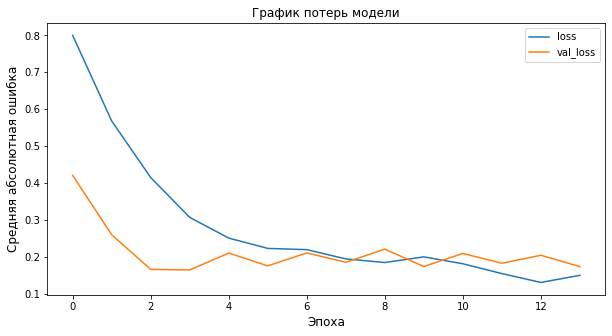

In [232]:
# Построение графика потерь модели
model_loss_plot(history_mn)

3/3 [==============================] - 0s 2ms/step


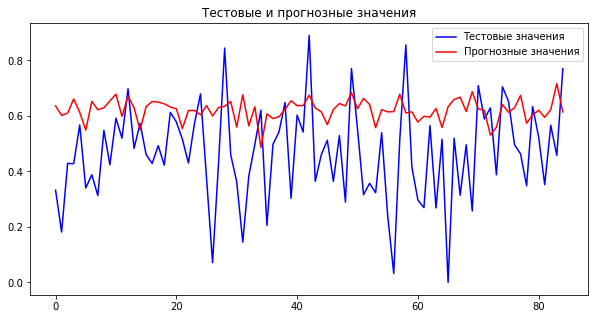

In [233]:
# Построение графика оригинального и прогнозного значения y
pred_mn = model_mn.predict(np.array((X_test_mn)))
original_mn = y_test_mn.values
predicted_mn = pred_mn

actual_and_predicted_plot(original_mn, predicted_mn)

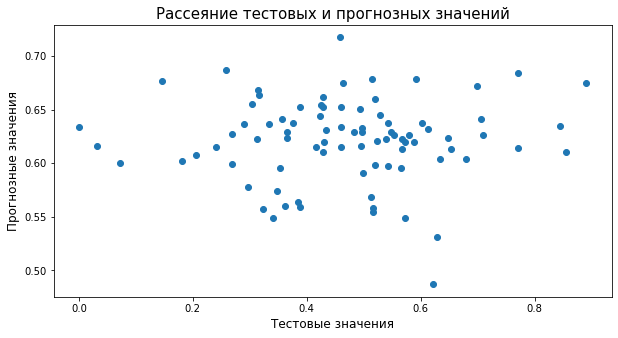

In [234]:
# Построение точечного графика рассеяния тестового и прогнозного значения y
actual_and_predicted_scatter(original_mn, predicted_mn)

In [235]:
# Вывод результата ошибки модели прогноза y
print(f'Model MAE: {model_mn.evaluate(X_test_mn, y_test_mn)}')

3/3 [==============================] - 0s 2ms/step - loss: 0.1901
Model MAE: 0.1900573968887329


In [236]:
# Вывод результата средней абсолютной ошибки модели прогноза y
print(f'MAE среднего значения: {np.mean(np.abs(y_test_mn-np.mean(y_test_mn)))}')

MAE среднего значения: Соотношение матрица-наполнитель    0.134129
dtype: float64


C:\ProgramData\Anaconda3\lib\site-packages\numpy\core\fromnumeric.py:3438: FutureWarning: In a future version, DataFrame.mean(axis=None) will return a scalar mean over the entire DataFrame. To retain the old behavior, use 'frame.mean(axis=0)' or just 'frame.mean()'
  return mean(axis=axis, dtype=dtype, out=out, **kwargs)


Вывод: средняя абсолютная ошибка модели прогноза по рассматриваемым моделям сетей примерно в тех же границах, что и при использовании других методов